In [1]:
import numpy as np
import pandas as pd
import Bio
from Bio import PDB
from Bio.PDB import PDBParser
from Bio.PDB import PDBIO
import matplotlib.pylab as plt
import matplotlib
import os
from os import listdir
from os.path import isfile, join, isdir
from matplotlib import rc
rc('font', **{'family': 'serif', 'serif': ['Computer Modern'], 'size' : 12})
rc('text', usetex=True)
import pandas as pd
from sklearn import metrics
from numpy.linalg import norm
from scipy.stats import spearmanr, pearsonr, kendalltau
import pickle
import re
from sklearn import svm
from sklearn.decomposition import PCA
import matplotlib
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import glob
%matplotlib inline

## Importing the local files I have written

import sys
sys.path.append('/Users/jakesumner/Documents/GitHub/PPI-graph_autoencoder/')

import create_protein_graph_structure
from create_protein_graph_structure import *

figure_save_dir = "/Users/jakesumner/OneDrive/Desktop/Yale CBB/OHern Lab/PPI_PRE_resubmit/resubmit_figures"

font_size = 16
fontsize = font_size

In [2]:
def create_prob_dist_identical_bins(data, fig, ax, bins = [], n_bins = 100, color = "black", label = None, alpha = 1.0, marker = "o"):
    '''
    plots a probability distribution from the data provided
    '''
    if bins == []:
        bins = np.linspace(min(data),max(data),n_bins)
        bin_range = abs(bins[1]-bins[0])
        bins = np.array([min(bins)-bin_range] + list(bins) + [max(bins) + bin_range])
    
    n, bins, patches = ax.hist(data, bins=bins, density=True, histtype= "step", alpha = 0)
    bins = np.delete(bins, -1)
    bins += abs(bins[1]-bins[0])/2
    
    
    ax.plot(bins, n, marker=marker, color=color, markerfacecolor='none', label = label, alpha = alpha)
    
    x = np.array(bins)
    y = np.array(n)
    
    return x, y

In [3]:
os.chdir("/Users/jakesumner/Desktop/")

bm55_corr_df = pd.read_csv("zdock_benchmark55_correlation_data.csv")

In [4]:
os.chdir("/Users/jakesumner/Desktop/PPI Project_2/supersampling/final_manuscript_datasets")

ss_corr_df = pd.read_csv("supersampled_correlation_dataset_final_manuscript.csv")
relaxed_corr_df = pd.read_csv("non_supersampled_correlation_dataset_final_manuscript.csv")

## Combining the original correlation dataset and the BM55 dataset

In [5]:
ss_corr_df

,Unnamed: 0,pdb,pearson_ialign_zrank,pearson_ialign_hdock,pearson_ialign_rosetta,pearson_ialign_pydock,pearson_ialign_voromqa,pearson_ialign_voromqa_js,pearson_ialign_dove_5,pearson_ialign_intertwined,...,contact_43_auc,contact_44_auc,contact_45_auc,interface_rsa_auc,itscorepp_auc,flatness_p3,resolution,complex_sasa,monomer_sasa,relative_interface_sasa
0,0,1acb,-0.717506,-0.572495,-0.818415,-0.742908,0.774556,0.848402,0.564269,-0.550571,...,0.762547,0.764547,0.764325,0.644104,0.772073,0.975254,2.00,13210.040041,14768.793567,0.105544
1,1,1ay7,-0.804331,-0.644121,-0.720965,-0.518193,0.524763,0.730545,0.788741,-0.439244,...,0.856978,0.855582,0.855477,0.866396,0.852197,0.986755,1.70,9183.406105,10429.633791,0.119489
2,2,1c3a,-0.965753,-0.961120,-0.938805,-0.954437,0.768060,0.969857,-0.877749,-0.791142,...,0.984526,0.984476,0.985112,0.987780,0.991357,0.928116,2.50,13225.609142,16856.480544,0.215399
3,3,1euv,-0.903749,-0.810849,-0.561124,-0.861152,0.159493,0.793307,0.497068,-0.812000,...,0.964044,0.962955,0.962283,0.955443,0.966066,0.977500,1.60,14257.751994,16597.227354,0.140956
4,4,1f60,-0.934282,-0.954465,-0.874791,-0.824968,0.788822,0.839942,-0.579722,-0.814475,...,0.961521,0.961780,0.961856,0.964506,0.971226,0.968571,1.67,22759.106785,26255.747109,0.133176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,79,6zbk,-0.781797,-0.774058,-0.835361,-0.678408,0.624669,0.850289,0.749478,-0.432070,...,0.870750,0.869815,0.870923,0.903562,0.925137,0.988550,1.49,10502.811829,12380.058724,0.151635
80,80,7bxh,-0.804953,-0.820440,-0.814243,-0.720781,0.732772,0.929094,-0.467024,-0.319278,...,0.934254,0.934713,0.933303,0.882509,0.937586,0.977949,2.70,24004.295239,26437.741182,0.092044
81,81,7joe,-0.777183,-0.849470,-0.664958,-0.580647,0.694228,0.888198,0.623389,-0.771127,...,0.867603,0.869121,0.872491,0.871404,0.915791,0.972420,2.60,16411.454745,18374.501339,0.106835
82,82,7jxv,-0.619194,-0.622669,-0.477439,-0.504229,0.413785,0.575321,0.558159,0.088424,...,0.685357,0.688350,0.691165,0.722158,0.829122,0.994932,2.35,16126.311027,17441.072942,0.075383


In [6]:
bm55_corr_df

,Unnamed: 0,pdb,pearson_ialign_zrank,pearson_ialign_rosetta,pearson_ialign_pydock,pearson_ialign_voromqa,pearson_ialign_itscorepp,pearson_ialign_deeprank_gnn_esm,pearson_dockq_zrank,pearson_dockq_rosetta,...,spearman_dockq_pydock,spearman_dockq_voromqa,spearman_dockq_itscorepp,spearman_dockq_deeprank_gnn_esm,zrank_auc,rosetta_auc,pydock_auc,voromqa_auc,itscorepp_auc,deeprank_gnn_esm_auc
0,0,1atn,-0.701748,-0.814185,-0.765695,0.755898,-0.773925,0.213292,-0.679654,-0.801201,...,-0.694023,0.741217,-0.685142,0.305989,0.843138,0.904464,0.893941,0.931399,0.879778,0.637080
1,1,1avx,-0.754668,-0.423879,-0.693153,0.695567,-0.884624,0.821207,-0.756576,-0.411842,...,-0.716679,0.701260,-0.866662,0.845152,0.882878,0.680732,0.848885,0.860640,0.946544,0.938535
2,2,1bkd,-0.924694,-0.808379,-0.811108,0.625071,-0.934335,0.853222,-0.926980,-0.790738,...,-0.763974,0.723978,-0.907601,0.866004,0.955087,0.867340,0.927300,0.863130,0.965019,0.942292
3,3,1buh,-0.492417,-0.246302,-0.636306,0.647249,-0.685874,0.271406,-0.478806,-0.221350,...,-0.691726,0.753957,-0.660055,0.235559,0.751289,0.588082,0.880398,0.887864,0.873865,0.606526
4,4,1bvn,-0.860333,-0.742462,-0.758543,0.565746,-0.856763,0.422170,-0.878961,-0.707210,...,-0.813614,0.437289,-0.873587,0.434093,0.941509,0.811410,0.937861,0.746090,0.949593,0.707875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,57,2uuy,-0.640163,-0.546956,0.055798,0.211420,-0.586004,0.882667,-0.609086,-0.512564,...,0.017687,0.113460,-0.529989,0.906612,0.729900,0.666689,0.402402,0.543574,0.701726,0.950437
58,58,2vdb,-0.760948,-0.549993,-0.720007,0.589503,-0.794037,0.208813,-0.696488,-0.527390,...,-0.655367,0.724777,-0.644790,0.252510,0.829084,0.754796,0.849886,0.893036,0.852528,0.609427
59,59,2z0e,-0.901351,-0.196637,-0.760310,0.715439,-0.880309,0.862561,-0.898535,-0.195870,...,-0.703977,0.735262,-0.784073,0.861474,0.938141,0.765593,0.870043,0.880241,0.921113,0.915680
60,60,3sgq,-0.162093,-0.679023,-0.224424,0.288138,-0.354094,0.891297,-0.087497,-0.692901,...,-0.268219,0.197243,-0.340168,0.914801,0.528666,0.786844,0.582124,0.610270,0.633284,0.959168


In [7]:
both_datasets_df = pd.concat([ss_corr_df, bm55_corr_df])

In [8]:
both_datasets_df

,Unnamed: 0,pdb,pearson_ialign_zrank,pearson_ialign_hdock,pearson_ialign_rosetta,pearson_ialign_pydock,pearson_ialign_voromqa,pearson_ialign_voromqa_js,pearson_ialign_dove_5,pearson_ialign_intertwined,...,contact_43_auc,contact_44_auc,contact_45_auc,interface_rsa_auc,itscorepp_auc,flatness_p3,resolution,complex_sasa,monomer_sasa,relative_interface_sasa
0,0,1acb,-0.717506,-0.572495,-0.818415,-0.742908,0.774556,0.848402,0.564269,-0.550571,...,0.762547,0.764547,0.764325,0.644104,0.772073,0.975254,2.00,13210.040041,14768.793567,0.105544
1,1,1ay7,-0.804331,-0.644121,-0.720965,-0.518193,0.524763,0.730545,0.788741,-0.439244,...,0.856978,0.855582,0.855477,0.866396,0.852197,0.986755,1.70,9183.406105,10429.633791,0.119489
2,2,1c3a,-0.965753,-0.961120,-0.938805,-0.954437,0.768060,0.969857,-0.877749,-0.791142,...,0.984526,0.984476,0.985112,0.987780,0.991357,0.928116,2.50,13225.609142,16856.480544,0.215399
3,3,1euv,-0.903749,-0.810849,-0.561124,-0.861152,0.159493,0.793307,0.497068,-0.812000,...,0.964044,0.962955,0.962283,0.955443,0.966066,0.977500,1.60,14257.751994,16597.227354,0.140956
4,4,1f60,-0.934282,-0.954465,-0.874791,-0.824968,0.788822,0.839942,-0.579722,-0.814475,...,0.961521,0.961780,0.961856,0.964506,0.971226,0.968571,1.67,22759.106785,26255.747109,0.133176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,57,2uuy,-0.640163,NaN,-0.546956,0.055798,0.211420,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.701726,NaN,NaN,NaN,NaN,NaN
58,58,2vdb,-0.760948,NaN,-0.549993,-0.720007,0.589503,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.852528,NaN,NaN,NaN,NaN,NaN
59,59,2z0e,-0.901351,NaN,-0.196637,-0.760310,0.715439,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.921113,NaN,NaN,NaN,NaN,NaN
60,60,3sgq,-0.162093,NaN,-0.679023,-0.224424,0.288138,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.633284,NaN,NaN,NaN,NaN,NaN


## loading in other stuff for each target

In [9]:
## Load in the supersampled balanced dataset for each target

ss_balanced_dir = "/Users/jakesumner/Desktop/PPI Project_2/supersampling/all_supersampled_balanced_datasets"
os.chdir(ss_balanced_dir)

pdb_list = list(ss_corr_df["pdb"])

all_csv_files = sorted([f for f in listdir(ss_balanced_dir) if isfile(join(ss_balanced_dir, f)) and ".csv" in f and f[:4] in pdb_list])

ss_score_dict = {}
for csv_file in all_csv_files:
    pdb_name = csv_file[:4]
    ss_score_dict[pdb_name] = pd.read_csv(csv_file)

In [10]:
## Load in the pickle data

os.chdir("/Users/jakesumner/Desktop/PPI Project_2/")

with open("subsampling_400.pickle", "rb") as f:
    subsampling_400 = pickle.load(f)
    
with open("subsampling_200.pickle", "rb") as f:
    subsampling_200 = pickle.load(f)
    
with open("subsampling_100.pickle", "rb") as f:
    subsampling_100 = pickle.load(f)
    
with open("subsampling_50.pickle", "rb") as f:
    subsampling_50 = pickle.load(f)

In [11]:
not_supersampled_dir = "/Users/jakesumner/Desktop/PPI Project_2/supersampling/final_manuscript_all_unsupersampled_scores"
os.chdir(not_supersampled_dir)

all_csv_files = sorted([f for f in listdir(not_supersampled_dir) if isfile(join(not_supersampled_dir, f)) and ".csv" in f and f[:4] in pdb_list])

zdock_relaxed_combined_dfs = {}
for csv_file in all_csv_files:
    pdb_name = csv_file[:4]
    zdock_relaxed_combined_dfs[pdb_name] = pd.read_csv(csv_file)

In [12]:
exhaustive_dir = "/Users/jakesumner/Desktop/PPI Project_2/supersampling/exhaustive_all_targets"

os.chdir(exhaustive_dir)

exhaustive_corr_df = pd.read_csv("exhaustive_correlation_dataframe.csv")

exhaustive_score_dict = {}

csv_files = glob("*exhaustive_scores.csv")

for pdb_file in csv_files:
    pdb_name = pdb_file[:4]
    temp_df = pd.read_csv(pdb_file)
    
    exhaustive_score_dict[pdb_name] = temp_df


In [13]:
os.chdir("/Users/jakesumner/Desktop/PPI Project_2/supersampling")

target_file = "all_89_target_scores.txt"

temp_dict = {
    "pdb" : [],
    "ZRank" : [],
    "HDOCK" : [],
    "Rosetta" : [],
    "PyDock" : [],
    "VoroMQA" : []
}

first = True
keys = list(temp_dict.keys())
with open(target_file, "r") as f:
    for line in f:
        if first:
            first = False
            continue
            
        temp_vals = line.split()
        for i in range(len(temp_vals)):
            try:
                temp_dict[keys[i]].append(float(temp_vals[i]))
            except:
                temp_dict[keys[i]].append(temp_vals[i])
            
f.close()

target_score_df = pd.DataFrame(temp_dict)

ones = np.ones((89))
target_score_df["DockQ"] = ones
target_score_df["IS-Score"] = ones

In [14]:
## Figure 2 data loading

os.chdir("/Users/jakesumner/Desktop/PPI Project_2/supersampling/final_manuscript_datasets")

fig_2_1xg2_df = pd.read_csv("1xg2_relaxed_unsupersampled_data.csv")

with open("dockq_distribution_not_ss_energy_minimized.pickle", "rb") as f:
    avg_dockq_bins_relax = pickle.load(f)
    
with open("dockq_distribution_ss_after_energy_minimization.pickle", "rb") as f:
    after_dockq_mean = pickle.load(f)
    
with open("dockq_distribution_ss_before_energy_minimization.pickle", "rb") as f:
    before_dockq_mean = pickle.load(f)

In [15]:
all_pdbs = set(list(ss_corr_df["pdb"]))
grace_pdbs = set(['1spp', '3qc8', '2d5r', '1ka9', '3ona', '2wmp', '1itb', '2hth', '2hsm', '1kfu', '1ggp', '1pdk', '2hla', '2pe6', '1c3a', '2dvw', '3gfk', '2oul', '1tfo', '2nts', '1brb', '3k9p'])
jake_pdbs = all_pdbs - grace_pdbs
grace_pdbs = all_pdbs - jake_pdbs

print(sorted(list(grace_pdbs)))

['1c3a', '1ggp', '1itb', '1kfu', '1pdk', '1spp', '1tfo', '2d5r', '2dvw', '2hla', '2hsm', '2hth', '2oul', '2pe6', '2wmp', '3gfk', '3k9p', '3ona', '3qc8']


# Figure 1 Redo

In [16]:
## Read in the data

home_score_dir = "/Users/jakesumner/Desktop/PPI Project_2/supersampling/3rcz_exhaustive_sampling_test"
os.chdir(home_score_dir)

exhaustive_3rcz_df = pd.read_csv("exhaustively_sampled_3rcz.csv")

home_score_dir = "/Users/jakesumner/Desktop/PPI Project_2/supersampling/3ygs_exhaustive_sampling_test"
os.chdir(home_score_dir)

exhaustive_3ygs_df = pd.read_csv("exhaustively_sampled_3ygs.csv")

In [17]:
def make_hit_rate_plot_sample(sample_list, column = "ZRank", top_ranks = 50, dockq_cutoff = 0.23):
    '''
    Makes a hit rate plot from the score_dict. Hit rate is calculated based
    on the column name provided and the hit rate plot is calculated up to the
    top_ranks specified
    '''
    
    hit_rate_final = np.zeros((len(sample_list),top_ranks)) ## Create the hit rate plot y_axis
    hit_rate_x = range(1,top_ranks + 1)
    
    for i,temp_df in enumerate(sample_list):
        score_vals = np.array(temp_df[column]) ## gets the score column for each PDB
        dockq_vals = np.array(temp_df["DockQ"]) ## gets all of the CAPRI scores for the minimum
        
        ## Sorting the dataframes
        sort_vals = np.argsort(score_vals)
        score_vals = score_vals[sort_vals]
        dockq_vals = dockq_vals[sort_vals]
        
        hit_bool = False ## controls whether you found a positive
        for j in range(top_ranks):
            if dockq_vals[j] >= dockq_cutoff:
                ## Positive has been found in the top_ranks
                hit_bool = True
            if hit_bool:
                hit_rate_final[i,j] = 1
            else:
                hit_rate_final[i,j] = 0
                
    return np.mean(hit_rate_final, axis = 0), hit_rate_x


def sample_for_hit_rate_test(score_df, sample_list, top_ranks = 100, score_col = "ZRank"):
    '''
    Make a hit rate plot for each sample size in the sample
    list. Return a list of hit rate plot lists in the top_ranks. 
    '''
    
    ## Define DockQ Cutoff to use
    
    dockq_cutoff = 0.23
    
    ## init list to save hit rate data
    
    all_hit_rate_plots = []
    
    for n_samples in sample_list:
        
        temp_sample_list = []
        
        for i in range(1000):
            
            ## Get the random sample of the dataframe - no replacement
        
            temp_random_df = score_df.sample(n = n_samples, replace = False)
            
            temp_sample_list.append(temp_random_df)
            
        ## Get the hit rate and append to the list
        
        hit_rate_data, x_ax_vals = make_hit_rate_plot_sample(temp_sample_list, column = score_col,
                                                             top_ranks = top_ranks, dockq_cutoff = dockq_cutoff)
        all_hit_rate_plots.append(hit_rate_data)
        
    return all_hit_rate_plots 
        
            

In [18]:
## Run the samples

sample_list = [500, 1000, 2000, 5000, 10000, 15000]

score_fxn = 'Rosetta'

sampled_hit_data_3rcz = sample_for_hit_rate_test(exhaustive_3rcz_df, sample_list, score_col = score_fxn)

sampled_hit_data_3ygs = sample_for_hit_rate_test(exhaustive_3ygs_df, sample_list, score_col = score_fxn)

/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_31230/4055635387.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap("cividis")


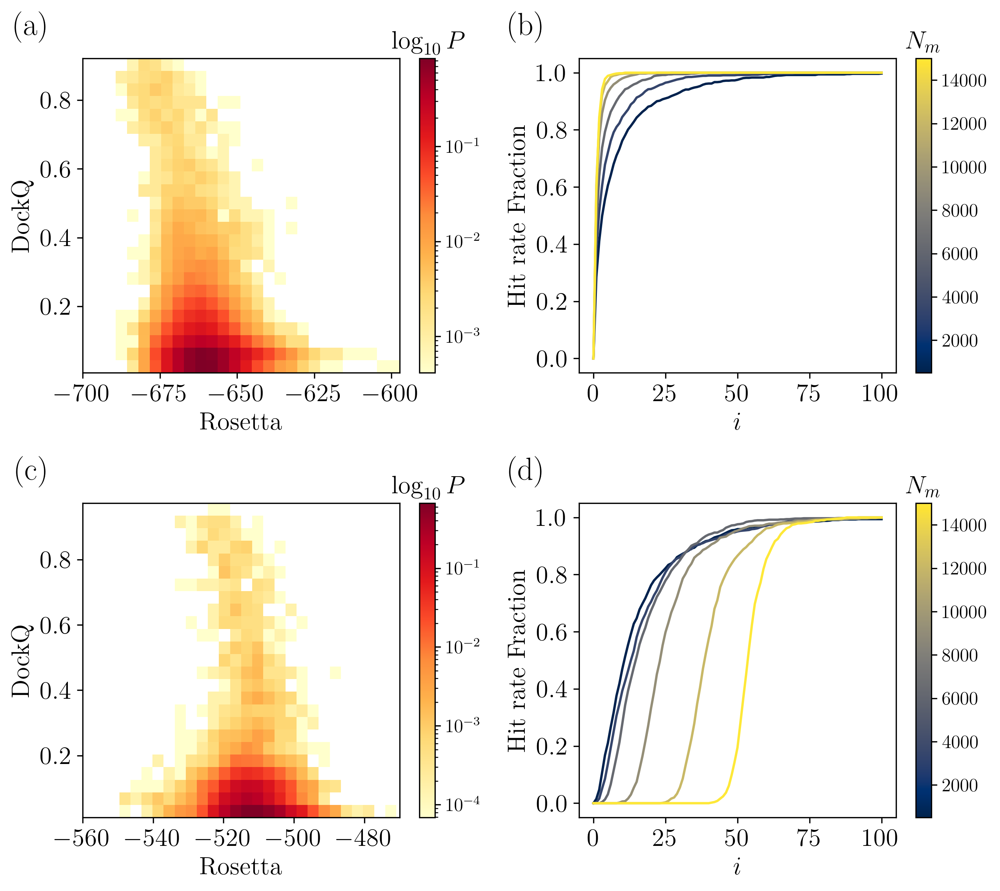

In [19]:
## Changing the hit rate plot to try and make it a PDF density plot with an inset of the supersampled data
import matplotlib
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

font_size = 16

fig, ax = plt.subplots(2,2, figsize = (9,8), dpi = 300)

cmap = matplotlib.cm.get_cmap("cividis")
color_vals = np.linspace(0,1,len(sample_list))
colors = [cmap(color_vals[i]) for i in range(len(sample_list))]

top_ranks = 100
x_axis = range(0, top_ranks + 1)

score_1 = "Rosetta"

### Exhaustively sampled data
temp_3rcz_df = exhaustive_3rcz_df[exhaustive_3rcz_df[score_1] < -590]
hh = ax[0,0].hist2d(temp_3rcz_df[score_1], temp_3rcz_df["DockQ"], norm = mcolors.LogNorm(), density = True,
                    bins = 25, cmap = "YlOrRd")

cbar_00 = plt.colorbar(hh[3], ax=ax[1,0])
cbar_00.ax.set_title("$\log_{10}P$", fontsize = font_size)

ax[0,0].set_xlabel("Rosetta", fontsize = font_size) 
ax[0,0].set_ylabel("DockQ", fontsize = font_size)

ax[0,0].set_xticks([-700, -675, -650, -625, -600])


## Panel B

for i, sample in enumerate(sampled_hit_data_3rcz):
    ax[0,1].plot(x_axis,[0] + list(sample), color = colors[i], label = str(sample_list[i]))

    
ax[0,1].set_xlabel("$i$", fontsize = font_size) 
ax[0,1].set_ylabel("Hit rate Fraction", fontsize = font_size)

ax[0,1].set_xticks([0, 25, 50, 75, 100])

## Panel C

### Exhaustively sampled data
hh = ax[1,0].hist2d(exhaustive_3ygs_df[score_1], exhaustive_3ygs_df["DockQ"], norm = mcolors.LogNorm(), bins = 25, 
                    density = True, cmap = "YlOrRd")

cbar_10 = plt.colorbar(hh[3], ax=ax[0,0])
cbar_10.ax.set_title("$\log_{10}P$", fontsize = font_size)

ax[1,0].set_xticks([-560, -540, -520, -500, -480])
ax[1,0].set_xlim([-560, -470])

ax[1,0].set_xlabel("Rosetta", fontsize = font_size) 
ax[1,0].set_ylabel("DockQ", fontsize = font_size)


## Panel D

for i, sample in enumerate(sampled_hit_data_3ygs):
    ax[1,1].plot(x_axis,[0] + list(sample), color = colors[i], label = str(sample_list[i]))

    
ax[1,1].set_xlabel("$i$", fontsize = font_size) 
ax[1,1].set_ylabel("Hit rate Fraction", fontsize = font_size)

ax[1,1].set_xticks([0, 25, 50, 75, 100])

## Colorbar

cmap = matplotlib.colormaps['cividis']
norm = matplotlib.colors.Normalize(vmin=500, vmax=15000)
sm = matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

cbar1 = plt.colorbar(sm, ax = ax[1,1])
cbar1.ax.set_title("$N_m$", fontsize = font_size)
cbar2 = plt.colorbar(sm, ax = ax[0,1])
cbar2.ax.set_title("$N_m$", fontsize = font_size)

## Formatting the figure

ax[0,0].tick_params(axis='both', which='major', labelsize=font_size)
ax[0,1].tick_params(axis='both', which='major', labelsize=font_size)
ax[1,0].tick_params(axis='both', which='major', labelsize=font_size)
ax[1,1].tick_params(axis='both', which='major', labelsize=font_size)


ax[0,0].text(-0.1, 1.15, "(a)", transform=ax[0,0].transAxes,fontsize=int(font_size*1.3), fontweight='bold', va='top', ha='right')
ax[0,1].text(-0.1, 1.15, "(b)", transform=ax[0,1].transAxes,fontsize=int(font_size*1.3), fontweight='bold', va='top', ha='right')
ax[1,0].text(-0.1, 1.15, "(c)", transform=ax[1,0].transAxes,fontsize=int(font_size*1.3), fontweight='bold', va='top', ha='right')
ax[1,1].text(-0.1, 1.15, "(d)", transform=ax[1,1].transAxes,fontsize=int(font_size*1.3), fontweight='bold', va='top', ha='right')



fig.tight_layout()
# plt.savefig(join(figure_save_dir, "3rcz_3ygs_hitrate_sampling.png"))

/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_31230/431713243.py:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap("cividis")
/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_31230/431713243.py:141: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


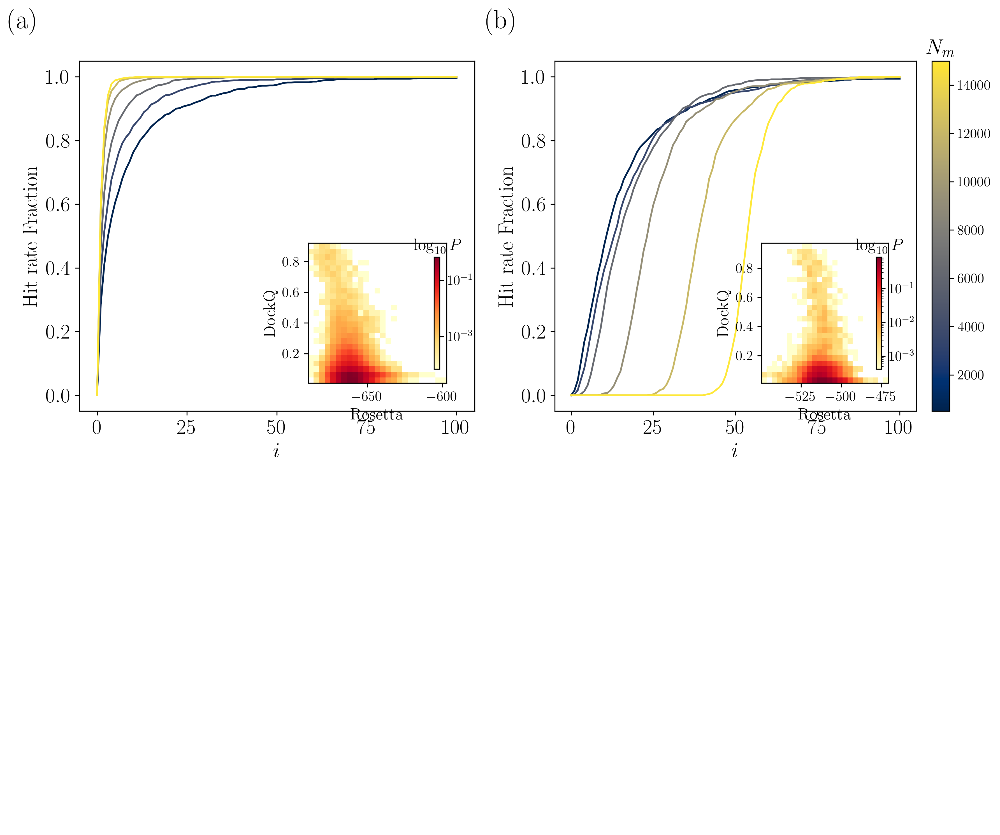

In [20]:
import matplotlib
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

font_size = 18

# Bigger figure
fig, ax = plt.subplots(2, 2, figsize=(12, 10), dpi=300)

# Top row (A, B)
ax_A = ax[0, 0]   # 3RCZ hit-rate (panel A)
ax_B = ax[0, 1]   # 3YGS hit-rate (panel B)

# Bottom row currently unused
ax[1, 0].axis("off")
ax[1, 1].axis("off")

# ---- Insets: slightly inward from bottom-right ----
inset_A = inset_axes(
    ax_A,
    width="35%", height="40%",
    loc="lower right",
    borderpad=2.0      # larger -> moves more toward center
)
inset_B = inset_axes(
    ax_B,
    width="35%", height="40%",
    loc="lower right",
    borderpad=2.0
)

# Colors for line plots
cmap = matplotlib.cm.get_cmap("cividis")
color_vals = np.linspace(0, 1, len(sample_list))
colors = [cmap(color_vals[i]) for i in range(len(sample_list))]

top_ranks = 100
x_axis = range(0, top_ranks + 1)
score_1 = "Rosetta"

# ============================================================
# Panel A — Hit-rate curves (3RCZ)
# ============================================================
for i, sample in enumerate(sampled_hit_data_3rcz):
    ax_A.plot(x_axis, [0] + list(sample), color=colors[i], label=str(sample_list[i]))

ax_A.set_xlabel(r"$i$", fontsize=font_size)
ax_A.set_ylabel("Hit rate Fraction", fontsize=font_size)
ax_A.set_xticks([0, 25, 50, 75, 100])

ax_A.text(
    -0.1, 1.15, "(a)",
    transform=ax_A.transAxes,
    fontsize=int(font_size * 1.3),
    fontweight="bold",
    va="top", ha="right"
)

# ============================================================
# Panel B — Hit-rate curves (3YGS)
# ============================================================
for i, sample in enumerate(sampled_hit_data_3ygs):
    ax_B.plot(x_axis, [0] + list(sample), color=colors[i], label=str(sample_list[i]))

ax_B.set_xlabel(r"$i$", fontsize=font_size)
ax_B.set_ylabel("Hit rate Fraction", fontsize=font_size)
ax_B.set_xticks([0, 25, 50, 75, 100])

ax_B.text(
    -0.1, 1.15, "(b)",
    transform=ax_B.transAxes,
    fontsize=int(font_size * 1.3),
    fontweight="bold",
    va="top", ha="right"
)

# ============================================================
# Inset for 3RCZ (inside panel A)
# ============================================================
temp_3rcz_df = exhaustive_3rcz_df[exhaustive_3rcz_df[score_1] < -590]
hh_A = inset_A.hist2d(
    temp_3rcz_df[score_1],
    temp_3rcz_df["DockQ"],
    norm=mcolors.LogNorm(),
    density=True,
    bins=25,
    cmap="YlOrRd"
)

# Small colorbar inside inset A
cax_A = inset_axes(inset_A, width="4%", height="80%", loc="right", borderpad=0.5)
cbar_A = plt.colorbar(hh_A[3], cax=cax_A)
cbar_A.ax.set_title(r"$\log_{10}P$", fontsize=font_size - 4)

inset_A.set_xlabel("Rosetta", fontsize=font_size - 4)
inset_A.set_ylabel("DockQ", fontsize=font_size - 4)
inset_A.tick_params(axis="both", labelsize=font_size - 6)

# ============================================================
# Inset for 3YGS (inside panel B)
# ============================================================
hh_B = inset_B.hist2d(
    exhaustive_3ygs_df[score_1],
    exhaustive_3ygs_df["DockQ"],
    norm=mcolors.LogNorm(),
    density=True,
    bins=25,
    cmap="YlOrRd"
)

# Small colorbar inside inset B
cax_B = inset_axes(inset_B, width="4%", height="80%", loc="right", borderpad=0.5)
cbar_B = plt.colorbar(hh_B[3], cax=cax_B)
cbar_B.ax.set_title(r"$\log_{10}P$", fontsize=font_size - 4)

inset_B.set_xlabel("Rosetta", fontsize=font_size - 4)
inset_B.set_ylabel("DockQ", fontsize=font_size - 4)
inset_B.tick_params(axis="both", labelsize=font_size - 6)

# ============================================================
# Shared colorbar for N_m (line colors in A and B)
# ============================================================
norm = matplotlib.colors.Normalize(vmin=500, vmax=15000)
sm = matplotlib.cm.ScalarMappable(norm=norm, cmap="cividis")
sm.set_array([])

# One vertical colorbar on the right side of panel B
cbar_main = fig.colorbar(
    sm,
    ax=ax_B,
    orientation="vertical",
    fraction=0.046,
    pad=0.04
)
cbar_main.ax.set_title(r"$N_m$", fontsize=font_size)

# Formatting / layout
ax_A.tick_params(axis="both", which="major", labelsize=font_size)
ax_B.tick_params(axis="both", which="major", labelsize=font_size)

fig.tight_layout()
# plt.savefig(join(figure_save_dir, "hitrate_inset_AB_top_vertNm.png"))


## Old fig 2 shit

In [21]:
from scipy.stats import spearmanr

def create_random_mask(n):
    
    rng = np.random.Generator(np.random.PCG64())
    rng = np.random.default_rng()

    # generates 0 or 1 randomly
    value = rng.integers(low=0, high=2, size=n)

    choice_a = np.array([-1,1])
    mask = np.random.choice(choice_a, size = n)
    
    return value*mask

def create_distribution_with_given_fraction(score_df, var_frac):
    '''
    Randomly varies the points of the negatives while keeping the
    positives static. Terminates when the fraction of the 
    [n(neg) < min(pos)]/n(neg) goes below the
    "var_frac" parameter
    '''
    
    ## Split the score_df into positives and negatives
    
    pos_x_data = score_df[score_df["DockQ"] >= 0.23]["ZRank"]
    pos_y_data = score_df[score_df["DockQ"] >= 0.23]["DockQ"]
    neg_x_data = np.array(score_df[score_df["DockQ"] < 0.23]["ZRank"])
    neg_y_data = score_df[score_df["DockQ"] < 0.23]["DockQ"]
    
    len_negs = len(neg_x_data)
    
    
    ## Define the perturbation that can happen with each step
    eta = 0.005
    
    ## initialize the current correlation value
    frac_curr = 0
    
    safety_count = 1000000 ## Just to avoid an infinite loop
    i = 0
    pos_min = min(pos_x_data)
    while True:
        if i > safety_count:
            print("SAFETY COUNT REACHED")
            break
        ## Create random array for x
        
        if frac_curr >= var_frac:
            break
        
        rand_x = create_random_mask(len_negs) * eta
        
        ## Apply the random array to x, which determines whether the points move
        
        neg_x_data = neg_x_data + rand_x
        
        ## Calculate the variance fraction!
    
        frac_curr = len(neg_x_data[neg_x_data < pos_min])/len(neg_x_data)
        
        i+=1
        
    
    ## Recreate the DF for output purposes
    
    temp_dict = {"ZRank" : [], "DockQ" : []}
    
    temp_dict["ZRank"] += list(pos_x_data)
    temp_dict["ZRank"] += list(neg_x_data)
    temp_dict["DockQ"] += list(pos_y_data)
    temp_dict["DockQ"] += list(neg_y_data)
    
    
    print(frac_curr)
    return pd.DataFrame(temp_dict)
    

def get_cutoff_imbalanced_set(cutoff_x, df_list, imbalance_fraction = 0.5):

    unbalanced_list_95 = []

    sample_list = [500, 1000, 2000, 5000, 10000, 15000, 30000, 45000]

    score_fxn = 'ZRank' ## again, placeholder for the "score"

    hit_rate_list_95 = []

    for i in range(5):
        print(i)
        temp_unbal_list = create_unbalanced_dataset(df_list[i], imbalance_fraction, cutoff_x = cutoff_x)
        unbalanced_list_95.append(temp_unbal_list)
        hit_rate_list_95.append(sample_for_hit_rate_test_supp(temp_unbal_list, sample_list, score_col = score_fxn, dockq_cutoff = 0.23))
        
    return unbalanced_list_95, hit_rate_list_95

def create_unbalanced_dataset(example_df, imbalance_fraction, cutoff_x = -100000, cutoff_y = 0.23):
    
    '''
    Imbalance fraction is how much of the data you want below the cutoff
    '''
    
    ## Apply both cutoffs to the high data
    high_df = example_df[example_df["DockQ"] >= cutoff_y]
    high_df = high_df[high_df["ZRank"]>= cutoff_x]
    
    low_df = example_df[example_df["DockQ"] < cutoff_y]

    
    total_num = round(len(low_df)/imbalance_fraction)
    high_num = total_num - len(low_df)
    
    high_df_sample = high_df.sample(n = high_num, replace = False)

    combined_df = pd.concat([high_df_sample, low_df])
    
    return combined_df

def make_hit_rate_plot_sample_supp(sample_list, column = "ZRank", top_ranks = 50, dockq_cutoff = 0.23):
    '''
    Makes a hit rate plot from the score_dict. Hit rate is calculated based
    on the column name provided and the hit rate plot is calculated up to the
    top_ranks specified
    '''
    
    hit_rate_final = np.zeros((len(sample_list),top_ranks)) ## Create the hit rate plot y_axis
    hit_rate_x = range(1,top_ranks + 1)
    
    for i,temp_df in enumerate(sample_list):
        score_vals = np.array(temp_df[column]) ## gets the score column for each PDB
        dockq_vals = np.array(temp_df["DockQ"]) ## gets all of the CAPRI scores for the minimum
        
        ## Sorting the dataframes
        sort_vals = np.argsort(score_vals)
#         sort_vals = np.flip(sort_vals)
        score_vals = score_vals[sort_vals]
        dockq_vals = dockq_vals[sort_vals]
        
        hit_bool = False ## controls whether you found a positive
        for j in range(top_ranks):
            if dockq_vals[j] >= dockq_cutoff:
                ## Positive has been found in the top_ranks
                hit_bool = True
            if hit_bool:
                hit_rate_final[i,j] = 1
            else:
                hit_rate_final[i,j] = 0
                
    return np.mean(hit_rate_final, axis = 0), hit_rate_x


def sample_for_hit_rate_test_supp(score_df, sample_list, top_ranks = 100, score_col = "ZRank", dockq_cutoff = 0.23):
    '''
    Make a hit rate plot for each sample size in the sample
    list. Return a list of hit rate plot lists in the top_ranks. 
    '''
    
    ## init list to save hit rate data
    
    all_hit_rate_plots = []
    
    for n_samples in sample_list:
                
        temp_sample_list = []
        
        for i in range(1000):
            
            ## Get the random sample of the dataframe - no replacement
        
            temp_random_df = score_df.sample(n = n_samples, replace = False)
            
            temp_sample_list.append(temp_random_df)
            
        ## Get the hit rate and append to the list
        
        hit_rate_data, x_ax_vals = make_hit_rate_plot_sample_supp(temp_sample_list, column = score_col,
                                                             top_ranks = top_ranks, dockq_cutoff = dockq_cutoff)
        all_hit_rate_plots.append(hit_rate_data)
        
    return all_hit_rate_plots
    
    
## Function to do the hit rate plot that Alex and Corey want me to do

def hit_rate_all_targets_sampling(score_dict, sample_list, highest_rank = 100, score_col = "ZRank", dockq_cutoff = 0.23):
    '''
    Performs sampling of the score dict according to the sample list and then 
    finds the hit rate using the highest_rank and the score_col. The 
    DockQ cutoff can be changed as well to change what is defined as a 'hit' or not
    '''
    
    final_pdb_list = []
    final_hr_list = []
    
    ## got through all the PDBs and perform sampling on the exhaustive dataset
    for pdb_name, score_df in score_dict.items():
        
#         try:
#             test_hr = sample_for_hit_rate_test_supp(score_df, sample_list, top_ranks = highest_rank, 
#                                                     score_col = score_col, dockq_cutoff = dockq_cutoff)

#             final_pdb_list.append(pdb_name)

#             ## Save only the last element of the list for each sample test
#             test_arr = np.array(test_hr)
#             final_hr_list.append(test_arr.T[-1,:])
            
#         except:
#             print("FAILED ON PDB:", pdb_name)
                
    
        test_hr = sample_for_hit_rate_test_supp(score_df, sample_list, top_ranks = highest_rank, 
                                                    score_col = score_col, dockq_cutoff = dockq_cutoff)

        final_pdb_list.append(pdb_name)

        ## Save only the last element of the list for each sample test
        test_arr = np.array(test_hr)
        final_hr_list.append(test_arr.T[-1,:])
    ## Quickly make a dictionary of the data
    
    temp_dict = {"pdb": final_pdb_list, "final_hr": final_hr_list}
    
    return temp_dict

## Code to get the AUC with balancing extreme to work

def get_indiv_ROC_curve(score_df, col_name = "ZRank", dockq_cutoff = 0.23, factor = -1):
    '''
    Simply aggregates all the score and label data across all targets in a dataframe and 
    then turns them into ROC curve data
    '''
    
    temp_mask, temp_scores = create_ROC_data_struc_dockq(score_df, col_name = col_name, dockq_cutoff = dockq_cutoff)
    roc_curve = metrics.roc_curve(temp_mask, factor*np.array(temp_scores), pos_label=1)
    roc_auc = metrics.roc_auc_score(temp_mask, factor*np.array(temp_scores))
    
    return roc_curve, roc_auc

def create_unbalanced_dataset(example_df, imbalance_fraction, cutoff = 0.23):
    
    '''
    Imbalance fraction is how much of the data you want below the cutoff
    '''
    
    high_df = example_df[example_df["DockQ"] >= cutoff]
    low_df = example_df[example_df["DockQ"] < cutoff]

    
    total_num = round(len(low_df)/imbalance_fraction)
    high_num = total_num - len(low_df)
    
    print(len(high_df), high_num)
        
    high_df_sample = high_df.sample(n = high_num, replace = False)

    combined_df = pd.concat([high_df_sample, low_df])
    
    return combined_df

def create_unbalanced_dataset_negs(example_df, imbalance_fraction, cutoff = 0.23):
    
    '''
    Imbalance fraction is how much of the data you want above the cutoff
    '''
    
    high_df = example_df[example_df["DockQ"] >= cutoff]
    low_df = example_df[example_df["DockQ"] < cutoff]

    
    total_num = round(len(high_df)/(1-imbalance_fraction))
    low_num = total_num - len(high_df)
    
    print(len(low_df), low_num)
        
    low_df_sample = low_df.sample(n = low_num, replace = False)

    combined_df = pd.concat([high_df, low_df_sample])
    
    return combined_df

def conduct_unbalancing_test_targets(score_df, frac_list):
    '''
    Conduct the unbalancing test to test
    AUC to the extreme
    '''
    
    roc_curve_list = []
    roc_auc_list = []
    
    for fraction in frac_list:
        
        temp_df = create_unbalanced_dataset_negs(score_df, fraction)
        
        roc_curve, roc_auc = get_indiv_ROC_curve(temp_df, col_name = "ZRank")
        
        roc_curve_list.append(roc_curve)
        roc_auc_list.append(roc_auc)
        
        
    return roc_curve_list, roc_auc_list

def conduct_unbalancing_test(score_df, frac_list):
    '''
    Conduct the unbalancing test to test
    AUC to the extreme
    '''
    
    roc_curve_list = []
    roc_auc_list = []
    
    for fraction in frac_list:
        
        temp_df = create_unbalanced_dataset(score_df, fraction)
        
        roc_curve, roc_auc = get_indiv_ROC_curve(temp_df, col_name = "ZRank")
        
        roc_curve_list.append(roc_curve)
        roc_auc_list.append(roc_auc)
        
        
    return roc_curve_list, roc_auc_list
        
def create_ROC_data_struc_dockq(score_df, col_name = "ZRank", dockq_cutoff = 0.23):
    '''
    Takes the score_df (DataFrame) and a given 'col_name' which corresponds to one of the columns 
    in the dataframe and some quality metric, which is what treats the data as a true positive. 
    True positives are labeled with a 1 and false positives are labeled with a 0.
    '''
    
    temp_scores = score_df[col_name]
    temp_dockq = score_df["DockQ"]
    
    ## Get the label array for the capri scores
    score_mask = np.zeros(temp_dockq.size)
    temp_dockq = list(temp_dockq)
    for i in range(len(score_mask)):
#         print(temp_dockq[i])
        if temp_dockq[i] >= dockq_cutoff:
            score_mask[i] = 1
    
    return score_mask, temp_scores


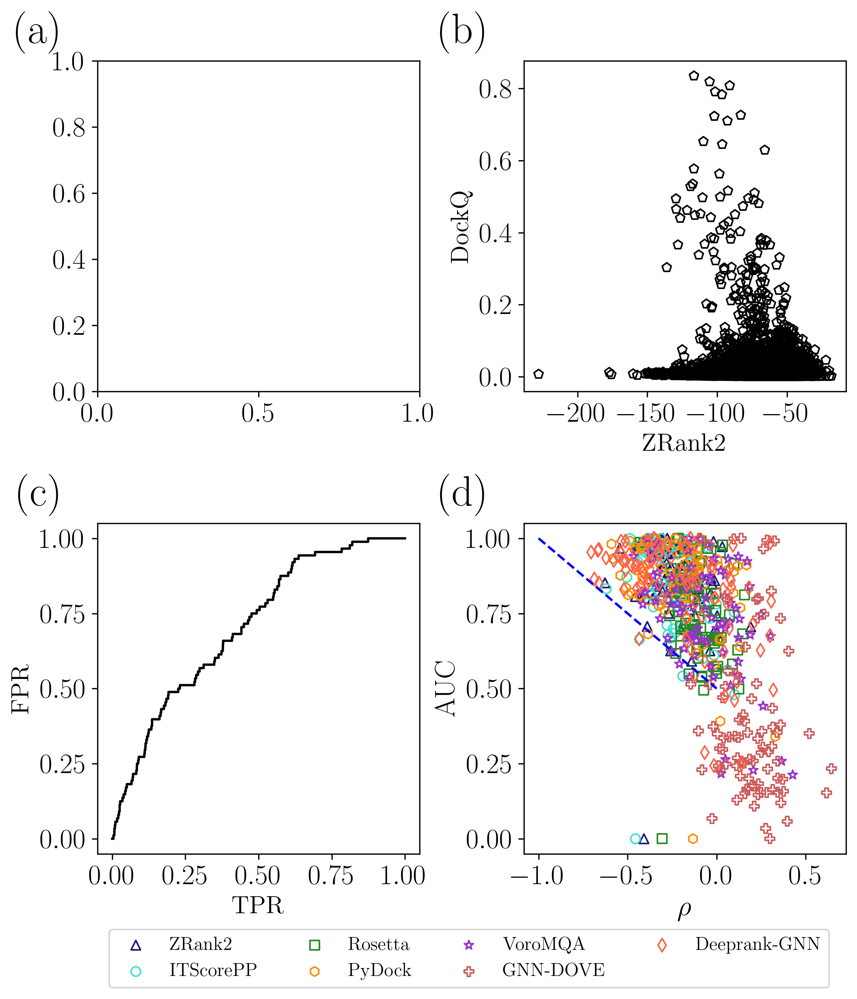

In [22]:
fig, ax = plt.subplots(2,2, figsize=(8,8.5), dpi = 300)

#### Panel A ####

# import matplotlib

# fontsize = 16

# cmap = matplotlib.cm.get_cmap('gist_ncar')

# colormap_colors = cmap(list(np.linspace(0,1,84)))

# for i,line_data in enumerate(all_sampling_hr_dict["final_hr"]):
#     ax[0,0].plot(np.array(sample_list)/10000, line_data, marker = "X", markerfacecolor = "None",
#             alpha = 0.5, color = colormap_colors[i])


# ax[0,0].set_xlabel(r"$\frac{N_{m}}{N_{t}}$", fontsize = fontsize)
# ax[0,0].set_ylabel("Hit Rate Fraction", fontsize = fontsize)

# ax[0,0].set_xticks([0,0.25, 0.5, 0.75, 1.0])


#### Panel B ####

temp_target = "3u82"
score_df = exhaustive_score_dict[temp_target]

temp_score = "ZRank"
ax[0,1].scatter(score_df[temp_score], score_df["DockQ"], marker = "p", color = "black", facecolor = "None")

# ax[0,1].plot(np.unique(score_df[temp_score]), np.poly1d(np.polyfit(score_df[temp_score], score_df["DockQ"], 1))(np.unique(score_df[temp_score])),
#             color = "red", linestyle = "--")

ax[0,1].set_xlabel("ZRank2", fontsize = fontsize)
ax[0,1].set_ylabel("DockQ", fontsize = fontsize)

ax[0,1].set_xticks([-200, -150, -100, -50])

# print("Pearson correlation for Panel B:", pearsonr(score_df[temp_score], score_df["DockQ"])[0])

#### Panel C ####

roc_curve, roc_auc = get_indiv_ROC_curve(score_df, col_name = "ZRank", dockq_cutoff = 0.23, factor = -1)

ax[1,0].plot(roc_curve[0], roc_curve[1], color = "black")

ax[1,0].set_xlabel("TPR", fontsize = fontsize)
ax[1,0].set_ylabel("FPR", fontsize = fontsize)

ax[1,0].set_xticks([0,0.25, 0.5, 0.75, 1.0])
ax[1,0].set_yticks([0,0.25, 0.5, 0.75, 1.0])

#### Panel D ####

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

ax[1,1].scatter(exhaustive_corr_df["spearman_dockq_zrank"], exhaustive_corr_df["zrank_auc"], color = colors[0], marker = "^", facecolor = "None", label = "ZRank2")
ax[1,1].scatter(exhaustive_corr_df["spearman_dockq_itscorepp"], exhaustive_corr_df["itscorepp_auc"], color = colors[1], marker = "o", facecolor = "None", label = "ITScorePP")
ax[1,1].scatter(exhaustive_corr_df["spearman_dockq_rosetta"], exhaustive_corr_df["rosetta_auc"], color = colors[2], marker = "s", facecolor = "None", label = "Rosetta")
ax[1,1].scatter(exhaustive_corr_df["spearman_dockq_pydock"], exhaustive_corr_df["pydock_auc"], color = colors[3], marker = "h", facecolor = "None", label = "PyDock")
ax[1,1].scatter(np.array(exhaustive_corr_df["spearman_dockq_voromqa"])*-1, exhaustive_corr_df["voromqa_auc"], color = colors[4], marker = "*", facecolor = "None", label = "VoroMQA")
ax[1,1].scatter(exhaustive_corr_df["spearman_dockq_dove_5"], exhaustive_corr_df["dove_5_auc"], color = colors[5], marker = "P", facecolor = "None", label = "GNN-DOVE")
ax[1,1].scatter(np.array(exhaustive_corr_df["spearman_dockq_deeprank_gnn_esm"])*-1, exhaustive_corr_df["deeprank_gnn_esm_auc"], color = colors[6], marker = "d", facecolor = "None", label = "Deeprank-GNN")

## Y = -X

temp_x = np.linspace(-1, 0, 10)
temp_y = np.linspace(0.5, 1, 10)[::-1]
ax[1,1].plot(temp_x, temp_y, "b--", )

ax[1,1].set_xlabel(r"$\rho$", fontsize = font_size)
ax[1,1].set_ylabel("AUC", fontsize = font_size)

ax[1,1].set_xticks([-1, -0.5,0, 0.5])

ax[1,1].legend(loc = "upper center", bbox_to_anchor = (-0.17, -0.2), ncol = 4)


# ax[1].legend(handles = [l1,l2,l3] , labels=['A', 'B', 'C'],loc='upper center', 
#              bbox_to_anchor=(0.5, -0.2),fancybox=False, shadow=False, ncol=3)

#### FORMATTING ####

letters = [['a', 'b'], ['c', 'd']]
for i in range(2):
    for j in range(2):
        ax[i,j].tick_params(axis='both', which='major', labelsize=font_size)
        ax[i,j].text(-0.1, 1.15, f"({letters[i][j]})", transform=ax[i,j].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')


# fig.tight_layout()

#### Positioning ####

ax[0,0].set_position([0.06,0.53,0.355,0.343])
ax[0,1].set_position([0.53,0.53,0.355,0.343])

ax[1,0].set_position([0.06,0.05,0.355,0.343])
ax[1,1].set_position([0.53,0.05,0.355,0.343])

# plt.savefig(join(figure_save_dir, "Exhasutive_sampling_hit_scoring_and_hitrate_issues.png"))


## Updated Figure 1 - all combined

/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_31230/4127449209.py:47: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap("cividis")
/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_31230/4127449209.py:185: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


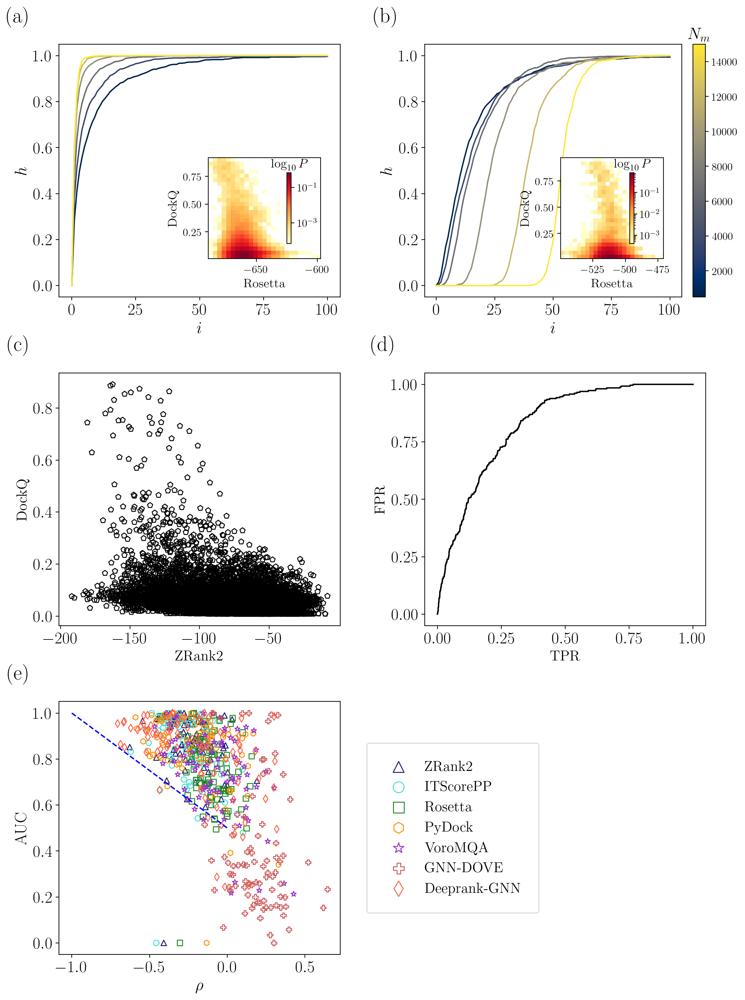

In [23]:
import matplotlib
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

font_size = 18

# Bigger figure
fig, ax = plt.subplots(3, 2, figsize=(11.5, 15), dpi=200)

# Top row (A, B)
ax_A = ax[0, 0]   # 3RCZ hit-rate (panel A)
ax_B = ax[0, 1]   # 3YGS hit-rate (panel B)

# ---- Insets: slightly inward from bottom-right ----

my_pad = 3.5
# inset_A = inset_axes(
#     ax_A,
#     width="35%", height="40%",
#     loc="lower right",
#     borderpad=my_pad      # larger -> moves more toward center
# )

inset_A = inset_axes(
    ax_A,
    width="40%", height="40%",
    bbox_to_anchor=(-0.05, 0.13, 1.0, 1.0),  
    bbox_transform=ax_A.transAxes,
    loc="lower right"
)

inset_B = inset_axes(
    ax_B,
    width="40%", height="40%",
    bbox_to_anchor=(-0.05, 0.13, 1.0, 1.0),  
    bbox_transform=ax_B.transAxes,
    loc="lower right"
)
# inset_B = inset_axes(
#     ax_B,
#     width="40%", height="40%",
#     loc="lower right",
#     borderpad=my_pad
# )

# Colors for line plots
cmap = matplotlib.cm.get_cmap("cividis")
color_vals = np.linspace(0, 1, len(sample_list))
colors = [cmap(color_vals[i]) for i in range(len(sample_list))]

top_ranks = 100
x_axis = range(0, top_ranks + 1)
score_1 = "Rosetta"

# ============================================================
# Panel A — Hit-rate curves (3RCZ)
# ============================================================
for i, sample in enumerate(sampled_hit_data_3rcz):
    ax_A.plot(x_axis, [0] + list(sample), color=colors[i], label=str(sample_list[i]))

ax_A.set_xlabel(r"$i$", fontsize=font_size)
ax_A.set_ylabel("$h$", fontsize=font_size)
ax_A.set_xticks([0, 25, 50, 75, 100])

ax_A.text(
    -0.1, 1.15, "(a)",
    transform=ax_A.transAxes,
    fontsize=int(font_size * 1.3),
    fontweight="bold",
    va="top", ha="right"
)

# ============================================================
# Panel B — Hit-rate curves (3YGS)
# ============================================================
for i, sample in enumerate(sampled_hit_data_3ygs):
    ax_B.plot(x_axis, [0] + list(sample), color=colors[i], label=str(sample_list[i]))

ax_B.set_xlabel(r"$i$", fontsize=font_size)
ax_B.set_ylabel("$h$", fontsize=font_size)
ax_B.set_xticks([0, 25, 50, 75, 100])

ax_B.text(
    -0.1, 1.15, "(b)",
    transform=ax_B.transAxes,
    fontsize=int(font_size * 1.3),
    fontweight="bold",
    va="top", ha="right"
)

# ============================================================
# Inset for 3RCZ (inside panel A)
# ============================================================
temp_3rcz_df = exhaustive_3rcz_df[exhaustive_3rcz_df[score_1] < -590]
hh_A = inset_A.hist2d(
    temp_3rcz_df[score_1],
    temp_3rcz_df["DockQ"],
    norm=mcolors.LogNorm(),
    density=True,
    bins=25,
    cmap="YlOrRd"
)

cbar_pad = 2.7

# Small colorbar inside inset A
cax_A = inset_axes(inset_A, width="4%", height="70%", loc="right", borderpad=cbar_pad)
cbar_A = plt.colorbar(hh_A[3], cax=cax_A)
cbar_A.ax.set_title(r"$\log_{10}P$", fontsize=font_size - 4)

inset_A.set_xlabel("Rosetta", fontsize=font_size - 4)
inset_A.set_ylabel("DockQ", fontsize=font_size - 4)
inset_A.tick_params(axis="both", labelsize=font_size - 6)

# ============================================================
# Inset for 3YGS (inside panel B)
# ============================================================
hh_B = inset_B.hist2d(
    exhaustive_3ygs_df[score_1],
    exhaustive_3ygs_df["DockQ"],
    norm=mcolors.LogNorm(),
    density=True,
    bins=25,
    cmap="YlOrRd"
)

# Small colorbar inside inset B
cax_B = inset_axes(inset_B, width="4%", height="70%", loc="right", borderpad=cbar_pad)

cbar_B = plt.colorbar(hh_B[3], cax=cax_B)
cbar_B.ax.set_title(r"$\log_{10}P$", fontsize=font_size - 4)

inset_B.set_xlabel("Rosetta", fontsize=font_size - 4)
inset_B.set_ylabel("DockQ", fontsize=font_size - 4)
inset_B.tick_params(axis="both", labelsize=font_size - 6)

# ============================================================
# Shared colorbar for N_m (line colors in A and B)
# ============================================================
norm = matplotlib.colors.Normalize(vmin=500, vmax=15000)
sm = matplotlib.cm.ScalarMappable(norm=norm, cmap="cividis")
sm.set_array([])

# One vertical colorbar on the right side of panel B
cbar_main = fig.colorbar(
    sm,
    ax=ax_B,
    orientation="vertical",
    fraction=0.046,
    pad=0.04
)
cbar_main.ax.set_title(r"$N_m$", fontsize=font_size)

# Formatting / layout
ax_A.tick_params(axis="both", which="major", labelsize=font_size)
ax_B.tick_params(axis="both", which="major", labelsize=font_size)


#### Panel C ####

temp_target = "3rcz"
score_df = exhaustive_score_dict[temp_target]

temp_score = "ZRank"
ax[1,0].scatter(score_df[temp_score], score_df["DockQ"], marker = "p", color = "black", facecolor = "None")


ax[1,0].set_xlabel("ZRank2", fontsize = fontsize)
ax[1,0].set_ylabel("DockQ", fontsize = fontsize)

ax[1,0].set_xticks([-200, -150, -100, -50])

#### Panel D ####

roc_curve, roc_auc = get_indiv_ROC_curve(score_df, col_name = "ZRank", dockq_cutoff = 0.23, factor = -1)

ax[1,1].plot(roc_curve[0], roc_curve[1], color = "black")

ax[1,1].set_xlabel("TPR", fontsize = fontsize)
ax[1,1].set_ylabel("FPR", fontsize = fontsize)

ax[1,1].set_xticks([0,0.25, 0.5, 0.75, 1.0])
ax[1,1].set_yticks([0,0.25, 0.5, 0.75, 1.0])

fig.tight_layout()

#### Panel E ####

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

ax[2,0].scatter(exhaustive_corr_df["spearman_dockq_zrank"], exhaustive_corr_df["zrank_auc"], color = colors[0], marker = "^", facecolor = "None", label = "ZRank2")
ax[2,0].scatter(exhaustive_corr_df["spearman_dockq_itscorepp"], exhaustive_corr_df["itscorepp_auc"], color = colors[1], marker = "o", facecolor = "None", label = "ITScorePP")
ax[2,0].scatter(exhaustive_corr_df["spearman_dockq_rosetta"], exhaustive_corr_df["rosetta_auc"], color = colors[2], marker = "s", facecolor = "None", label = "Rosetta")
ax[2,0].scatter(exhaustive_corr_df["spearman_dockq_pydock"], exhaustive_corr_df["pydock_auc"], color = colors[3], marker = "h", facecolor = "None", label = "PyDock")
ax[2,0].scatter(np.array(exhaustive_corr_df["spearman_dockq_voromqa"])*-1, exhaustive_corr_df["voromqa_auc"], color = colors[4], marker = "*", facecolor = "None", label = "VoroMQA")
ax[2,0].scatter(exhaustive_corr_df["spearman_dockq_dove_5"], exhaustive_corr_df["dove_5_auc"], color = colors[5], marker = "P", facecolor = "None", label = "GNN-DOVE")
ax[2,0].scatter(np.array(exhaustive_corr_df["spearman_dockq_deeprank_gnn_esm"])*-1, exhaustive_corr_df["deeprank_gnn_esm_auc"], color = colors[6], marker = "d", facecolor = "None", label = "Deeprank-GNN")

## Y = -X

temp_x = np.linspace(-1, 0, 10)
temp_y = np.linspace(0.5, 1, 10)[::-1]
ax[2,0].plot(temp_x, temp_y, "b--", )

ax[2,0].set_xlabel(r"$\rho$", fontsize = font_size)
ax[2,0].set_ylabel("AUC", fontsize = font_size)

ax[2,0].set_xticks([-1, -0.5,0, 0.5])

## Putting the legend in the empty panel

ax_empty = ax[2,1]
ax_empty.axis("off")

handles, labels = ax[2,0].get_legend_handles_labels()

legend = ax[2,0].legend(
    handles, labels,
    loc="center",                     # center of the empty axes
    bbox_to_anchor=(0.1, 0.5),        # (x, y) in ax_empty's Axes coords
    bbox_transform=ax_empty.transAxes,
    borderpad=1.2,
    frameon=True,
    fontsize = fontsize,
    markerscale = 2
)

## Axes layout

ax[1,0].text(
    -0.1, 1.15, "(c)",
    transform=ax[1,0].transAxes,
    fontsize=int(font_size * 1.3),
    fontweight="bold",
    va="top", ha="right"
)

ax[1,1].text(
    -0.1, 1.15, "(d)",
    transform=ax[1,1].transAxes,
    fontsize=int(font_size * 1.3),
    fontweight="bold",
    va="top", ha="right"
)

ax[2,0].text(
    -0.1, 1.15, "(e)",
    transform=ax[2,0].transAxes,
    fontsize=int(font_size * 1.3),
    fontweight="bold",
    va="top", ha="right"
)

for i in range(3):
    for j in range(2):
        ax[i,j].tick_params(axis='both', which='major', labelsize=font_size)

# fig.tight_layout()

plt.subplots_adjust(hspace = 0.3, wspace = 0.3)

plt.savefig(join(figure_save_dir, "hitrate_inset_updated.png"))


In [24]:
ss_score_dict["3ygs"][ss_score_dict["3ygs"]["CAPRI"] == "Incorrect"]

,Decoy,Model,Fnat,iRMSD,LRMSD,CAPRI,DockQ,IS-Score,ZRank,HDOCK,...,itscorepp,ZRank Z-score,HDOCK Z-score,Rosetta Z-score,PyDock Z-score,VoroMQA Z-score,VoroMQA_js Z-score,Dove_5 Z-score,Deeprank_gnn_esm Z-score,itscorepp Z-score
17,complex.0_2_1,0,0.000,7.151,12.500,Incorrect,0.119,0.0553,-48.1261,-9730.41,...,-152.297,0.769783,-0.852095,1.007470,0.651941,-0.096973,-1.595992,-0.087268,-0.905501,0.352782
18,complex.0_2_25,0,0.000,6.216,11.951,Incorrect,0.130,0.0553,-40.1116,-9626.51,...,-88.745,1.263691,0.754644,-0.395104,0.917447,-2.796611,-1.880437,-0.515515,-0.698494,1.740128
19,complex.0_2_28,0,0.259,8.940,19.174,Incorrect,0.150,0.1179,-86.3766,-9843.85,...,-258.871,-1.587474,-2.606362,-0.261214,-0.893535,0.967360,2.708218,1.698832,0.054259,-1.973739
20,complex.0_2_32,0,0.000,7.801,12.599,Incorrect,0.116,0.0553,-55.6072,-9697.20,...,-194.195,0.308746,-0.338526,0.266372,2.344026,0.621885,0.610434,0.044339,-0.896092,-0.561856
21,complex.0_2_36,0,0.000,6.551,12.924,Incorrect,0.117,0.0553,-51.9190,-9626.27,...,-130.984,0.536038,0.758355,-0.414903,0.452052,-0.910946,0.260804,-0.400619,-0.801998,0.818047
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
693,complex.19542_0,19542,0.000,10.616,47.020,Incorrect,0.017,0.0553,-45.6147,-9627.53,...,-119.376,0.924552,0.738870,0.749802,1.663902,1.915079,-0.039444,-1.693715,-0.801998,1.071450
694,complex.19547_3,19547,0.000,11.923,52.616,Incorrect,0.014,0.0553,-49.8211,-9637.43,...,-115.754,0.665325,0.585774,-0.243979,-0.473375,1.017770,0.695373,-0.864379,-0.830226,1.150519
695,complex.19616_8,19616,0.000,12.250,52.564,Incorrect,0.013,0.0553,-40.6478,-9686.13,...,-157.223,1.230647,-0.167337,0.381603,0.746164,0.120814,0.106729,-0.450756,-0.914911,0.245247
696,complex.19681_1,19681,0.148,10.683,19.346,Incorrect,0.110,0.1159,-63.3231,-9589.65,...,-123.601,-0.166760,1.324657,-0.261071,0.637816,-1.695153,-1.712535,-0.436133,-0.914911,0.979218


/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_31230/358203947.py:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap("cividis")
/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_31230/358203947.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


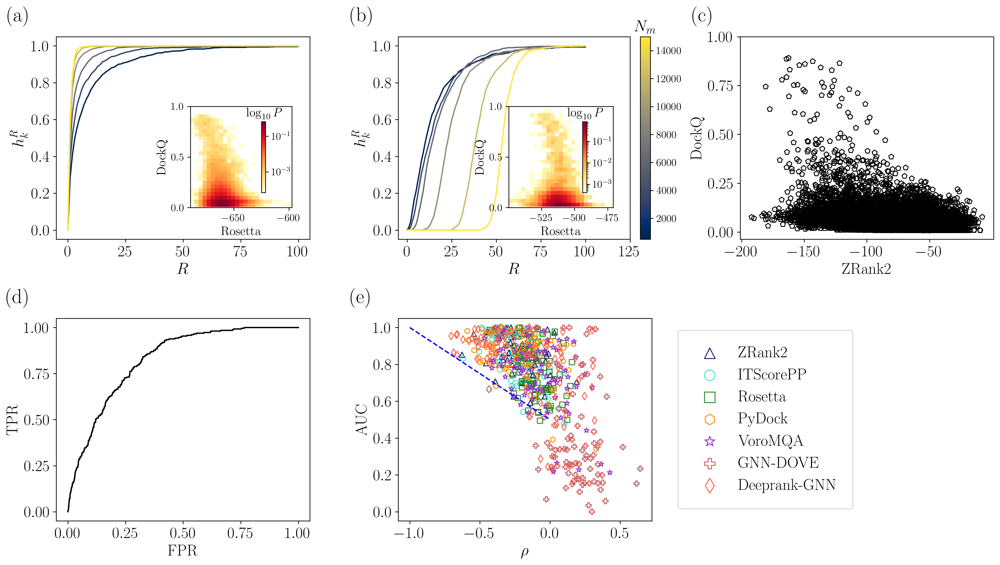

In [52]:
import matplotlib
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

font_size = 18

# 2 rows x 3 cols
fig, ax = plt.subplots(2, 3, figsize=(16, 9), dpi=300)

# ---------- Top row: A, B, C ----------
ax_A = ax[0, 0]   # (a) 3RCZ hit-rate
ax_B = ax[0, 1]   # (b) 3YGS hit-rate
ax_C = ax[0, 2]   # (c) ZRank vs DockQ

# ---- Insets on A and B ----
inset_A = inset_axes(
    ax_A,
    width="40%", height="50%",
    bbox_to_anchor=(-0.05, 0.13, 1.0, 1.0),
    bbox_transform=ax_A.transAxes,
    loc="lower right"
)
inset_B = inset_axes(
    ax_B,
    width="45%", height="50%",
    bbox_to_anchor=(-0.05, 0.13, 1.0, 1.0),
    bbox_transform=ax_B.transAxes,
    loc="lower right"
)

# Colors for line plots
cmap = matplotlib.cm.get_cmap("cividis")
color_vals = np.linspace(0, 1, len(sample_list))
colors = [cmap(color_vals[i]) for i in range(len(sample_list))]

top_ranks = 100
x_axis = range(0, top_ranks + 1)
score_1 = "Rosetta"

# ============================================================
# Panel A — Hit-rate curves (3RCZ)
# ============================================================
for i, sample in enumerate(sampled_hit_data_3rcz):
    ax_A.plot(x_axis, [0] + list(sample), color=colors[i], label=str(sample_list[i]))

ax_A.set_xlabel(r"$R$", fontsize=font_size)
ax_A.set_ylabel("$h_k^R$", fontsize=font_size)
ax_A.set_xticks([0, 25, 50, 75, 100])

ax_A.text(-0.1, 1.15, "(a)", transform=ax_A.transAxes,
          fontsize=int(font_size * 1.3), fontweight="bold",
          va="top", ha="right")

# ============================================================
# Panel B — Hit-rate curves (3YGS)
# ============================================================
for i, sample in enumerate(sampled_hit_data_3ygs):
    ax_B.plot(x_axis, [0] + list(sample), color=colors[i], label=str(sample_list[i]))

ax_B.set_xlabel(r"$R$", fontsize=font_size)
ax_B.set_ylabel("$h_k^R$", fontsize=font_size)
ax_B.set_xticks([0, 25, 50, 75, 100, 125])

ax_B.text(-0.1, 1.15, "(b)", transform=ax_B.transAxes,
          fontsize=int(font_size * 1.3), fontweight="bold",
          va="top", ha="right")

# ============================================================
# Inset for 3RCZ (inside panel A)
# ============================================================
temp_3rcz_df = exhaustive_3rcz_df[exhaustive_3rcz_df[score_1] < -590]
hh_A = inset_A.hist2d(
    temp_3rcz_df[score_1],
    temp_3rcz_df["DockQ"],
    norm=mcolors.LogNorm(),
    density=True,
    bins=25,
    cmap="YlOrRd"
)

cbar_pad = 2.5

cax_A = inset_axes(inset_A, width="4%", height="70%", loc="right", borderpad=cbar_pad)
cbar_A = plt.colorbar(hh_A[3], cax=cax_A)
cbar_A.ax.set_title(r"$\log_{10}P$", fontsize=font_size - 4)

inset_A.set_xlabel("Rosetta", fontsize=font_size - 4)
inset_A.set_ylabel("DockQ", fontsize=font_size - 4)
inset_A.tick_params(axis="both", labelsize=font_size - 6)

# ============================================================
# Inset for 3YGS (inside panel B)
# ============================================================
hh_B = inset_B.hist2d(
    exhaustive_3ygs_df[score_1],
    exhaustive_3ygs_df["DockQ"],
    norm=mcolors.LogNorm(),
    density=True,
    bins=25,
    cmap="YlOrRd"
)

cax_B = inset_axes(inset_B, width="4%", height="70%", loc="right", borderpad=cbar_pad)
cbar_B = plt.colorbar(hh_B[3], cax=cax_B)
cbar_B.ax.set_title(r"$\log_{10}P$", fontsize=font_size - 4)

inset_B.set_xlabel("Rosetta", fontsize=font_size - 4)
inset_B.set_ylabel("DockQ", fontsize=font_size - 4)
inset_B.tick_params(axis="both", labelsize=font_size - 6)


inset_A.set_ylim([0,1])
inset_B.set_ylim([0,1])

inset_A.set_yticks([0.0, 0.5, 1.0])
inset_B.set_yticks([0.0, 0.5, 1.0])

# ============================================================
# Shared colorbar for N_m (line colors in A and B)
# ============================================================
norm = matplotlib.colors.Normalize(vmin=500, vmax=15000)
sm = matplotlib.cm.ScalarMappable(norm=norm, cmap="cividis")
sm.set_array([])

cbar_main = fig.colorbar(
    sm,
    ax=ax_B,
    orientation="vertical",
    fraction=0.046,
    pad=0.04
)
cbar_main.ax.set_title(r"$N_m$", fontsize=font_size)

ax_A.tick_params(axis="both", which="major", labelsize=font_size)
ax_B.tick_params(axis="both", which="major", labelsize=font_size)

# ============================================================
# Panel C — ZRank vs DockQ (now top-right)
# ============================================================
temp_target = "3rcz"
score_df = exhaustive_score_dict[temp_target]
temp_score = "ZRank"

ax_C.scatter(score_df[temp_score], score_df["DockQ"],
             marker="p", color="black", facecolor="None")

ax_C.set_xlabel("ZRank2", fontsize=font_size)
ax_C.set_ylabel("DockQ", fontsize=font_size)
ax_C.set_xticks([-200, -150, -100, -50])

ax_C.text(-0.1, 1.15, "(c)", transform=ax_C.transAxes,
          fontsize=int(font_size * 1.3), fontweight="bold",
          va="top", ha="right")

ax_C.set_yticks([0, 0.25, 0.5, 0.75, 1.0])

# ---------- Bottom row: D, E, Legend ----------
ax_D = ax[1, 0]   # ROC (d)
ax_E = ax[1, 1]   # corr vs AUC (e)
ax_empty = ax[1, 2]  # legend

#### Panel D ####
roc_curve, roc_auc = get_indiv_ROC_curve(
    score_df, col_name="ZRank", dockq_cutoff=0.23, factor=-1
)
ax_D.plot(roc_curve[0], roc_curve[1], color="black")

ax_D.set_xlabel("FPR", fontsize=font_size)
ax_D.set_ylabel("TPR", fontsize=font_size)
ax_D.set_xticks([0, 0.25, 0.5, 0.75, 1.0])
ax_D.set_yticks([0, 0.25, 0.5, 0.75, 1.0])

ax_D.text(-0.1, 1.15, "(d)", transform=ax_D.transAxes,
          fontsize=int(font_size * 1.3), fontweight="bold",
          va="top", ha="right")

#### Panel E ####
colors = ["midnightblue", "turquoise", "forestgreen", "darkorange",
          "darkorchid", "indianred", "tomato"]

ax_E.scatter(exhaustive_corr_df["spearman_dockq_zrank"][exhaustive_corr_df["zrank_auc"] > 0],
             exhaustive_corr_df["zrank_auc"][exhaustive_corr_df["zrank_auc"] > 0],
             color=colors[0], marker="^", facecolor="None", label="ZRank2")
ax_E.scatter(exhaustive_corr_df["spearman_dockq_itscorepp"][exhaustive_corr_df["itscorepp_auc"] > 0],
             exhaustive_corr_df["itscorepp_auc"][exhaustive_corr_df["itscorepp_auc"] > 0],
             color=colors[1], marker="o", facecolor="None", label="ITScorePP")
ax_E.scatter(exhaustive_corr_df["spearman_dockq_rosetta"][exhaustive_corr_df["rosetta_auc"] > 0],
             exhaustive_corr_df["rosetta_auc"][exhaustive_corr_df["rosetta_auc"] > 0],
             color=colors[2], marker="s", facecolor="None", label="Rosetta")
ax_E.scatter(exhaustive_corr_df["spearman_dockq_pydock"][exhaustive_corr_df["pydock_auc"] > 0],
             exhaustive_corr_df["pydock_auc"][exhaustive_corr_df["pydock_auc"] > 0],
             color=colors[3], marker="h", facecolor="None", label="PyDock")
ax_E.scatter(np.array(exhaustive_corr_df["spearman_dockq_voromqa"])*-1,
             exhaustive_corr_df["voromqa_auc"],
             color=colors[4], marker="*", facecolor="None", label="VoroMQA")
ax_E.scatter(exhaustive_corr_df["spearman_dockq_dove_5"],
             exhaustive_corr_df["dove_5_auc"],
             color=colors[5], marker="P", facecolor="None", label="GNN-DOVE")
ax_E.scatter(np.array(exhaustive_corr_df["spearman_dockq_deeprank_gnn_esm"])*-1,
             exhaustive_corr_df["deeprank_gnn_esm_auc"],
             color=colors[6], marker="d", facecolor="None", label="Deeprank-GNN")

temp_x = np.linspace(-1, 0, 10)
temp_y = np.linspace(0.5, 1, 10)[::-1]
ax_E.plot(temp_x, temp_y, "b--")

ax_E.set_xlabel(r"$\rho$", fontsize=font_size)
ax_E.set_ylabel("AUC", fontsize=font_size)
ax_E.set_xticks([-1, -0.5, 0, 0.5])

ax_E.text(-0.1, 1.15, "(e)", transform=ax_E.transAxes,
          fontsize=int(font_size * 1.3), fontweight="bold",
          va="top", ha="right")

fig.tight_layout()

# ---------- Legend in last grid cell ----------
ax_empty.axis("off")
handles, labels = ax_E.get_legend_handles_labels()

legend = ax_E.legend(
    handles, labels,
    loc="center",
    bbox_to_anchor=(0.1, 0.5),
    bbox_transform=ax_empty.transAxes,
    borderpad=1.0,
    frameon=True,
    fontsize=font_size,
    markerscale=2
)

# Ticks
for i in range(2):
    for j in range(3):
        ax[i, j].tick_params(axis="both", which="major", labelsize=font_size)

# plt.subplots_adjust(hspace=0.3, wspace=0.3)

plt.savefig(join(figure_save_dir, "hitrate_inset_updated_2x3.png"))


In [26]:
print(roc_auc)

0.8253125493602905


In [27]:
print(spearmanr(score_df[temp_score], score_df["DockQ"])[0])

-0.303737492122032


# Figure 3

In [32]:
from scipy.stats import spearmanr

def create_random_mask(n):
    
    rng = np.random.Generator(np.random.PCG64())
    rng = np.random.default_rng()

    # generates 0 or 1 randomly
    value = rng.integers(low=0, high=2, size=n)

    choice_a = np.array([-1,1])
    mask = np.random.choice(choice_a, size = n)
    
    return value*mask

def create_distribution_with_given_fraction(score_df, var_frac):
    '''
    Randomly varies the points of the negatives while keeping the
    positives static. Terminates when the fraction of the 
    [n(neg) < min(pos)]/n(neg) goes below the
    "var_frac" parameter
    '''
    
    ## Split the score_df into positives and negatives
    
    pos_x_data = score_df[score_df["DockQ"] >= 0.23]["ZRank"]
    pos_y_data = score_df[score_df["DockQ"] >= 0.23]["DockQ"]
    neg_x_data = np.array(score_df[score_df["DockQ"] < 0.23]["ZRank"])
    neg_y_data = score_df[score_df["DockQ"] < 0.23]["DockQ"]
    
    len_negs = len(neg_x_data)
    
    
    ## Define the perturbation that can happen with each step
    eta = 0.005
    
    ## initialize the current correlation value
    frac_curr = 0
    
    safety_count = 1000000 ## Just to avoid an infinite loop
    i = 0
    pos_min = min(pos_x_data)
    while True:
        if i > safety_count:
            print("SAFETY COUNT REACHED")
            break
        ## Create random array for x
        
        if frac_curr >= var_frac:
            break
        
        rand_x = create_random_mask(len_negs) * eta
        
        ## Apply the random array to x, which determines whether the points move
        
        neg_x_data = neg_x_data + rand_x
        
        ## Calculate the variance fraction!
    
        frac_curr = len(neg_x_data[neg_x_data < pos_min])/len(neg_x_data)
        
        i+=1
        
    
    ## Recreate the DF for output purposes
    
    temp_dict = {"ZRank" : [], "DockQ" : []}
    
    temp_dict["ZRank"] += list(pos_x_data)
    temp_dict["ZRank"] += list(neg_x_data)
    temp_dict["DockQ"] += list(pos_y_data)
    temp_dict["DockQ"] += list(neg_y_data)
    
    
    print(frac_curr)
    return pd.DataFrame(temp_dict)
    

def get_cutoff_imbalanced_set(cutoff_x, df_list, imbalance_fraction = 0.5):

    unbalanced_list_95 = []

    sample_list = [500, 1000, 2000, 5000, 10000, 15000, 30000, 45000]

    score_fxn = 'ZRank' ## again, placeholder for the "score"

    hit_rate_list_95 = []

    for i in range(5):
        print(i)
        temp_unbal_list = create_unbalanced_dataset(df_list[i], imbalance_fraction, cutoff_x = cutoff_x)
        unbalanced_list_95.append(temp_unbal_list)
        hit_rate_list_95.append(sample_for_hit_rate_test_supp(temp_unbal_list, sample_list, score_col = score_fxn, dockq_cutoff = 0.23))
        
    return unbalanced_list_95, hit_rate_list_95

def create_unbalanced_dataset(example_df, imbalance_fraction, cutoff_x = -100000, cutoff_y = 0.23):
    
    '''
    Imbalance fraction is how much of the data you want below the cutoff
    '''
    
    ## Apply both cutoffs to the high data
    high_df = example_df[example_df["DockQ"] >= cutoff_y]
    high_df = high_df[high_df["ZRank"]>= cutoff_x]
    
    low_df = example_df[example_df["DockQ"] < cutoff_y]

    
    total_num = round(len(low_df)/imbalance_fraction)
    high_num = total_num - len(low_df)
    
    high_df_sample = high_df.sample(n = high_num, replace = False)

    combined_df = pd.concat([high_df_sample, low_df])
    
    return combined_df

def make_hit_rate_plot_sample_supp(sample_list, column = "ZRank", top_ranks = 50, dockq_cutoff = 0.23):
    '''
    Makes a hit rate plot from the score_dict. Hit rate is calculated based
    on the column name provided and the hit rate plot is calculated up to the
    top_ranks specified
    '''
    
    hit_rate_final = np.zeros((len(sample_list),top_ranks)) ## Create the hit rate plot y_axis
    hit_rate_x = range(1,top_ranks + 1)
    
    for i,temp_df in enumerate(sample_list):
        score_vals = np.array(temp_df[column]) ## gets the score column for each PDB
        dockq_vals = np.array(temp_df["DockQ"]) ## gets all of the CAPRI scores for the minimum
        
        ## Sorting the dataframes
        sort_vals = np.argsort(score_vals)
#         sort_vals = np.flip(sort_vals)
        score_vals = score_vals[sort_vals]
        dockq_vals = dockq_vals[sort_vals]
        
        hit_bool = False ## controls whether you found a positive
        for j in range(top_ranks):
            if dockq_vals[j] >= dockq_cutoff:
                ## Positive has been found in the top_ranks
                hit_bool = True
            if hit_bool:
                hit_rate_final[i,j] = 1
            else:
                hit_rate_final[i,j] = 0
                
    return np.mean(hit_rate_final, axis = 0), hit_rate_x


def sample_for_hit_rate_test_supp(score_df, sample_list, top_ranks = 100, score_col = "ZRank", dockq_cutoff = 0.23):
    '''
    Make a hit rate plot for each sample size in the sample
    list. Return a list of hit rate plot lists in the top_ranks. 
    '''
    
    ## init list to save hit rate data
    
    all_hit_rate_plots = []
    
    for n_samples in sample_list:
                
        temp_sample_list = []
        
        for i in range(1000):
            
            ## Get the random sample of the dataframe - no replacement
        
            temp_random_df = score_df.sample(n = n_samples, replace = False)
            
            temp_sample_list.append(temp_random_df)
            
        ## Get the hit rate and append to the list
        
        hit_rate_data, x_ax_vals = make_hit_rate_plot_sample_supp(temp_sample_list, column = score_col,
                                                             top_ranks = top_ranks, dockq_cutoff = dockq_cutoff)
        all_hit_rate_plots.append(hit_rate_data)
        
    return all_hit_rate_plots
    
    
## Function to do the hit rate plot that Alex and Corey want me to do

def hit_rate_all_targets_sampling(score_dict, sample_list, highest_rank = 100, score_col = "ZRank", dockq_cutoff = 0.23):
    '''
    Performs sampling of the score dict according to the sample list and then 
    finds the hit rate using the highest_rank and the score_col. The 
    DockQ cutoff can be changed as well to change what is defined as a 'hit' or not
    '''
    
    final_pdb_list = []
    final_hr_list = []
    
    ## got through all the PDBs and perform sampling on the exhaustive dataset
    for pdb_name, score_df in score_dict.items():
        
#         try:
#             test_hr = sample_for_hit_rate_test_supp(score_df, sample_list, top_ranks = highest_rank, 
#                                                     score_col = score_col, dockq_cutoff = dockq_cutoff)

#             final_pdb_list.append(pdb_name)

#             ## Save only the last element of the list for each sample test
#             test_arr = np.array(test_hr)
#             final_hr_list.append(test_arr.T[-1,:])
            
#         except:
#             print("FAILED ON PDB:", pdb_name)
                
    
        test_hr = sample_for_hit_rate_test_supp(score_df, sample_list, top_ranks = highest_rank, 
                                                    score_col = score_col, dockq_cutoff = dockq_cutoff)

        final_pdb_list.append(pdb_name)

        ## Save only the last element of the list for each sample test
        test_arr = np.array(test_hr)
        final_hr_list.append(test_arr.T[-1,:])
    ## Quickly make a dictionary of the data
    
    temp_dict = {"pdb": final_pdb_list, "final_hr": final_hr_list}
    
    return temp_dict

## Code to get the AUC with balancing extreme to work

def get_indiv_ROC_curve(score_df, col_name = "ZRank", dockq_cutoff = 0.23, factor = -1):
    '''
    Simply aggregates all the score and label data across all targets in a dataframe and 
    then turns them into ROC curve data
    '''
    
    temp_mask, temp_scores = create_ROC_data_struc_dockq(score_df, col_name = col_name, dockq_cutoff = dockq_cutoff)
    roc_curve = metrics.roc_curve(temp_mask, factor*np.array(temp_scores), pos_label=1)
    roc_auc = metrics.roc_auc_score(temp_mask, factor*np.array(temp_scores))
    
    return roc_curve, roc_auc

def create_unbalanced_dataset(example_df, imbalance_fraction, cutoff = 0.23):
    
    '''
    Imbalance fraction is how much of the data you want below the cutoff
    '''
    
    high_df = example_df[example_df["DockQ"] >= cutoff]
    low_df = example_df[example_df["DockQ"] < cutoff]

    
    total_num = round(len(low_df)/imbalance_fraction)
    high_num = total_num - len(low_df)
    
    print(len(high_df), high_num)
        
    high_df_sample = high_df.sample(n = high_num, replace = False)

    combined_df = pd.concat([high_df_sample, low_df])
    
    return combined_df

def create_unbalanced_dataset_negs(example_df, imbalance_fraction, cutoff = 0.23):
    
    '''
    Imbalance fraction is how much of the data you want above the cutoff
    '''
    
    high_df = example_df[example_df["DockQ"] >= cutoff]
    low_df = example_df[example_df["DockQ"] < cutoff]

    
    total_num = round(len(high_df)/(1-imbalance_fraction))
    low_num = total_num - len(high_df)
    
    print(len(low_df), low_num)
        
    low_df_sample = low_df.sample(n = low_num, replace = False)

    combined_df = pd.concat([high_df, low_df_sample])
    
    return combined_df

def conduct_unbalancing_test_targets(score_df, frac_list):
    '''
    Conduct the unbalancing test to test
    AUC to the extreme
    '''
    
    roc_curve_list = []
    roc_auc_list = []
    
    for fraction in frac_list:
        
        temp_df = create_unbalanced_dataset_negs(score_df, fraction)
        
        roc_curve, roc_auc = get_indiv_ROC_curve(temp_df, col_name = "ZRank")
        
        roc_curve_list.append(roc_curve)
        roc_auc_list.append(roc_auc)
        
        
    return roc_curve_list, roc_auc_list

def conduct_unbalancing_test(score_df, frac_list):
    '''
    Conduct the unbalancing test to test
    AUC to the extreme
    '''
    
    roc_curve_list = []
    roc_auc_list = []
    
    for fraction in frac_list:
        
        temp_df = create_unbalanced_dataset(score_df, fraction)
        
        roc_curve, roc_auc = get_indiv_ROC_curve(temp_df, col_name = "ZRank")
        
        roc_curve_list.append(roc_curve)
        roc_auc_list.append(roc_auc)
        
        
    return roc_curve_list, roc_auc_list
        
def create_ROC_data_struc_dockq(score_df, col_name = "ZRank", dockq_cutoff = 0.23):
    '''
    Takes the score_df (DataFrame) and a given 'col_name' which corresponds to one of the columns 
    in the dataframe and some quality metric, which is what treats the data as a true positive. 
    True positives are labeled with a 1 and false positives are labeled with a 0.
    '''
    
    temp_scores = score_df[col_name]
    temp_dockq = score_df["DockQ"]
    
    ## Get the label array for the capri scores
    score_mask = np.zeros(temp_dockq.size)
    temp_dockq = list(temp_dockq)
    for i in range(len(score_mask)):
#         print(temp_dockq[i])
        if temp_dockq[i] >= dockq_cutoff:
            score_mask[i] = 1
    
    return score_mask, temp_scores


In [33]:
## Creates the probability distribution without plotting it

def create_prob_dist_identical_bins_dockq(data, fig, ax, bins = [], n_bins = 100, color = "black", label = None, alpha = 1.0, marker = "o"):
    '''
    plots a probability distribution from the data provided
    '''
    
    n, bins, patches = ax.hist(data, bins=bins, density=True, histtype= "step", alpha = 0)
    bins = np.delete(bins, -1)
    bins += abs(bins[1]-bins[0])/2
    
    
#     ax.plot(bins, n, marker=marker, color=color, markerfacecolor='none', label = label, alpha = alpha)
    
    x = np.array(bins)
    y = np.array(n)
    
    return x, y

In [34]:
def create_new_average_rho_data_structures(ss_corr_df):
    '''
    Averages rho for all the scoring functions,
    specifically leaving out PDBs for Deeprank-GNN-ESM and GNN-DOVE.

    The average containing Dove will be kept separate
    '''

    score_list = ["spearman_dockq_zrank", "spearman_dockq_itscorepp", "spearman_dockq_rosetta", "spearman_dockq_pydock",
                 "spearman_dockq_voromqa", "spearman_dockq_deeprank_gnn_esm", "spearman_dockq_dove_5"]

    final_dict = {
        "pdb" : [],
        "avg_rho": [],
        "std_rho" : [],
        "avg_rho_dove" : [],
        "std_rho_dove" : []
    }

    zrank_rhos = []
    itscorepp_rhos = []
    rosetta_rhos = []
    pydock_rhos = []
    voromqa_rhos = []
    deeprank_rhos = []
    dove_rhos = []

    comb_score_list = [zrank_rhos, itscorepp_rhos, rosetta_rhos, pydock_rhos, voromqa_rhos, deeprank_rhos, dove_rhos]

    comb_auc_list = [[],[],[],[],[],[],[]]

    comb_name_list = [[],[],[],[],[],[],[]]

    for pdb_name in sorted(list(ss_corr_df["pdb"])):

        temp_score_list = []
        temp_score_list_dove = []

        for i,score in enumerate(score_list):

            score_val = ss_corr_df[ss_corr_df["pdb"] == pdb_name].iloc[0][score]

            auc_name = "_".join(score.split("_")[2:]) + "_auc"
            auc_val = ss_corr_df[ss_corr_df["pdb"] == pdb_name].iloc[0][auc_name]

            if "deeprank" in score or "dove" in score or "voromqa" in score:
                score_val = score_val * -1

            if "deeprank" in score:

                if pdb_name not in ['2oul', '1ay7']:

                    comb_score_list[i].append(score_val)
                    temp_score_list.append(score_val)
                    temp_score_list_dove.append(score_val)
                    comb_name_list[i].append(pdb_name)
                    comb_auc_list[i].append(auc_val)

            elif "dove" in score:

                if pdb_name not in ['2bkr', '1ugh']:

                    comb_score_list[i].append(score_val)
                    temp_score_list_dove.append(score_val)
                    comb_name_list[i].append(pdb_name)
                    comb_auc_list[i].append(auc_val)

            else:

                comb_score_list[i].append(score_val)
                temp_score_list.append(score_val)
                temp_score_list_dove.append(score_val)
                comb_name_list[i].append(pdb_name)
                comb_auc_list[i].append(auc_val)

        ## Update the dictionary
        final_dict["pdb"].append(pdb_name)
        final_dict["avg_rho"].append(np.mean(temp_score_list))
        final_dict["std_rho"].append(np.std(temp_score_list))
        final_dict["avg_rho_dove"].append(np.mean(temp_score_list_dove))
        final_dict["std_rho_dove"].append(np.std(temp_score_list_dove))

        

    return pd.DataFrame(final_dict), comb_score_list, comb_name_list, comb_auc_list

        
        

In [35]:
## For the uniformly sampled data

avg_df_ss, comb_score_list_84_ss, comb_name_list_84_ss, comb_auc_list_84_ss = create_new_average_rho_data_structures(ss_corr_df)

In [36]:
## For the exhaustively sampled data

avg_df_ex, comb_score_list_84_ex, comb_name_list_84_ex, comb_auc_list_84_ex = create_new_average_rho_data_structures(exhaustive_corr_df)

/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_31230/537159470.py:144: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  lgnd.legendHandles[k]._sizes = [100]


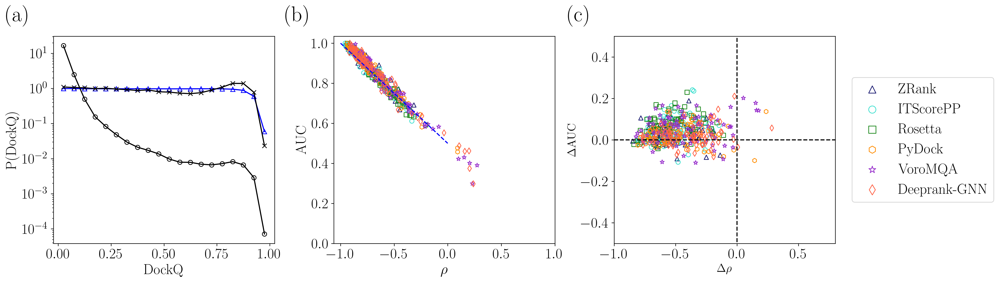

In [38]:
## Tenative Figure 1 - A
%matplotlib inline

font_size = 20

fig, ax = plt.subplots(1,3, figsize = (12,4), dpi = 300)

#### Panel A ####

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

x_axis = np.linspace(0.025, 0.975, 20)

before_dockq_mean = np.array(before_dockq_mean)
before_dockq_mean_mod = before_dockq_mean/50

after_dockq_mean = np.array(after_dockq_mean)
after_dockq_mean_mod = after_dockq_mean/50

ax[0].plot(x_axis, before_dockq_mean_mod, label = "Supersampled before minimization", color = "blue", marker = "^", markerfacecolor = "None")
ax[0].plot(x_axis, after_dockq_mean_mod, label = "Supersampled after minimization", color = "black", marker = "x")

## Averaged DockQ for Exhaustive Data

nbins = 21
bins = np.linspace(0, 1, nbins)

dockq_arr = np.zeros((len(exhaustive_score_dict), nbins-1))

for i,pdb_name in enumerate(list(exhaustive_score_dict.keys())):

    temp_x, temp_y = create_prob_dist_identical_bins_dockq(exhaustive_score_dict[pdb_name]["DockQ"], fig, ax[2], bins = bins, color = "black", label = None, alpha = 1.0, marker = "o")
    dockq_arr[i,:] = temp_y
    
# ax[2].plot(temp_x, temp_y, color = "slateblue", marker = "o", markerfacecolor = "None", linewidth = 0.8, alpha = 0.1, label = "Individual Targets")
    
avg_dockq = np.mean(dockq_arr, axis = 0)

ax[0].plot(temp_x, avg_dockq, color = "black", marker = "o", markerfacecolor = "None", label = "Averaged")

ax[0].set_yscale("log")

ax[0].set_xlabel("DockQ", fontsize = font_size)
ax[0].set_ylabel("P(DockQ)", fontsize = font_size)

## Change x_ticks

ax[0].set_xticks([0, 0.25, 0.5, 0.75, 1.0])

#### Panel B ####

ax[1].scatter(comb_score_list_84_ss[0], comb_auc_list_84_ss[0], color = colors[0], marker = "^", facecolor = "None", label = "ZRank2")
ax[1].scatter(comb_score_list_84_ss[1], comb_auc_list_84_ss[1], color = colors[1], marker = "o", facecolor = "None", label = "ITScorePP")
ax[1].scatter(comb_score_list_84_ss[2], comb_auc_list_84_ss[2], color = colors[2], marker = "s", facecolor = "None", label = "Rosetta")
ax[1].scatter(comb_score_list_84_ss[3], comb_auc_list_84_ss[3], color = colors[3], marker = "h", facecolor = "None", label = "PyDock")
ax[1].scatter(comb_score_list_84_ss[4], comb_auc_list_84_ss[4], color = colors[4], marker = "*", facecolor = "None", label = "VoroMQA")
ax[1].scatter(comb_score_list_84_ss[5], comb_auc_list_84_ss[5], color = colors[6], marker = "d", facecolor = "None", label = "Deeprank-GNN")


## Y = -X

temp_x = np.linspace(-1, 0, 10)
temp_y = np.linspace(0.5, 1, 10)[::-1]
ax[1].plot(temp_x, temp_y, "b--", )

ax[1].set_xlabel(r"$\rho$", fontsize = font_size)
ax[1].set_ylabel("AUC", fontsize = font_size)


y_ticks_temp = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
x_ticks_temp = [-1.0, -0.5,  0.0,  0.5, 1.0]
ax[1].set_xticks(x_ticks_temp)
ax[1].set_yticks(y_ticks_temp)

#### Panel C ####

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "tomato"]

zrank_spearman_delta = np.abs(np.array(comb_score_list_84_ss[0]))*-1 - np.abs(np.array(comb_score_list_84_ex[0]))*-1
zrank_auc_delta = np.array(comb_auc_list_84_ss[0]) - np.array(comb_auc_list_84_ex[0])

hdock_spearman_delta = np.abs(np.array(comb_score_list_84_ss[1]))*-1 - np.abs(np.array(comb_score_list_84_ex[1]))*-1
hdock_auc_delta = np.array(comb_auc_list_84_ss[1]) - np.array(comb_auc_list_84_ex[1])

rosetta_spearman_delta = np.abs(np.array(comb_score_list_84_ss[2]))*-1 - np.abs(np.array(comb_score_list_84_ex[2]))*-1
rosetta_auc_delta = np.array(comb_auc_list_84_ss[2]) - np.array(comb_auc_list_84_ex[2])

pydock_spearman_delta = np.abs(np.array(comb_score_list_84_ss[3]))*-1 - np.abs(np.array(comb_score_list_84_ex[3]))*-1
pydock_auc_delta = np.array(comb_auc_list_84_ss[3]) - np.array(comb_auc_list_84_ex[3])

voromqa_spearman_delta = np.abs(np.array(comb_score_list_84_ss[4]))*-1 - np.abs(np.array(comb_score_list_84_ex[4]))*-1
voromqa_auc_delta = np.array(comb_auc_list_84_ss[4]) - np.array(comb_auc_list_84_ex[4])

deeprank_spearman_delta = np.abs(np.array(comb_score_list_84_ss[5]))*-1 - np.abs(np.array(comb_score_list_84_ex[5]))*-1
deeprank_auc_delta = np.array(comb_auc_list_84_ss[5]) - np.array(comb_auc_list_84_ex[5])

## Fix the few points that mess up

ax2_1 = ax[2].scatter(zrank_spearman_delta[zrank_auc_delta <= 0.9],
           zrank_auc_delta[zrank_auc_delta <= 0.9],
           color = colors[0], marker = "^", label = "ZRank", facecolor = "None")
ax2_2 = ax[2].scatter(hdock_spearman_delta[hdock_auc_delta <= 0.9],
           hdock_auc_delta[hdock_auc_delta <= 0.9],
           color = colors[1], marker = "o", label = "ITScorePP", facecolor = "None")
ax2_3 = ax[2].scatter(rosetta_spearman_delta[rosetta_auc_delta <= 0.9],
           rosetta_auc_delta[rosetta_auc_delta <= 0.9],
           color = colors[2], marker = "s", label = "Rosetta", facecolor = "None")
ax2_4 = ax[2].scatter(pydock_spearman_delta[pydock_auc_delta <= 0.9],
           pydock_auc_delta[pydock_auc_delta <= 0.9],
           color = colors[3], marker = "h", label = "PyDock", facecolor = "None")
ax2_5 = ax[2].scatter(voromqa_spearman_delta,
           voromqa_auc_delta,
           color = colors[4], marker = "*", label = "VoroMQA", facecolor = "None")
ax2_6 = ax[2].scatter(deeprank_spearman_delta,
           deeprank_auc_delta,
           color = colors[5], marker = "d", label = "Deeprank-GNN", facecolor = "None")

ax[2].set_ylabel("$\Delta$AUC", fontsize = 16)
ax[2].set_xlabel(r"$\Delta\rho$", fontsize = 16)

## Create vertical and horizontal dotted lines

x_vert = [0,0]
y_vert = [-0.8, 1.0]
ax[2].plot(x_vert, y_vert, color = "black", linestyle = "--")

x_horiz = [-1, 0.8]
y_horiz = [0,0]
ax[2].plot(x_horiz, y_horiz, color = "black", linestyle = "--")

ax[2].set_xlim([-1, 0.8])
ax[2].set_ylim([-0.5, 0.5])

fig.tight_layout()


###### LEGEND #######
lgnd = ax[2].legend(handles = [ax2_1, ax2_2, ax2_3, ax2_4, ax2_5, ax2_6],
        loc='center right', bbox_to_anchor=(1.75, 0.5), ncol=1, fontsize = font_size)
# lgnd = ax[1].legend(loc='upper right',
#           ncol=2, fontsize = font_size-8)

for k in range(6):
    lgnd.legendHandles[k]._sizes = [100]
    
### FORMATTING

letters = ['a', 'b', 'c']
for i in range(3):
    ax[i].tick_params(axis='both', which='major', labelsize=font_size)
    ax[i].text(-0.1, 1.15, f"({letters[i]})", transform=ax[i].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')

ax[0].set_position([-0.45,-0.5,0.355,1])
ax[1].set_position([0,-0.5,0.355,1])
ax[2].set_position([0.45,-0.5,0.355,1])

# plt.tight_layout()
plt.savefig(join(figure_save_dir, "supersampling_improvement_update_exhaustive.png"))

In [39]:
## Updated fancy figure with everything now. 

['3whq', '1ugq', '1n1j', '4uzz', '1kfu', '4g6t', '5k7m', '1c3a', '5by8', '1r8o', '4ct6', '4qjf', '1vet', '3vz9', '5maw', '3dgp', '1pdk', '1f60', '2wmp', '4je3', '1ugh', '2bkr', '8enf', '2fhz', '1spp', '5dmb', '5mu7', '3wdg', '2oul', '4h5s', '2hla', '1ry7', '5uq2', '3gfk', '6zbk', '4gi3', '7joe', '3qc8', '4yii', '4dbg', '7bxh', '1acb', '4u1c', '1euv', '1ggp', '3rcz', '4bi8', '1tfo', '6yxj', '1qav', '1ay7', '1wqj', '2pe6', '2g2u', '4k12', '5zrz', '1j7d', '1wrd', '7jxv', '6xod', '4dhi', '6kp3', '1xg2', '4qlp', '3sgb', '4hwi', '2hth', '1itb', '6wg4', '3k9p', '3fpn', '2dvw', '3qhy', '3u82', '6fud', '3hw2', '1wmh', '2hsm', '3ona', '3ygs', '2h7z', '2grn', '2d5r', '1mbv']
['3whq', '1ugq', '1n1j', '4uzz', '1kfu', '4g6t', '5k7m', '1c3a', '5by8', '1r8o', '4ct6', '4qjf', '1vet', '3vz9', '5maw', '3dgp', '1pdk', '1f60', '2wmp', '4je3', '1ugh', '2bkr', '8enf', '2fhz', '1spp', '5dmb', '5mu7', '3wdg', '4h5s', '2hla', '1ry7', '5uq2', '3gfk', '6zbk', '4gi3', '7joe', '3qc8', '4yii', '4dbg', '7bxh', '1acb'

/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_5661/3956476069.py:109: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  lgnd.legendHandles[0]._sizes = [400]
/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_5661/3956476069.py:110: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  lgnd.legendHandles[1]._sizes = [400]
/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_5661/3956476069.py:111: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  lgnd.legendHandles[2]._sizes = [400]
/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_5661/3956476069.py:112: MatplotlibDeprecationWarning: The legendHandles attribut

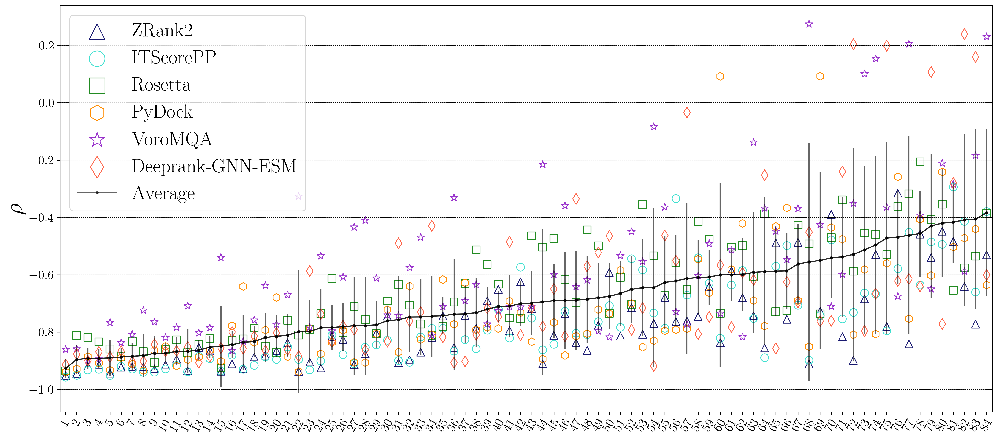

In [40]:
## Only scores that do well now

fig, ax = plt.subplots(figsize = (18,8), dpi = 300)

num_samples = len(ss_corr_df)
colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

mean_data = avg_df_ss["avg_rho"]

stdev_data = avg_df_ss["std_rho"]

## spearman data will be the first 5 scoring functions

spearman_data = [
    comb_score_list_84_ss[0],
    comb_score_list_84_ss[1],
    comb_score_list_84_ss[2],
    comb_score_list_84_ss[3],
    comb_score_list_84_ss[4]
]

spearman_data = np.array(spearman_data)

sorted_data = spearman_data[:, mean_data.argsort()]

sorted_mean_data = mean_data[mean_data.argsort()]

sorted_stdev_data = stdev_data[mean_data.argsort()]


pdb_order = list(np.array(ss_corr_df["pdb"])[mean_data.argsort()])
print(pdb_order)
label_ticks = list(range(1, len(ss_corr_df)+1))
x = np.linspace(0.5, num_samples-0.5, num_samples)
plt.xticks(x, label_ticks)
plt.xticks(rotation = 60, fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlim(0, num_samples)

## Create a special X value for Deeprank-GNN-ESM because it has only 82 (we removed 2 that were in the training set)
## location of Deeprank-GNN-ESM is index 5

## Sort the deeprank names and scores as well

deeprank_names = comb_name_list_84_ss[5]
deeprank_scores = comb_score_list_84_ss[5]

deeprank_names_sort = []
deeprank_scores_sort = []
deeprank_x = []
spec_ind = 0

add_val = 1
for i in range(len(pdb_order)):

    sort_name = pdb_order[i]

    if sort_name in ["2oul", "1ay7"]:
            
        add_val += 1
        continue

    for j in range(len(deeprank_names)):

        d_name = deeprank_names[j]
        d_score = deeprank_scores[j]

        if d_name in sort_name:

            if len(deeprank_x) == 0: ## start
                deeprank_x.append(0.5)
                spec_ind += 1

                deeprank_names_sort.append(d_name)
                deeprank_scores_sort.append(d_score)
                
            else:
                deeprank_x.append(deeprank_x[spec_ind - 1] + add_val)
                deeprank_names_sort.append(d_name)
                deeprank_scores_sort.append(d_score)
                spec_ind += 1
                add_val = 1

            
    

print(deeprank_names_sort)
print(deeprank_x)

## Plot the data with scatter plots

marker_size = 100

ax.scatter(x, sorted_data[0], color = colors[0], marker = "^", label = "ZRank2", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[1], color = colors[1], marker = "o", label = "ITScorePP", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[2], color = colors[2], marker = "s", label = "Rosetta", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[3], color = colors[3], marker = "h", label = "PyDock", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[4], color = colors[4], marker = "*", label = "VoroMQA", facecolor = "None", s = marker_size)
ax.scatter(deeprank_x, deeprank_scores_sort, color = colors[6], marker = "d", label = "Deeprank-GNN-ESM", facecolor = "None", s = marker_size)

plt.errorbar(x, sorted_mean_data, yerr = sorted_stdev_data, color = "black", marker = ".", alpha = 0.6)

ax.plot(x, sorted_mean_data, color = "black", marker = ".", label = "Average", alpha = 0.6)

ax.set_ylabel(r"$\rho$", fontsize = 30)

fig.tight_layout()
lgnd = plt.legend(fontsize = 25)
lgnd.legendHandles[0]._sizes = [400]
lgnd.legendHandles[1]._sizes = [400]
lgnd.legendHandles[2]._sizes = [400]
lgnd.legendHandles[3]._sizes = [400]
lgnd.legendHandles[4]._sizes = [400]
lgnd.legendHandles[5]._sizes = [400]
plt.grid(axis = "y", color = 'black', linestyle = '--', linewidth = 0.5)
plt.savefig(join(figure_save_dir, "per_target_spearman_no_dove.png"))

## Include the BM5.5 data

In [41]:
def create_new_average_rho_data_structures_with_bm55(ss_corr_df):
    '''
    Averages rho for all the scoring functions,
    specifically for the bm5.5 data - simplified

    The average containing Dove will be kept separate
    '''

    score_list = ["spearman_dockq_zrank", "spearman_dockq_itscorepp", "spearman_dockq_rosetta", "spearman_dockq_pydock",
                 "spearman_dockq_voromqa"]

    final_dict = {
        "pdb" : [],
        "avg_rho": [],
        "std_rho" : []
    }

    zrank_rhos = []
    itscorepp_rhos = []
    rosetta_rhos = []
    pydock_rhos = []
    voromqa_rhos = []

    comb_score_list = [zrank_rhos, itscorepp_rhos, rosetta_rhos, pydock_rhos, voromqa_rhos]

    comb_auc_list = [[],[],[],[],[]]

    comb_name_list = [[],[],[],[],[]]

    for pdb_name in sorted(list(ss_corr_df["pdb"])):

        temp_score_list = []

        for i,score in enumerate(score_list):

            score_val = ss_corr_df[ss_corr_df["pdb"] == pdb_name].iloc[0][score]

            auc_name = "_".join(score.split("_")[2:]) + "_auc"
            auc_val = ss_corr_df[ss_corr_df["pdb"] == pdb_name].iloc[0][auc_name]

            if "voromqa" in score:
                score_val = score_val * -1

            comb_score_list[i].append(score_val)
            temp_score_list.append(score_val)
            comb_name_list[i].append(pdb_name)
            comb_auc_list[i].append(auc_val)

        ## Update the dictionary
        final_dict["pdb"].append(pdb_name)
        final_dict["avg_rho"].append(np.mean(temp_score_list))
        final_dict["std_rho"].append(np.std(temp_score_list))

        

    return pd.DataFrame(final_dict), comb_score_list, comb_name_list, comb_auc_list

        
        

In [42]:
avg_df_bm55, comb_score_list_bm55, comb_name_list_bm55, comb_auc_list_bm55 = create_new_average_rho_data_structures_with_bm55(bm55_corr_df)

In [43]:
## Add the data together



In [44]:
print(mean_data)

0    -0.700874
1    -0.664888
2    -0.881499
3    -0.694269
4    -0.832812
        ...   
79   -0.742774
80   -0.709187
81   -0.736579
82   -0.608052
83   -0.797525
Name: avg_rho, Length: 84, dtype: float64


['3whq', '1ugq', '1n1j', '4uzz', '1kfu', '4g6t', '5k7m', '1c3a', '5by8', '1r8o', '4ct6', '4qjf', '1vet', '3vz9', '5maw', '3dgp', '1pdk', '1f60', '2ot3', '2wmp', '2oza', '1r8s', '4je3', '1kxp', '1ugh', '1cgi', '1bkd', '2bkr', '8enf', '1nw9', '2fhz', '1spp', '1ira', '5dmb', '1udi', '5mu7', '3wdg', '2oul', '2sni', '1tmq', '4h5s', '2hla', '1ry7', '5uq2', '3gfk', '6zbk', '1zli', '1zhh', '4gi3', '7joe', '2hle', '3qc8', '1dfj', '1m10', '1r0r', '1bvn', '2nz8', '4yii', '2sic', '2z0e', '1j2j', '4dbg', '7bxh', '1atn', '1acb', '4u1c', '1euv', '1ggp', '3rcz', '4bi8', '1f34', '1tfo', '6yxj', '2g77', '1qav', '1avx', '1z5y', '1fle', '1ay7', '2a9k', '2o8v', '1wqj', '2o3b', '2pe6', '2g2u', '2b42', '1ppe', '7cei', '2ayo', '4k12', '1clv', '2vdb', '5zrz', '1j7d', '1wrd', '7jxv', '6xod', '4dhi', '6kp3', '2c0l', '2btf', '1xg2', '4qlp', '3sgb', '4hwi', '2hth', '1mah', '2a5t', '1itb', '6wg4', '1buh', '3k9p', '3fpn', '2dvw', '1oc0', '3qhy', '2fju', '3u82', '1fq1', '2hrk', '6fud', '3hw2', '1he8', '1wmh', '2hsm',

/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_5661/1223089910.py:59: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  lgnd.legendHandles[0]._sizes = [400]
/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_5661/1223089910.py:60: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  lgnd.legendHandles[1]._sizes = [400]
/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_5661/1223089910.py:61: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  lgnd.legendHandles[2]._sizes = [400]
/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_5661/1223089910.py:62: MatplotlibDeprecationWarning: The legendHandles attribute wa

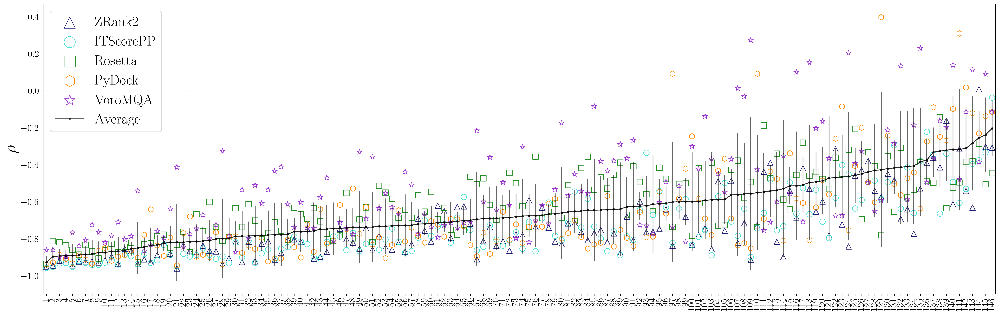

In [45]:
## Only scores that do well now

fig, ax = plt.subplots(figsize = (25,8), dpi = 300)

num_samples = len(ss_corr_df) + len(bm55_corr_df)
colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

mean_data = np.array(list(avg_df_ss["avg_rho"]) + list(avg_df_bm55["avg_rho"]))

stdev_data = np.array(list(avg_df_ss["std_rho"]) + list(avg_df_bm55["std_rho"]))

## spearman data will be the first 5 scoring functions

spearman_data = [
    comb_score_list_84_ss[0] + comb_score_list_bm55[0],
    comb_score_list_84_ss[1] + comb_score_list_bm55[1],
    comb_score_list_84_ss[2] + comb_score_list_bm55[2],
    comb_score_list_84_ss[3] + comb_score_list_bm55[3],
    comb_score_list_84_ss[4] + comb_score_list_bm55[4]
]

spearman_data = np.array(spearman_data)

sorted_data = spearman_data[:, mean_data.argsort()]

sorted_mean_data = mean_data[mean_data.argsort()]

sorted_stdev_data = stdev_data[mean_data.argsort()]


pdb_order = list(np.array(list(ss_corr_df["pdb"]) + list(bm55_corr_df["pdb"]))[mean_data.argsort()])
print(pdb_order)
label_ticks = list(range(1, num_samples+1))
x = np.linspace(0.5, num_samples-0.5, num_samples)
plt.xticks(x, label_ticks)
plt.xticks(rotation = 90, fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlim(0, num_samples)

## Plot the data with scatter plots

marker_size = 100

ax.scatter(x, sorted_data[0], color = colors[0], marker = "^", label = "ZRank2", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[1], color = colors[1], marker = "o", label = "ITScorePP", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[2], color = colors[2], marker = "s", label = "Rosetta", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[3], color = colors[3], marker = "h", label = "PyDock", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[4], color = colors[4], marker = "*", label = "VoroMQA", facecolor = "None", s = marker_size)
# ax.scatter(deeprank_x, deeprank_scores_sort, color = colors[6], marker = "d", label = "Deeprank-GNN-ESM", facecolor = "None", s = marker_size)

plt.errorbar(x, sorted_mean_data, yerr = sorted_stdev_data, color = "black", marker = ".", alpha = 0.6)

ax.plot(x, sorted_mean_data, color = "black", marker = ".", label = "Average", alpha = 0.6)

ax.set_ylabel(r"$\rho$", fontsize = 30)

fig.tight_layout()
lgnd = plt.legend(fontsize = 25)
lgnd.legendHandles[0]._sizes = [400]
lgnd.legendHandles[1]._sizes = [400]
lgnd.legendHandles[2]._sizes = [400]
lgnd.legendHandles[3]._sizes = [400]
lgnd.legendHandles[4]._sizes = [400]
# lgnd.legendHandles[5]._sizes = [400]
plt.grid(axis = "y", color = 'black', linestyle = '--', linewidth = 0.5)
plt.savefig(join(figure_save_dir, "big_figure_all_targets.png"))

## FIgure 6 redo

In [55]:
## Getting the BM5.5 physical data 

os.chdir("/Users/jakesumner/OneDrive/Desktop/Yale CBB/OHern Lab/Rebuttal_data")

bm_55_contacts = pd.read_csv("bm_55_contacts.txt")
bm_55_separability = pd.read_csv("bm_55_intertwined.csv")
bm_55_sasa = pd.read_csv("bm_55_sasa.csv")

In [56]:
bm_55_separability

,Unnamed: 0,decoy,flatness_p3
0,0,1ACB_complex_H,0.975254
1,1,1ATN_complex_H,0.989428
2,2,1AVX_complex_H,0.979170
3,3,1AY7_complex_H,0.986755
4,4,1BKD_complex_H,0.975384
...,...,...,...
62,62,2UUY_complex_H,0.976913
63,63,2VDB_complex_H,0.988482
64,64,2Z0E_complex_H,0.975709
65,65,3SGQ_complex_H,0.972379


In [57]:
bm_55_contacts.columns

Index(['Unnamed: 0', 'decoy', 'ca_8.0', 'ca_8.1', 'ca_8.2', 'ca_8.3', 'ca_8.4',
       'ca_8.5', 'ca_8.6', 'ca_8.7', 'ca_8.8', 'ca_8.9', 'ca_9.0', 'ca_9.1',
       'ca_9.2', 'ca_9.3', 'ca_9.4', 'ca_9.5', 'ca_9.6', 'ca_9.7', 'ca_9.8',
       'ca_9.9', 'ca_10.0', 'ha_nu_4.0', 'ha_nu_4.1', 'ha_nu_4.2', 'ha_nu_4.3',
       'ha_nu_4.4', 'ha_nu_4.5', 'ha_nu_4.6', 'ha_nu_4.7', 'ha_nu_4.8',
       'ha_nu_4.9', 'ha_nu_5.0', 'ha_u_4.0', 'ha_u_4.1', 'ha_u_4.2',
       'ha_u_4.3', 'ha_u_4.4', 'ha_u_4.5', 'ha_u_4.6', 'ha_u_4.7', 'ha_u_4.8',
       'ha_u_4.9', 'ha_u_5.0'],
      dtype='object')

In [58]:
bm55_corr_df

,Unnamed: 0,pdb,pearson_ialign_zrank,pearson_ialign_rosetta,pearson_ialign_pydock,pearson_ialign_voromqa,pearson_ialign_itscorepp,pearson_ialign_deeprank_gnn_esm,pearson_dockq_zrank,pearson_dockq_rosetta,...,spearman_dockq_pydock,spearman_dockq_voromqa,spearman_dockq_itscorepp,spearman_dockq_deeprank_gnn_esm,zrank_auc,rosetta_auc,pydock_auc,voromqa_auc,itscorepp_auc,deeprank_gnn_esm_auc
0,0,1atn,-0.701748,-0.814185,-0.765695,0.755898,-0.773925,0.213292,-0.679654,-0.801201,...,-0.694023,0.741217,-0.685142,0.305989,0.843138,0.904464,0.893941,0.931399,0.879778,0.637080
1,1,1avx,-0.754668,-0.423879,-0.693153,0.695567,-0.884624,0.821207,-0.756576,-0.411842,...,-0.716679,0.701260,-0.866662,0.845152,0.882878,0.680732,0.848885,0.860640,0.946544,0.938535
2,2,1bkd,-0.924694,-0.808379,-0.811108,0.625071,-0.934335,0.853222,-0.926980,-0.790738,...,-0.763974,0.723978,-0.907601,0.866004,0.955087,0.867340,0.927300,0.863130,0.965019,0.942292
3,3,1buh,-0.492417,-0.246302,-0.636306,0.647249,-0.685874,0.271406,-0.478806,-0.221350,...,-0.691726,0.753957,-0.660055,0.235559,0.751289,0.588082,0.880398,0.887864,0.873865,0.606526
4,4,1bvn,-0.860333,-0.742462,-0.758543,0.565746,-0.856763,0.422170,-0.878961,-0.707210,...,-0.813614,0.437289,-0.873587,0.434093,0.941509,0.811410,0.937861,0.746090,0.949593,0.707875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,57,2uuy,-0.640163,-0.546956,0.055798,0.211420,-0.586004,0.882667,-0.609086,-0.512564,...,0.017687,0.113460,-0.529989,0.906612,0.729900,0.666689,0.402402,0.543574,0.701726,0.950437
58,58,2vdb,-0.760948,-0.549993,-0.720007,0.589503,-0.794037,0.208813,-0.696488,-0.527390,...,-0.655367,0.724777,-0.644790,0.252510,0.829084,0.754796,0.849886,0.893036,0.852528,0.609427
59,59,2z0e,-0.901351,-0.196637,-0.760310,0.715439,-0.880309,0.862561,-0.898535,-0.195870,...,-0.703977,0.735262,-0.784073,0.861474,0.938141,0.765593,0.870043,0.880241,0.921113,0.915680
60,60,3sgq,-0.162093,-0.679023,-0.224424,0.288138,-0.354094,0.891297,-0.087497,-0.692901,...,-0.268219,0.197243,-0.340168,0.914801,0.528666,0.786844,0.582124,0.610270,0.633284,0.959168


In [59]:
ss_corr_df

,Unnamed: 0,pdb,pearson_ialign_zrank,pearson_ialign_hdock,pearson_ialign_rosetta,pearson_ialign_pydock,pearson_ialign_voromqa,pearson_ialign_voromqa_js,pearson_ialign_dove_5,pearson_ialign_intertwined,...,contact_43_auc,contact_44_auc,contact_45_auc,interface_rsa_auc,itscorepp_auc,flatness_p3,resolution,complex_sasa,monomer_sasa,relative_interface_sasa
0,0,1acb,-0.717506,-0.572495,-0.818415,-0.742908,0.774556,0.848402,0.564269,-0.550571,...,0.762547,0.764547,0.764325,0.644104,0.772073,0.975254,2.00,13210.040041,14768.793567,0.105544
1,1,1ay7,-0.804331,-0.644121,-0.720965,-0.518193,0.524763,0.730545,0.788741,-0.439244,...,0.856978,0.855582,0.855477,0.866396,0.852197,0.986755,1.70,9183.406105,10429.633791,0.119489
2,2,1c3a,-0.965753,-0.961120,-0.938805,-0.954437,0.768060,0.969857,-0.877749,-0.791142,...,0.984526,0.984476,0.985112,0.987780,0.991357,0.928116,2.50,13225.609142,16856.480544,0.215399
3,3,1euv,-0.903749,-0.810849,-0.561124,-0.861152,0.159493,0.793307,0.497068,-0.812000,...,0.964044,0.962955,0.962283,0.955443,0.966066,0.977500,1.60,14257.751994,16597.227354,0.140956
4,4,1f60,-0.934282,-0.954465,-0.874791,-0.824968,0.788822,0.839942,-0.579722,-0.814475,...,0.961521,0.961780,0.961856,0.964506,0.971226,0.968571,1.67,22759.106785,26255.747109,0.133176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,79,6zbk,-0.781797,-0.774058,-0.835361,-0.678408,0.624669,0.850289,0.749478,-0.432070,...,0.870750,0.869815,0.870923,0.903562,0.925137,0.988550,1.49,10502.811829,12380.058724,0.151635
80,80,7bxh,-0.804953,-0.820440,-0.814243,-0.720781,0.732772,0.929094,-0.467024,-0.319278,...,0.934254,0.934713,0.933303,0.882509,0.937586,0.977949,2.70,24004.295239,26437.741182,0.092044
81,81,7joe,-0.777183,-0.849470,-0.664958,-0.580647,0.694228,0.888198,0.623389,-0.771127,...,0.867603,0.869121,0.872491,0.871404,0.915791,0.972420,2.60,16411.454745,18374.501339,0.106835
82,82,7jxv,-0.619194,-0.622669,-0.477439,-0.504229,0.413785,0.575321,0.558159,0.088424,...,0.685357,0.688350,0.691165,0.722158,0.829122,0.994932,2.35,16126.311027,17441.072942,0.075383


In [60]:
## Combining the physical features into the df

new_dict = {
    "pdb" : [],
    "flatness_p3" : [],
    "contact_45" : []
}

for i in range(len(bm_55_contacts)):

    ## 67 total

    ## Get the pbd_id

    curr_row_c = bm_55_contacts.iloc[i]
    curr_row_s = bm_55_separability.iloc[i]

    pdb_id = curr_row_c["decoy"][:4].lower()

    if pdb_id in list(bm55_corr_df["pdb"]):

        new_dict["pdb"].append(pdb_id)
        new_dict["flatness_p3"].append(curr_row_s["flatness_p3"])
        new_dict["contact_45"].append(curr_row_c["ha_u_4.5"])

new_df = pd.DataFrame(new_dict)

new_df
        

,pdb,flatness_p3,contact_45
0,1atn,0.989428,51
1,1avx,0.979170,51
2,1bkd,0.975384,86
3,1buh,0.994356,42
4,1bvn,0.988506,59
...,...,...,...
57,2uuy,0.976913,47
58,2vdb,0.988482,55
59,2z0e,0.975709,84
60,3sgq,0.972379,37


In [61]:
bm55_corr_df = bm55_corr_df.merge(new_df, on = "pdb")

In [62]:
bm55_corr_df

,Unnamed: 0,pdb,pearson_ialign_zrank,pearson_ialign_rosetta,pearson_ialign_pydock,pearson_ialign_voromqa,pearson_ialign_itscorepp,pearson_ialign_deeprank_gnn_esm,pearson_dockq_zrank,pearson_dockq_rosetta,...,spearman_dockq_itscorepp,spearman_dockq_deeprank_gnn_esm,zrank_auc,rosetta_auc,pydock_auc,voromqa_auc,itscorepp_auc,deeprank_gnn_esm_auc,flatness_p3,contact_45
0,0,1atn,-0.701748,-0.814185,-0.765695,0.755898,-0.773925,0.213292,-0.679654,-0.801201,...,-0.685142,0.305989,0.843138,0.904464,0.893941,0.931399,0.879778,0.637080,0.989428,51
1,1,1avx,-0.754668,-0.423879,-0.693153,0.695567,-0.884624,0.821207,-0.756576,-0.411842,...,-0.866662,0.845152,0.882878,0.680732,0.848885,0.860640,0.946544,0.938535,0.979170,51
2,2,1bkd,-0.924694,-0.808379,-0.811108,0.625071,-0.934335,0.853222,-0.926980,-0.790738,...,-0.907601,0.866004,0.955087,0.867340,0.927300,0.863130,0.965019,0.942292,0.975384,86
3,3,1buh,-0.492417,-0.246302,-0.636306,0.647249,-0.685874,0.271406,-0.478806,-0.221350,...,-0.660055,0.235559,0.751289,0.588082,0.880398,0.887864,0.873865,0.606526,0.994356,42
4,4,1bvn,-0.860333,-0.742462,-0.758543,0.565746,-0.856763,0.422170,-0.878961,-0.707210,...,-0.873587,0.434093,0.941509,0.811410,0.937861,0.746090,0.949593,0.707875,0.988506,59
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,57,2uuy,-0.640163,-0.546956,0.055798,0.211420,-0.586004,0.882667,-0.609086,-0.512564,...,-0.529989,0.906612,0.729900,0.666689,0.402402,0.543574,0.701726,0.950437,0.976913,47
58,58,2vdb,-0.760948,-0.549993,-0.720007,0.589503,-0.794037,0.208813,-0.696488,-0.527390,...,-0.644790,0.252510,0.829084,0.754796,0.849886,0.893036,0.852528,0.609427,0.988482,55
59,59,2z0e,-0.901351,-0.196637,-0.760310,0.715439,-0.880309,0.862561,-0.898535,-0.195870,...,-0.784073,0.861474,0.938141,0.765593,0.870043,0.880241,0.921113,0.915680,0.975709,84
60,60,3sgq,-0.162093,-0.679023,-0.224424,0.288138,-0.354094,0.891297,-0.087497,-0.692901,...,-0.340168,0.914801,0.528666,0.786844,0.582124,0.610270,0.633284,0.959168,0.972379,37


In [63]:
print(list(bm55_corr_df["pdb"]))

['1atn', '1avx', '1bkd', '1buh', '1bvn', '1cgi', '1clv', '1d6r', '1dfj', '1e96', '1f34', '1fc2', '1fle', '1fq1', '1gla', '1h1v', '1he8', '1ira', '1j2j', '1kac', '1ktz', '1kxp', '1m10', '1mah', '1nw9', '1oc0', '1oph', '1ppe', '1r0r', '1r8s', '1t6b', '1tmq', '1udi', '1us7', '1y64', '1z5y', '1zhh', '1zhi', '1zli', '2a5t', '2a9k', '2ayo', '2b42', '2btf', '2c0l', '2fju', '2g77', '2hle', '2hrk', '2nz8', '2o3b', '2o8v', '2oob', '2ot3', '2oza', '2sic', '2sni', '2uuy', '2vdb', '2z0e', '3sgq', '7cei']


In [66]:
base_dir = "/Users/jakesumner/OneDrive/Desktop/Yale CBB/OHern Lab/Rebuttal_data"

os.chdir(base_dir)

orig_84_contact_df = pd.read_csv("targets_84_contacts.csv")

In [67]:
orig_84_contact_df

,Unnamed: 0,decoy,ca_8.0,ca_8.1,ca_8.2,ca_8.3,ca_8.4,ca_8.5,ca_8.6,ca_8.7,...,ha_u_4.1,ha_u_4.2,ha_u_4.3,ha_u_4.4,ha_u_4.5,ha_u_4.6,ha_u_4.7,ha_u_4.8,ha_u_4.9,ha_u_5.0
0,0,1acb_complex_H,43,48,49,54,57,61,66,72,...,43,46,48,50,52,54,55,59,63,63
1,1,1ay7_complex_H,22,27,28,29,30,34,35,37,...,29,31,32,32,34,36,36,39,39,40
2,2,1bpl_complex_H,149,156,165,174,184,191,203,212,...,151,161,170,180,189,198,205,207,213,217
3,3,1brb_complex_H,50,52,55,57,59,63,66,69,...,40,44,45,48,48,52,54,54,56,59
4,4,1c3a_complex_H,93,96,100,108,116,126,132,140,...,93,98,101,105,107,109,111,118,125,127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,94,6zbk_complex_H,28,33,35,37,42,44,47,52,...,42,45,48,51,53,55,56,57,58,59
95,95,7bxh_complex_H,40,42,45,48,51,58,64,67,...,47,55,56,62,64,66,72,76,81,82
96,96,7joe_complex_H,46,47,49,52,56,62,69,73,...,53,55,60,63,66,67,68,69,71,75
97,97,7jxv_complex_H,30,32,34,37,38,40,40,41,...,27,29,32,32,34,34,36,38,39,40


84
62
99


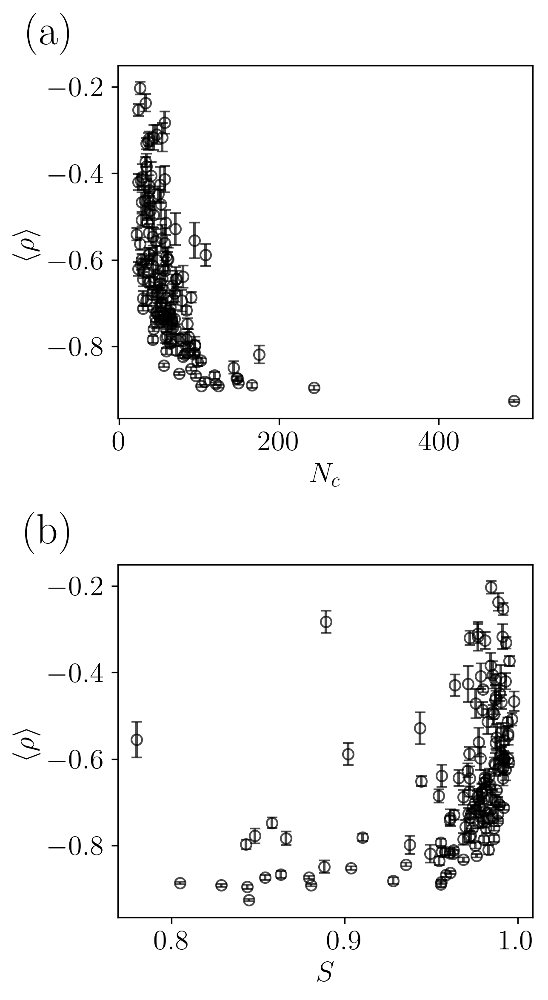

In [84]:
## Final Flatness Correlation Figure - NO DOVE Averaged together

fig, ax = plt.subplots(2, 1,figsize = (4.5,8), dpi = 300)

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

font_size = 16

## Interface Flatness for original 84

flatness_avg = [
    np.array(ss_corr_df["spearman_dockq_zrank"]), np.array(ss_corr_df["spearman_dockq_itscorepp"]), 
    np.array(ss_corr_df["spearman_dockq_rosetta"]), ss_corr_df["spearman_dockq_pydock"], 
    np.array(ss_corr_df["spearman_dockq_voromqa"])*-1, np.array(ss_corr_df["spearman_dockq_deeprank_gnn_esm"])*-1
]

flatness_avg = np.array(flatness_avg)
flatness_std = np.std(flatness_avg, axis = 0)
flatness_avg = np.mean(flatness_avg, axis = 0)
print(len(flatness_avg))

## interface flatness for the new 62 from BM55 HELL YEAH!

flatness_avg_55 = [
    np.array(bm55_corr_df["spearman_dockq_zrank"]), np.array(bm55_corr_df["spearman_dockq_itscorepp"]), 
    np.array(bm55_corr_df["spearman_dockq_rosetta"]), bm55_corr_df["spearman_dockq_pydock"], 
    np.array(bm55_corr_df["spearman_dockq_voromqa"])*-1
]

flatness_avg_55 = np.array(flatness_avg_55)
flatness_std_55 = np.std(flatness_avg_55, axis = 0)
flatness_avg_55 = np.mean(flatness_avg_55, axis = 0)

print(len(flatness_avg_55))

#### Panel A ####

print(len(orig_84_contact_df["ha_nu_4.5"]))

contact_list = []

pdb_set = set(ss_corr_df["pdb"])

for i in range(len(orig_84_contact_df["ha_u_4.5"])):

    curr_row = orig_84_contact_df.iloc[i]

    decoy_name = curr_row["decoy"]

    pdb_id = decoy_name[:4]

    if pdb_id.lower() in pdb_set:

        contact_list.append(curr_row["ha_u_4.5"])

contact_list = contact_list[:65] + contact_list[66:]

ax[0].errorbar(contact_list, flatness_avg, yerr = np.array(flatness_std)/10, color = "black", marker = "o",  
               markerfacecolor = "None", ls = "None", alpha = 0.7, capsize = 3)

ax[0].errorbar(bm55_corr_df["contact_45"], flatness_avg_55, yerr = np.array(flatness_std_55)/10, color = "black", marker = "o",  
               markerfacecolor = "None", ls = "None", alpha = 0.7, capsize = 3)


ax[0].set_xlabel("$N_c$", fontsize = font_size)
ax[0].set_ylabel(r"$\langle \rho \rangle$", fontsize = font_size)


ax[0].tick_params(axis='both', which='major', labelsize=font_size)

#### Panel B ####

ax[1].errorbar(ss_corr_df["flatness_p3"], flatness_avg, yerr = np.array(flatness_std)/10, color = "black", marker = "o",  
               markerfacecolor = "None", ls = "None", alpha = 0.7, capsize = 3)

ax[1].errorbar(bm55_corr_df["flatness_p3"], flatness_avg_55, yerr = np.array(flatness_std_55)/10, color = "black", marker = "o",  
               markerfacecolor = "None", ls = "None", alpha = 0.7, capsize = 3)


ax[1].set_xlabel("$S$", fontsize = font_size)
ax[1].set_ylabel(r"$\langle \rho \rangle$", fontsize = font_size)


ax[1].tick_params(axis='both', which='major', labelsize=font_size)

letters = ['a', 'b']
for i in range(2):
    ax[i].tick_params(axis='both', which='major', labelsize=font_size)
    ax[i].text(-0.1, 1.15, f"({letters[i]})", transform=ax[i].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')


fig.tight_layout()
plt.savefig(join(figure_save_dir, "rel_interface_and_Nc_no_dove_avg_full_146_targs.png"))

## Create Benchmark 55 Score Dictionary

In [56]:
## Code to read all the score files

def create_dockq_df_relax(dockq_dir, dockq_files=None):
    '''
    Creates a pandas dataframe from the dockq data for each
    decoy.
    It returns a dictionary of dataframes, with the key being the pdb ID
    '''
    os.chdir(dockq_dir)
    all_dataframes = {}
    
    dockq_files = sorted([f for f in listdir(dockq_dir) if isfile(join(dockq_dir, f)) and "dockq_output.txt" in f])
    
    ## Parses through the files, storing the data in a pandas dataframe
    for score_file in dockq_files:
        temp_decoy_dockq = get_dockq_results_from_output(dockq_dir, score_file)
        
        temp_dict = {}
        for decoy, scores in list(temp_decoy_dockq.items()):
            if "Decoy" not in temp_dict:
                temp_dict["Decoy"] = []
            if "Model" not in temp_dict:
                temp_dict["Model"] = []
            if "Fnat" not in temp_dict:
                temp_dict["Fnat"] = []
            if "iRMSD" not in temp_dict:
                temp_dict["iRMSD"] = []
            if "LRMSD" not in temp_dict:
                temp_dict["LRMSD"] = []
            if "CAPRI" not in temp_dict:
                temp_dict["CAPRI"] = []
            if "DockQ" not in temp_dict:
                temp_dict["DockQ"] = []
            temp_dict["Decoy"].append(decoy.split("_complex_H")[0])   # index
            temp_dict["Model"].append(int(decoy.split("_")[3]))
            temp_dict["Fnat"].append(scores[0]) # iAlign score
            temp_dict["iRMSD"].append(scores[1]) # iRMSD
            temp_dict["LRMSD"].append(scores[2]) # norm RMSD
            temp_dict["CAPRI"].append(scores[3]) # ZRank score
            temp_dict["DockQ"].append(scores[4]) # HDock score
                    
        ## create data frame
        all_dataframes[score_file[:4]] = pd.DataFrame(temp_dict)
    
    return all_dataframes


def get_dockq_results_from_output(dir_loc, dockq_filename, special = False):
    '''
    take the dir_loc and dockq_filename and pulls all the data for each file
    and puts it in a dictionary, which is returned
    '''
    final_dict = {}
    os.chdir(dir_loc)
    file_obj = open(dockq_filename, "r")
    temp_name = ''
    temp_lst = []
    for line in file_obj:
        if line[0] == " ":
            continue
        elif line[:10] in "DockQ Data" and not special:
            temp_name = line.split()[-1]
        elif line[:5] in "Model" and special:
            temp_name = line.split()[-1]
        elif line[:4] in "Fnat":
            fnat = float(line.split()[1])
            temp_lst.append(fnat)
        elif line[:4] in "iRMS":
            irms = float(line.split()[1])
            temp_lst.append(irms)
        elif line[:4] in "LRMS":
            lrms = float(line.split()[1])
            temp_lst.append(lrms)
        elif line[:5] in "CAPRI":
            capri = line.split()[1]
            temp_lst.append(capri)
        elif line[:5] in "DockQ":
            ## Final entry for the element -> add to dictionary and reset
            dockq = float(line.split()[1])
            temp_lst.append(dockq)
            final_dict[temp_name] = temp_lst
            temp_name = ''
            temp_lst = []
    return final_dict

def create_dockq_df_multi_file(dockq_dir, special = False, file_indicator = "dockq_output.txt", grace = False):
    '''
    Creates a pandas dataframe from the dockq data for each
    decoy.
    It returns a dictionary of dataframes, with the key being the pdb ID
    '''
    os.chdir(dockq_dir)
    temp_dict = {}
    dockq_files = sorted([f for f in listdir(dockq_dir) if isfile(join(dockq_dir, f)) and file_indicator in f])
    
    ## Parses through the files, storing the data in a pandas dataframe
    count = 0
    for score_file in dockq_files:
        temp_decoy_dockq = get_dockq_results_from_output(dockq_dir, score_file, special = special)
        for decoy, scores in list(temp_decoy_dockq.items()):
            if "Decoy" not in temp_dict:
                temp_dict["Decoy"] = []
            if "Model" not in temp_dict:
                temp_dict["Model"] = []
            if "Fnat" not in temp_dict:
                temp_dict["Fnat"] = []
            if "iRMSD" not in temp_dict:
                temp_dict["iRMSD"] = []
            if "LRMSD" not in temp_dict:
                temp_dict["LRMSD"] = []
            if "CAPRI" not in temp_dict and not special:
                temp_dict["CAPRI"] = []
            if "DockQ" not in temp_dict:
                temp_dict["DockQ"] = []
            if special:
                temp_dict["Model"].append(int(decoy.split("_")[3]))
                temp_dict["Decoy"].append(decoy.split(".pdb")[0])
            else:
                if grace: 
                    temp_dict["Decoy"].append(decoy.split(".")[0])   # index
                    temp_dict["Model"].append(-1)
                else:
                    temp_dict["Decoy"].append(decoy.split("_corrected_H")[0])   # index
                    temp_dict["Model"].append(int(decoy.split(".")[1].split("_")[0]))
            if special:
                temp_dict["Fnat"].append(scores[0]) # iAlign score
                temp_dict["iRMSD"].append(scores[1]) # iRMSD
                temp_dict["LRMSD"].append(scores[2]) # norm RMSD
                temp_dict["DockQ"].append(scores[3]) # DockQ score
            else:
                temp_dict["Fnat"].append(scores[0]) # iAlign score
                temp_dict["iRMSD"].append(scores[1]) # iRMSD
                temp_dict["LRMSD"].append(scores[2]) # norm RMSD
                temp_dict["CAPRI"].append(scores[3]) # ZRank score
                temp_dict["DockQ"].append(scores[4]) # DockQ score
            count += 1
    
    return pd.DataFrame(temp_dict)

def create_dockq_df_multi_file_special(dockq_dir, special = False, file_indicator = "dockq_output.txt"):
    '''
    Creates a pandas dataframe from the dockq data for each
    decoy.
    It returns a dictionary of dataframes, with the key being the pdb ID
    '''
    os.chdir(dockq_dir)
    final_df_dict = {}
    dockq_files = sorted([f for f in listdir(dockq_dir) if isfile(join(dockq_dir, f)) and file_indicator in f])
    
    ## Parses through the files, storing the data in a pandas dataframe
    count = 0
    for score_file in dockq_files:
        pdb_name = score_file.split(".")[0].split("_")[-1]
        temp_dict = {}
        temp_decoy_dockq = get_dockq_results_from_output(dockq_dir, score_file, special = special)
        for decoy, scores in list(temp_decoy_dockq.items()):
            if "Decoy" not in temp_dict:
                temp_dict["Decoy"] = []
            if "Model" not in temp_dict:
                temp_dict["Model"] = []
            if "Fnat" not in temp_dict:
                temp_dict["Fnat"] = []
            if "iRMSD" not in temp_dict:
                temp_dict["iRMSD"] = []
            if "LRMSD" not in temp_dict:
                temp_dict["LRMSD"] = []
            if "CAPRI" not in temp_dict and not special:
                temp_dict["CAPRI"] = []
            if "DockQ" not in temp_dict:
                temp_dict["DockQ"] = []
            if special:
                temp_dict["Model"].append(int(decoy.split("_")[3]))
                temp_dict["Decoy"].append(decoy.split(".pdb")[0])
            else:
                temp_dict["Decoy"].append(decoy.split("_corrected_H")[0])   # index
                temp_dict["Model"].append(int(decoy.split(".")[1].split("_")[0]))
            if special:
                temp_dict["Fnat"].append(scores[0]) # iAlign score
                temp_dict["iRMSD"].append(scores[1]) # iRMSD
                temp_dict["LRMSD"].append(scores[2]) # norm RMSD
                temp_dict["DockQ"].append(scores[3]) # DockQ score
            else:
                temp_dict["Fnat"].append(scores[0]) # iAlign score
                temp_dict["iRMSD"].append(scores[1]) # iRMSD
                temp_dict["LRMSD"].append(scores[2]) # norm RMSD
                temp_dict["CAPRI"].append(scores[3]) # ZRank score
                temp_dict["DockQ"].append(scores[4]) # DockQ score
            count += 1
            
        final_df_dict[pdb_name] = pd.DataFrame(temp_dict)
        
    return final_df_dict

def get_zrank_score(zrank_dir, hdock = False, file_indicator = ".zr.out", grace = False):
    os.chdir(zrank_dir)
    
    zrank_files = sorted([f for f in listdir(zrank_dir) if isfile(join(zrank_dir, f)) and file_indicator in f])
    
    zrank_data = {}
    
    count = 0
    for score_file in zrank_files:
        temp_obj = open(score_file, "r")
        for line in temp_obj:
            line = line.split()
            score = float(line[1])
            if grace:
                decoy = line[0].split(".")[0]
            else:
                decoy = line[0].split("_corrected_H")[0]
            if "Decoy" not in zrank_data:
                zrank_data["Decoy"] = []
            if "ZRank" not in zrank_data:
                zrank_data["ZRank"] = []
            
            zrank_data["Decoy"].append(decoy)
            zrank_data["ZRank"].append(score)
            count += 1
    
#     print("ZRANK COUNT:", count)
    return pd.DataFrame(zrank_data)

def get_hdock_score(hdock_dir, hdock = False, file_indicator = "hdock_scores", grace = False):
    os.chdir(hdock_dir)
    
    hdock_files = sorted([f for f in listdir(hdock_dir) if isfile(join(hdock_dir, f)) and file_indicator in f])
    
    hdock_data = {}
    
    count = 0
    for score_file in hdock_files:
        temp_obj = open(score_file, "r")
        for line in temp_obj:
            line = line.split()
            score = float(line[3])
            if grace:
                if "1itb" in hdock_dir or "2d5r" in hdock_dir:
                    decoy = line[0].split(".")[0]
                else:
                    decoy = line[0].split(".")[0][:-4]
            else:
                decoy = line[0].split("_corrected_H")[0]
            if "Decoy" not in hdock_data:
                hdock_data["Decoy"] = []
            if "HDOCK" not in hdock_data:
                hdock_data["HDOCK"] = []
            if decoy not in hdock_data["Decoy"]:
                hdock_data["Decoy"].append(decoy)
                hdock_data["HDOCK"].append(score)
            count += 1
#     print("HDOCK COUNT:", count)
    return pd.DataFrame(hdock_data)

def get_ialign_scores(ialign_dir, file_indicator = "iAlign", ss = False, grace = False):
    os.chdir(ialign_dir)
    
    ialign_files = sorted([f for f in listdir(ialign_dir) if isfile(join(ialign_dir, f)) and file_indicator in f])
    
    ialign_dict = {}
    ialign_dict["Decoy"] = []
    ialign_dict["IS-Score"] = []
    
    for score_file in ialign_files:
        with open(score_file, "r") as f:
            for line in f:
                if line.startswith("Structure 1") and not ss:
                    line = line.split()
                    ialign_dict["Decoy"].append(line[2].strip("AB_").strip("AB_i").strip("A").strip("AB") + ".pdb")
                elif line.startswith("Structure 1") and ss:
                    ## Special case for the decoy
                    line = line.split()
                    if grace:
                        temp_decoy = line[2].split("_")[:-1]
                        temp_decoy[-1] = re.sub("[^0-9]", "", temp_decoy[-1])
                        ialign_dict["Decoy"].append("_".join(temp_decoy))
                    else:
                        ialign_dict["Decoy"].append(line[2].strip("_H").strip("_").split("_corrected")[0])
                elif line.startswith("IS-score") and "P-value" in line:
                    line = line.split()
                    ialign_dict["IS-Score"].append(float(line[2]))
    
#     print("IALIGN COUNT", len(ialign_dict["Decoy"]))
#     print(len(ialign_dict["IS-Score"]))
    return pd.DataFrame(ialign_dict)

def get_rosetta_score(rosetta_dir, file_indicator, grace = False):
    os.chdir(rosetta_dir)
    
    rosetta_score_files = sorted([f for f in listdir(rosetta_dir) if isfile(join(rosetta_dir, f)) and file_indicator in f])
    
    rosetta_dict = {}
    rosetta_dict["Decoy"] = []
    rosetta_dict["Rosetta"] = []
    
    for score_file in rosetta_score_files:
        with open(score_file, "r") as f:
            temp_num = 0
            for line in f:
                if temp_num < 2:
                    temp_num += 1
                    continue
                line = line.split()
                
                if grace:
                    temp_decoy = line[-1].split("_")
                    temp_decoy = "relaxed_" + "_".join(temp_decoy[:3])
                    if temp_decoy not in rosetta_dict["Decoy"]:
                        rosetta_dict["Decoy"].append(temp_decoy)
                    else:
                        continue
                else:
                    rosetta_dict["Decoy"].append(line[-1].split("_corrected_H_0001")[0])
                    
                rosetta_dict["Rosetta"].append(float(line[1]))
                
                
    return pd.DataFrame(rosetta_dict)

def get_pydock_score(pydock_dir, file_indicator = "pydock", grace = False):
    os.chdir(pydock_dir)
    
    pydock_files = sorted([f for f in listdir(pydock_dir) if isfile(join(pydock_dir, f)) and file_indicator in f])
    
    pydock_data = {}
    
    count = 0
    for score_file in pydock_files:
        temp_obj = open(score_file, "r")
        for line in temp_obj:
            line = line.split()
            score = float(line[5])
            if grace:
                decoy = line[0].split(".")[0]
            else:
                decoy = line[0].split("_corrected_H")[0]
            
            if "Decoy" not in pydock_data:
                pydock_data["Decoy"] = []
            if "PyDock" not in pydock_data:
                pydock_data["PyDock"] = []
            if decoy not in pydock_data["Decoy"]:
                pydock_data["Decoy"].append(decoy)
                pydock_data["PyDock"].append(score)
            count += 1
#     print("PYDOCK COUNT:", count)
    return pd.DataFrame(pydock_data)

def get_voromqa_score(voromqa_dir, file_indicator = "voromqa", grace = False):
    os.chdir(voromqa_dir)
    
    voromqa_files = sorted([f for f in listdir(voromqa_dir) if isfile(join(voromqa_dir, f)) and file_indicator in f])
    
    voromqa_data = {}
    
    count = 0
    for score_file in voromqa_files:
        temp_obj = open(score_file, "r")
        for line in temp_obj:
            line = line.split()
            score = float(line[4])
            if grace:
                decoy = line[0].split(".")[0]
            else:
                decoy = line[0].split("_corrected_H")[0]
            
            if "Decoy" not in voromqa_data:
                voromqa_data["Decoy"] = []
            if "VoroMQA" not in voromqa_data:
                voromqa_data["VoroMQA"] = []
            if decoy not in voromqa_data["Decoy"]:
                voromqa_data["Decoy"].append(decoy)
                voromqa_data["VoroMQA"].append(score)
            count += 1
#     print("VoroMQA COUNT:", count)
    return pd.DataFrame(voromqa_data)

## Function that loops through each folder and automatically creates a balanced dataframe set up for analysis

def get_num_quality_diff_supersampling(sampled_df):
    '''
    Gets the difference in the number of true positives
    and true positives 
    '''
    quality = ["acceptable", "medium", "high"]
    count_good = 0
    count_bad = 0
    for capri in list(sampled_df["CAPRI"]):
        if capri.lower() in quality:
            count_good += 1
        else: 
            count_bad += 1

    diff = abs(count_good - count_bad)
    return diff

def z_score_normalize_df_column(df, ref_column_name, new_column_name):
    '''
    Normalizes the data in "ref_column_name" and adds the normalized data 
    to 'new_column_name'. No return necessary, since df is an existing object
    which is modified
    '''
    df[new_column_name] = (df[ref_column_name] - np.mean(df[ref_column_name]))/np.std(df[ref_column_name])
    return df

def get_itscorepp_scores(itscorepp_dir, file_indicator = "itscorepp", grace = False):
    '''
    Gets the ITScorePP scores from the score files
    '''
    
    os.chdir(itscorepp_dir)
    
    itscore_files = sorted([f for f in listdir(itscorepp_dir) if isfile(join(itscorepp_dir, f)) and file_indicator in f])
    
    cols_to_add = ["Decoy", "itscorepp"]
    
    itscore_data = {col : [] for col in cols_to_add} ## init dict
    
    count = 0
    for score_file in itscore_files:
        with open(score_file, "r") as temp_obj:
            for line in temp_obj:
                line = line.split()
                score = float(line[1])
                if grace:
                    decoy = line[0].split(".")[0]
                else:
                    decoy = line[0].split("_corrected_H")[0]

                if decoy not in itscore_data[cols_to_add[0]]:
                    itscore_data[cols_to_add[0]].append(decoy)
                    itscore_data[cols_to_add[1]].append(float(score))

                count += 1
    return pd.DataFrame(itscore_data)
    
    

def create_balanced_dataset_all_supersampling(score_dir):
    '''
    Loops through all of the folders in the score_dir and
    collects the score data. Outputs a dictionary where
    each key is the PDB ID and each value is a pandas
    DataFrame with all of the score data for that particular
    supersampled target
    '''
    
    score_dirs = sorted([f for f in listdir(score_dir) if isdir(join(score_dir, f)) and "scores_sampled" in f])
    
    final_dict = {}
    
    low_res_pdbs = ["1mbv", "1ry7", "3hw2", "3u82", "4u1c", "6yxj", "8enf"]
    
    grace_pdbs = ['1spp', '3qc8', '2d5r', '1ka9', '3ona', '2wmp', '1itb', '2hth', '2hsm', '1kfu', '1ggp', '1pdk', '2hla', '2pe6', '1c3a', '2dvw', '3gfk', '2oul', '1tfo', '2nts', '1brb', '3k9p']
    
    inter_list = ['1acb', '1acb', '1ay7', '1ay7', '1euv', '1euv', '1f60', '1f60', '1j7d', '1j7d', '1n1j', '1n1j', '1qav', '1qav', '1r8o', '1r8o', '1ugh', '1ugh', '1ugq', '1ugq', '1vet', '1vet', '1wmh', '1wmh', '1wqj', '1wqj', '1wrd', '1wrd', '1xg2', '1xg2', '2bkr', '2bkr', '2fhz', '2fhz', '2g2u', '2g2u', '2grn', '2grn', '2h7z', '2h7z', '3dgp', '3dgp', '3fpn', '3fpn', '3qhy', '3qhy', '3rcz', '3rcz', '3sgb', '3sgb', '3vz9', '3vz9', '3wdg', '3wdg', '3whq', '3whq', '3ygs', '3ygs', '4bi8', '4bi8', '4ct6', '4ct6', '4dbg', '4dbg', '4dhi', '4dhi', '4g6t', '4g6t', '4gi3', '4gi3', '4h5s', '4h5s', '4hwi', '4hwi', '4je3', '4je3', '4k12', '4k12', '4qjf', '4qjf', '4qlp', '4qlp', '4uzz', '4uzz', '4yii', '4yii', '5by8', '5by8', '5dmb', '5dmb', '5k7m', '5k7m', '5maw', '5maw', '5mu7', '5mu7', '5uq2', '5uq2', '5zrz', '5zrz', '6fud', '6fud', '6kp3', '6kp3', '6wg4', '6wg4', '6xod', '6zbk', '6zbk', '7bxh', '7bxh', '7joe', '7joe', '7jxv', '7jxv']
    
    for target_score_dir in score_dirs:
        
        pdb_name = target_score_dir.split("_")[2].strip("/")
        key_name = "_".join(target_score_dir.split("_")[2:4])
            
        print(key_name)
        # print(pdb_name)
        
        
        comb_dir = join(score_dir, target_score_dir)
        
        ## Sampled Decoy Scores
        dockq_fileind_s = f"dockq_scores_{pdb_name}_sampled"
        ialign_fileind_s = f"sampled_iAlign"
        zrank_fileind_s = f"zrank_files_sampled"
        rosetta_fileind_s = "rosetta_scores_sampled"
        pydock_fileind_s = f"pydock_scores_{pdb_name}_sampled"
        voromqa_fileind_s = f"voromqa_scores_{pdb_name}_sampled"
        deeprank_fileind_s = "deeprank_sampled_new"
        itscorepp_fileind_s = "itscorepp_sampled"
        
        dockq_temp_df_s = create_dockq_df_multi_file(comb_dir, file_indicator = dockq_fileind_s)
        ialign_temp_df_s = get_ialign_scores(comb_dir, file_indicator = ialign_fileind_s, ss = True)
        zrank_temp_df_s = get_zrank_score(comb_dir, file_indicator = zrank_fileind_s)
        rosetta_temp_df_s = get_rosetta_score(comb_dir, rosetta_fileind_s)
        pydock_temp_df_s = get_pydock_score(comb_dir, pydock_fileind_s)
        voromqa_temp_df_s = get_voromqa_score(comb_dir, voromqa_fileind_s)
        # deeprank_temp_df_s = get_deeprank_score(comb_dir, file_indicator = deeprank_fileind_s)
        itscorepp_temp_df_s = get_itscorepp_scores(comb_dir, file_indicator = itscorepp_fileind_s)
        
        ## Random Negative Decoy Scores
        dockq_fileind_r = f"dockq_scores_{pdb_name}_random"
        ialign_fileind_r = f"random_iAlign"
        zrank_fileind_r = f"zrank_files_random"
        rosetta_fileind_r = "rosetta_scores_random"
        pydock_fileind_r = f"pydock_scores_{pdb_name}_random"
        voromqa_fileind_r = f"voromqa_scores_{pdb_name}_random"
        deeprank_fileind_r = "deeprank_random_new"
        itscorepp_fileind_r = "itscorepp_random"
        
        dockq_temp_df_r = create_dockq_df_multi_file(comb_dir, file_indicator = dockq_fileind_r)
        ialign_temp_df_r = get_ialign_scores(comb_dir, file_indicator = ialign_fileind_r, ss = True)
        zrank_temp_df_r = get_zrank_score(comb_dir, file_indicator = zrank_fileind_r)
        rosetta_temp_df_r = get_rosetta_score(comb_dir, rosetta_fileind_r)
        pydock_temp_df_r = get_pydock_score(comb_dir, pydock_fileind_r)
        voromqa_temp_df_r = get_voromqa_score(comb_dir, voromqa_fileind_r)
        # deeprank_temp_df_r = get_deeprank_score(comb_dir, file_indicator = deeprank_fileind_r)
        itscorepp_temp_df_r = get_itscorepp_scores(comb_dir, file_indicator = itscorepp_fileind_r)
        
        ## Combine datasets within groups
#         print("iAlign", len(ialign_temp_df_s))
#         print("DockQ", len(dockq_temp_df_s))
#         print("ZRank", len(zrank_temp_df_s))
#         print("HDOCK", len(hdock_temp_df_s))
#         print("Rosetta", len(rosetta_temp_df_s))
#         print("PyDock", len(pydock_temp_df_s))
#         print("VoroMQA", len(voromqa_temp_df_s))
#         print("Dove_5", len(dove_5_temp_df_s))
#         print("Intertwined", len(intertwined_temp_df_s))
#         print("Deeprank", len(deeprank_temp_df_s))
#         print("VoroMQA_JS", len(voromqa_js_temp_df_s))
#         print("Contacts", len(contacts_temp_df_s))
#         print("Interface", len(interface_js_temp_df_s))

#         print(deeprank_temp_df_s)
#         print(dockq_temp_df_s)

        comb_df_s = dockq_temp_df_s.merge(ialign_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(zrank_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(rosetta_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(pydock_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(voromqa_temp_df_s, on='Decoy')
        # comb_df_s = comb_df_s.merge(deeprank_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(itscorepp_temp_df_s, on='Decoy')
        
        
        comb_df_r = dockq_temp_df_r.merge(ialign_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(zrank_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(rosetta_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(pydock_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(voromqa_temp_df_r, on='Decoy')
        # comb_df_r = comb_df_r.merge(deeprank_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(itscorepp_temp_df_r, on='Decoy')
        
        ## Save Those Datasets for later use
        
        os.chdir(score_dir)
        
        # comb_df_s.to_csv(f"{pdb_name}_sampled_scores.csv")
        # comb_df_r.to_csv(f"{pdb_name}_random_scores.csv")
        
        ## Balancing the dataset
        
        balancing_ind = get_num_quality_diff_supersampling(comb_df_s)
        
        temp_balanced_df = pd.concat([comb_df_s, comb_df_r.iloc[:balancing_ind]])
        

        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "ZRank", "ZRank Z-score")
        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "Rosetta", "Rosetta Z-score")
        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "PyDock", "PyDock Z-score")
        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "VoroMQA", "VoroMQA Z-score")
        # temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "Deeprank_gnn_esm", "Deeprank_gnn_esm Z-score")
        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "itscorepp", "itscorepp Z-score")
        
        final_dict[key_name] = temp_balanced_df
        
    return final_dict

In [57]:
def get_deeprank_score(score_dir, file_indicator = "*.pdb"):
    '''
    Gets the deeprank score with the new CSV format
    '''

    os.chdir(score_dir)

    score_file = glob(f"*{file_indicator}*")[0]

    score_df = pd.read_csv(score_file)

    new_df = score_df.rename(columns={"pdb_id" : "Decoy", "predicted_fnat" : "Deeprank_gnn_esm"})

    decoy_list = list(new_df["Decoy"])
    new_decoy_names = [name.split("_corrected")[0].split("oH_")[1] for name in decoy_list]

    new_df["Decoy"] = new_decoy_names

    return new_df

def get_contacts_values(contacts_dir, file_indicator = "contacts", grace = False):
    '''
    Get the contact values for each decoy at the following distances:
    4.5 Å
    '''
    os.chdir(contacts_dir)
    
    contact_files = sorted([f for f in listdir(contacts_dir) if isfile(join(contacts_dir, f)) and file_indicator in f])
    
    cols_to_add = ["Decoy", "Contact_45"]
    
    contact_data = {col : [] for col in cols_to_add} ## init dict
    
    count = 0
    for score_file in contact_files:
        temp_df = pd.read_csv(score_file)
        for i in range(len(temp_df)):
            curr_row = temp_df.iloc[i,:]
            if grace:
                decoy = curr_row["decoy"].split(".")[0]
            else:
                decoy = curr_row["decoy"].split("_corrected_H")[0]
            
            if decoy not in contact_data["Decoy"]:
                contact_data["Decoy"].append(decoy)
                contact_data["Contact_45"].append(curr_row["ha_4.5"])
            count += 1
    return pd.DataFrame(contact_data)

def get_intertwined_score(inter_dir, file_indicator = "intertwined", grace = False):
    os.chdir(inter_dir)
    
    inter_files = sorted([f for f in listdir(inter_dir) if isfile(join(inter_dir, f)) and file_indicator in f])
    
    inter_data = {}
    
    colname = "Intertwined"
    
    count = 0
    first = True
    for score_file in inter_files:
        temp_obj = open(score_file, "r")
        for line in temp_obj:
            if first:
                first = False
                continue
            line = line.split(",")
            score = float(line[2])
            if grace:
                decoy = line[1].split(".")[0].strip("NoH_")
            else:
                decoy = line[1].split("_corrected_H")[0].strip("NoH_")
            
            if "Decoy" not in inter_data:
                inter_data["Decoy"] = []
            if colname not in inter_data:
                inter_data[colname] = []
            if decoy not in inter_data["Decoy"]:
                inter_data["Decoy"].append(decoy)
                inter_data[colname].append(score)
            count += 1
#     print("PYDOCK COUNT:", count)
    return pd.DataFrame(inter_data)


def create_balanced_dataset_all_supersampling_bm55(score_dir):
    '''
    Loops through all of the folders in the score_dir and
    collects the score data. Outputs a dictionary where
    each key is the PDB ID and each value is a pandas
    DataFrame with all of the score data for that particular
    supersampled target
    '''
    
    score_dirs = sorted([f for f in listdir(score_dir) if isdir(join(score_dir, f)) and "scores_sampled" in f])
    
    final_dict = {}
    
    low_res_pdbs = ["1mbv", "1ry7", "3hw2", "3u82", "4u1c", "6yxj", "8enf"]
    
    grace_pdbs = ['1spp', '3qc8', '2d5r', '1ka9', '3ona', '2wmp', '1itb', '2hth', '2hsm', '1kfu', '1ggp', '1pdk', '2hla', '2pe6', '1c3a', '2dvw', '3gfk', '2oul', '1tfo', '2nts', '1brb', '3k9p']
    
    inter_list = ['1acb', '1acb', '1ay7', '1ay7', '1euv', '1euv', '1f60', '1f60', '1j7d', '1j7d', '1n1j', '1n1j', '1qav', '1qav', '1r8o', '1r8o', '1ugh', '1ugh', '1ugq', '1ugq', '1vet', '1vet', '1wmh', '1wmh', '1wqj', '1wqj', '1wrd', '1wrd', '1xg2', '1xg2', '2bkr', '2bkr', '2fhz', '2fhz', '2g2u', '2g2u', '2grn', '2grn', '2h7z', '2h7z', '3dgp', '3dgp', '3fpn', '3fpn', '3qhy', '3qhy', '3rcz', '3rcz', '3sgb', '3sgb', '3vz9', '3vz9', '3wdg', '3wdg', '3whq', '3whq', '3ygs', '3ygs', '4bi8', '4bi8', '4ct6', '4ct6', '4dbg', '4dbg', '4dhi', '4dhi', '4g6t', '4g6t', '4gi3', '4gi3', '4h5s', '4h5s', '4hwi', '4hwi', '4je3', '4je3', '4k12', '4k12', '4qjf', '4qjf', '4qlp', '4qlp', '4uzz', '4uzz', '4yii', '4yii', '5by8', '5by8', '5dmb', '5dmb', '5k7m', '5k7m', '5maw', '5maw', '5mu7', '5mu7', '5uq2', '5uq2', '5zrz', '5zrz', '6fud', '6fud', '6kp3', '6kp3', '6wg4', '6wg4', '6xod', '6zbk', '6zbk', '7bxh', '7bxh', '7joe', '7joe', '7jxv', '7jxv']
    
    for target_score_dir in score_dirs:
        
        pdb_name = target_score_dir.split("_")[2].strip("/")
        key_name = "_".join(target_score_dir.split("_")[2:4])
            
        print(key_name)
        # print(pdb_name)
        
        
        comb_dir = join(score_dir, target_score_dir)
        
        ## Sampled Decoy Scores
        dockq_fileind_s = f"dockq_scores_{pdb_name}_sampled"
        ialign_fileind_s = f"sampled_iAlign"
        zrank_fileind_s = f"zrank_files_sampled"
        rosetta_fileind_s = "rosetta_scores_sampled"
        pydock_fileind_s = f"pydock_scores_{pdb_name}_sampled"
        voromqa_fileind_s = f"voromqa_scores_{pdb_name}_sampled"
        deeprank_fileind_s = f"sampled_{pdb_name}_deeprank"
        itscorepp_fileind_s = "itscorepp_sampled"
        intertwined_fileind_s = f"intertwined_{pdb_name}_sampled"
        contacts_fileind_s = f"contacts_{pdb_name}_sampled"
        
        dockq_temp_df_s = create_dockq_df_multi_file(comb_dir, file_indicator = dockq_fileind_s)
        ialign_temp_df_s = get_ialign_scores(comb_dir, file_indicator = ialign_fileind_s, ss = True)
        zrank_temp_df_s = get_zrank_score(comb_dir, file_indicator = zrank_fileind_s)
        rosetta_temp_df_s = get_rosetta_score(comb_dir, rosetta_fileind_s)
        pydock_temp_df_s = get_pydock_score(comb_dir, pydock_fileind_s)
        voromqa_temp_df_s = get_voromqa_score(comb_dir, voromqa_fileind_s)
        deeprank_temp_df_s = get_deeprank_score(comb_dir, file_indicator = deeprank_fileind_s)
        itscorepp_temp_df_s = get_itscorepp_scores(comb_dir, file_indicator = itscorepp_fileind_s)
        intertwined_temp_df_s = get_intertwined_score(comb_dir, file_indicator = intertwined_fileind_s)
        contacts_temp_df_s = get_contacts_values(comb_dir, file_indicator = contacts_fileind_s)
        
        ## Random Negative Decoy Scores
        dockq_fileind_r = f"dockq_scores_{pdb_name}_random"
        ialign_fileind_r = f"random_iAlign"
        zrank_fileind_r = f"zrank_files_random"
        rosetta_fileind_r = "rosetta_scores_random"
        pydock_fileind_r = f"pydock_scores_{pdb_name}_random"
        voromqa_fileind_r = f"voromqa_scores_{pdb_name}_random"
        deeprank_fileind_r = f"random_{pdb_name}_deeprank"
        itscorepp_fileind_r = "itscorepp_random"
        intertwined_fileind_r = f"intertwined_{pdb_name}_random"
        contacts_fileind_r = f"contacts_{pdb_name}_random"
        
        dockq_temp_df_r = create_dockq_df_multi_file(comb_dir, file_indicator = dockq_fileind_r)
        ialign_temp_df_r = get_ialign_scores(comb_dir, file_indicator = ialign_fileind_r, ss = True)
        zrank_temp_df_r = get_zrank_score(comb_dir, file_indicator = zrank_fileind_r)
        rosetta_temp_df_r = get_rosetta_score(comb_dir, rosetta_fileind_r)
        pydock_temp_df_r = get_pydock_score(comb_dir, pydock_fileind_r)
        voromqa_temp_df_r = get_voromqa_score(comb_dir, voromqa_fileind_r)
        deeprank_temp_df_r = get_deeprank_score(comb_dir, file_indicator = deeprank_fileind_r)
        itscorepp_temp_df_r = get_itscorepp_scores(comb_dir, file_indicator = itscorepp_fileind_r)
        intertwined_temp_df_r = get_intertwined_score(comb_dir, file_indicator = intertwined_fileind_r)
        contacts_temp_df_r = get_contacts_values(comb_dir, file_indicator = contacts_fileind_r)
        
        ## Combine datasets within groups
#         print("iAlign", len(ialign_temp_df_s))
#         print("DockQ", len(dockq_temp_df_s))
#         print("ZRank", len(zrank_temp_df_s))
#         print("HDOCK", len(hdock_temp_df_s))
#         print("Rosetta", len(rosetta_temp_df_s))
#         print("PyDock", len(pydock_temp_df_s))
#         print("VoroMQA", len(voromqa_temp_df_s))
#         print("Dove_5", len(dove_5_temp_df_s))
#         print("Intertwined", len(intertwined_temp_df_s))
        # print("Deeprank", len(deeprank_temp_df_s))
        # print(deeprank_temp_df_s)
#         print("VoroMQA_JS", len(voromqa_js_temp_df_s))
#         print("Contacts", len(contacts_temp_df_s))
#         print("Interface", len(interface_js_temp_df_s))

#         print(deeprank_temp_df_s)
#         print(dockq_temp_df_s)

        comb_df_s = dockq_temp_df_s.merge(ialign_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(zrank_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(rosetta_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(pydock_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(voromqa_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(deeprank_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(itscorepp_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(intertwined_temp_df_s, on='Decoy')
        comb_df_s = comb_df_s.merge(contacts_temp_df_s, on='Decoy')
        
        
        comb_df_r = dockq_temp_df_r.merge(ialign_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(zrank_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(rosetta_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(pydock_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(voromqa_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(deeprank_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(itscorepp_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(intertwined_temp_df_r, on='Decoy')
        comb_df_r = comb_df_r.merge(contacts_temp_df_r, on='Decoy')
        
        ## Save Those Datasets for later use
        
        os.chdir(score_dir)
        
        # comb_df_s.to_csv(f"{pdb_name}_sampled_scores.csv")
        # comb_df_r.to_csv(f"{pdb_name}_random_scores.csv")
        
        ## Balancing the dataset
        
        balancing_ind = get_num_quality_diff_supersampling(comb_df_s)
        
        temp_balanced_df = pd.concat([comb_df_s, comb_df_r.iloc[:balancing_ind]])
        

        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "ZRank", "ZRank Z-score")
        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "Rosetta", "Rosetta Z-score")
        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "PyDock", "PyDock Z-score")
        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "VoroMQA", "VoroMQA Z-score")
        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "Deeprank_gnn_esm", "Deeprank_gnn_esm Z-score")
        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "itscorepp", "itscorepp Z-score")
        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "Intertwined", "Intertwined Z-score")
        temp_balanced_df = z_score_normalize_df_column(temp_balanced_df, "Contact_45", "Contact_45 Z-score")
        
        final_dict[key_name] = temp_balanced_df
        
    return final_dict

In [58]:
## Collecting the Benchmark 5 Data

bm55_dir = "/Users/jakesumner/Desktop/PPI Project_2/supersampling/bm_55_scoring"

bm55_ss_dict = create_balanced_dataset_all_supersampling_bm55(bm55_dir)


1atn
1avx
1bkd
1buh
1bvn
1cgi
1clv
1d6r
1dfj
1e96
1f34
1fc2
1fle
1fq1
1gla
1h1v
1he8
1ira
1j2j
1kac
1ktz
1kxp
1m10
1mah
1nw9
1oc0
1oph
1ppe
1r0r
1r8s
1t6b
1tmq
1udi
1us7
1y64
1z5y
1zhh
1zhi
1zli
2a5t
2a9k
2ayo
2b42
2btf
2c0l
2fju
2g77
2hle
2hrk
2nz8
2o3b
2o8v
2oob
2ot3
2oza
2sic
2sni
2uuy
2vdb
2z0e
3sgq
7cei


## Sphere figure 6

In [59]:
## Center of mass for each chain function

def get_com_for_particle(coords):
    '''
    Calculates the center of mass for the coordinates
    provided to the function
    '''
    com = np.mean(coords, axis = 0)
    return com

def get_heterodimer_coords(model_structure):
    '''
    Gets the coordinates for the receptor and ligand
    from the provided model_structure
    '''
    
    rec_coords = []
    lig_coords = []

    chain_num = 0

    for chain in model_structure:

        if chain_num < 2:

            for residue in chain:

                if chain_num == 0:
                    rec_coords.append(list(residue["CA"].get_coord()))

                if chain_num == 1:
                    lig_coords.append(list(residue["CA"].get_coord()))

            chain_num += 1


    ## Get the center of mass for the receptor

    rec_coords = np.array(rec_coords)
    lig_coords = np.array(lig_coords)
    
    return rec_coords, lig_coords

def get_com_for_both_monomers(pdb_list, target_path, include_target = False):
    '''
    Gets the center of mass for both monomers in the 
    dimers fed into the program with the PBD list
    '''
    
    aligner = Bio.PDB.Superimposer()
    parser = Bio.PDB.PDBParser()
    
    ## Create the list to store the centers of mass
    
    com_list = []
    sigma_list = []
    model_name_list = []
    lig_list = []
    
    ## Align all the structures to the target 
    
    target_model, aligned_models = align_pdb_list_to_target(target_path, pdb_list, start = 1, end = 50)
    
    ## Get the COMs for the target_model
    
    if include_target:
        rec_coords, lig_coords = get_heterodimer_coords(target_model)
        rec_com = get_com_for_particle(rec_coords)
        rec_coords_norm = rec_coords - rec_com
        lig_coords_norm = lig_coords - rec_com

        lig_com = get_com_for_particle(lig_coords_norm)

        com_list.append(lig_com)

        sigma_rl = np.sqrt(np.sum(lig_com ** 2))

        sigma_list.append(sigma_rl)

        model_name_list.append("target")
        
        lig_list.append(lig_coords[0])
    
    ## Loop through the structures
    
    first_bool = True
    first_struct = []
    
    for i,pdb_model in enumerate(aligned_models):
                
        model_name_list.append(pdb_list[i].split("_corrected_H")[0])
            
        ## Get the coordinates for the receptor and the ligand chains
        
        rec_coords, lig_coords = get_heterodimer_coords(pdb_model)
        
        rec_com = get_com_for_particle(rec_coords)
        
        ## Normalize all the coordinates based on the receptor center of mass, so that the receptor COM is origin
        
        rec_coords_norm = rec_coords - rec_com
        lig_coords_norm = lig_coords - rec_com
    
        ## Get the center of mass for the ligand
        
        lig_com = get_com_for_particle(lig_coords_norm)
        
        com_list.append(lig_com)
            
        ## Get the displacement of the center of mass of ligand from the center of the receptor
        
        sigma_rl = np.sqrt(np.sum(lig_com ** 2))
        
        sigma_list.append(sigma_rl)
        
        ## Add the orientation vector for each model
        
        lig_list.append(lig_coords[0])
    
    ## Normalize the distance of the center of mass of the ligand so that it matches the <sigma_ij> for all models
    
#     print("Lig list", len(lig_list))
#     print("COM list", len(com_list))
#     print("model list", len(model_name_list))
#     print("sigma list", len(sigma_list))
    
    ## Create a dictionary from the data
    
    tmp_x = [coord[0] for coord in com_list]
    tmp_y = [coord[1] for coord in com_list]
    tmp_z = [coord[2] for coord in com_list]
    
    ## Get Coordinates for a ligand orientation vector, which is the first CA for the ligand
    
    lig_x = [coord[0] for coord in lig_list]
    lig_y = [coord[1] for coord in lig_list]
    lig_z = [coord[2] for coord in lig_list]
    
    ## Add data to the dictionary
    
    tmp_dict = {
        "Decoy" : model_name_list,
        "sigma" : sigma_list,
        "com_x" : tmp_x,
        "com_y" : tmp_y,
        "com_z" : tmp_z,
        "lig_x" : lig_x,
        "lig_y" : lig_y,
        "lig_z" : lig_z,
    }
    
    return pd.DataFrame(tmp_dict)


## Create a function that aligns structures

def align_pdb_list_to_target(target_path, pdb_list, start = 1, end = 50):
    '''
    Aligns all the pdbs in the pdb_list to the 
    pdb in the target path, which is a full path to
    the specific target. Only the coordinates of
    the C-alpha atoms are aligned. Start and end
    are the residues IDs that you are aligning 
    for each 
    '''
    
    ## Create the list of the PDB residue IDs that we are going to align
    
    residue_ids_to_align = range(start, end + 1)
    
    ## Do the PDB parser thing
    
    pdb_parser = Bio.PDB.PDBParser(QUIET = True)
    
    ## Init the superimposer
    
    superimposer = Bio.PDB.Superimposer()

    ## Get the target structure 
    
    target_structure = pdb_parser.get_structure("target", target_path)
    target_model = target_structure[0]
    
    target_ca = []
    
    first_chain_bool = True
    
    for chain in target_model:
        if first_chain_bool:
            
            for residue in chain:
                if residue.get_id()[1] in residue_ids_to_align:
                    target_ca.append(residue['CA'])
                
            first_chain_bool = False
        break
    
    transformed_model_list = []
    
    for pdb_model in pdb_list:
        
        temp_ca = []
        
        temp_structure = pdb_parser.get_structure("model", pdb_model)
        temp_model = temp_structure[0]
        
        for chain in temp_model:
            for residue in chain:
                if residue.get_id()[1] in residue_ids_to_align:
                    temp_ca.append(residue['CA'])
            
            break ## break after the first chain
            
        
        ## Superimpose the model to the target
        
        superimposer.set_atoms(target_ca, temp_ca)
        superimposer.apply(temp_model.get_atoms())
        
        ## Add the transformed model to the list
        
        transformed_model_list.append(temp_model)
        
        
    return target_model, transformed_model_list


def normalize_point_distance(com_df, extra_scalar = 1):
    '''
    Takes in the COM dataframe and outputs
    another dataframe that has all of the 
    COM vectors of the receptor normalized
    so they are all equidistant from the origin
    based on their average distance from the origin
    at the beginning. 
    '''
    
    mean_distance = np.mean(com_df["sigma"])
    
    scalars = mean_distance/np.array(com_df["sigma"]) * extra_scalar
    
    new_x = np.array(com_df["com_x"]) * scalars
    
    new_y = np.array(com_df["com_y"]) * scalars
    
    new_z = np.array(com_df["com_z"]) * scalars
    
    new_dict = {
        "Decoy" : com_df["Decoy"],
        "com_x" : new_x,
        "com_y" : new_y,
        "com_z" : new_z
    }
    
    return pd.DataFrame(new_dict)
    
    

In [60]:
## Moment of intertia tensor functions

def normalize_point_cloud(points, score_vals):
    '''
    Calculates the center of mass of the points
    weighted by the dockq_vals and then normalizes
    the points in the cloud by that center of mass.
    points is nx3, score_vals is nx1
    '''
    
    ## Get the center of "mass" of the points
    
    points = points.T
    
    com_x = np.sum(points[0,:] * score_vals)/np.sum(score_vals)
    com_y = np.sum(points[1,:] * score_vals)/np.sum(score_vals)
    com_z = np.sum(points[2,:] * score_vals)/np.sum(score_vals)
    
    ## Normalize all the points according to the center of "mass"
    
    points[0,:] -= com_x 
    points[1,:] -= com_y 
    points[2,:] -= com_z 
    
#     print(com_x, com_y, com_z)
    
    return points.T

## Calculate the moment of inertia tensor for the point cloud

def calculate_moment_of_inertia_tensor(points, score_vals):
    '''
    Calculates the Moment of inertia tensor for the points
    weighted by the score_vals that are provided to it.
    Moment of inertia tensor is symmetric.
    Points are all normalized according to the center of "mass"
    '''
    
    ## Put score_vals through min/max normalization
    
    score_vals_norm = (score_vals - score_vals.min()) / (score_vals.max() - score_vals.min())
    
    ## Normalize the points
    
#     print(points[:3, :])
    
    points = normalize_point_cloud(points, score_vals_norm)
    
    print(points[:3, :])
    
    ## Get the terms of the moment of inertia tensor
    
    points = points.T
    
    x = points[0,:]
    y = points[1,:]
    z = points[2,:]
    
    i_xx = np.sum(score_vals_norm * (y**2 + z**2))
    i_yy = np.sum(score_vals_norm * (x**2 + z**2))
    i_zz = np.sum(score_vals_norm * (x**2 + y**2))
    
    i_xy = -np.sum(score_vals_norm * x * y)
    i_xz = -np.sum(score_vals_norm * x * z)
    i_yz = -np.sum(score_vals_norm * y * z)
    
    ## Put the terms into a tensor
    
    final_tensor = [
        [i_xx, i_xy, i_xz],
        [i_xy, i_yy, i_yz],
        [i_xz, i_yz, i_zz]
    ]
    
#     print(final_tensor)

    return np.array(final_tensor)

## Volume of the moment of inertia tensor from the determinant of the eigenvalues

def calculate_volume_of_tensor(i_tensor):
    '''
    Calculates the volume of the moment of intertia
    tensor by eigendecomposing the tensor and then
    multiplying the eigenvalues together 
    '''
    
    eigenvalues, eigenvectors = np.linalg.eig(i_tensor)
    
#     print(eigenvalues)
    
    product = 1
    for val in eigenvalues:
        product *= val
        
    return product


# https://scipython.com/book2/chapter-6-numpy/problems/p65/the-moment-of-inertia-tensor/

def translate_to_cofm(masses, xyz):
    # Position of centre of mass in original coordinates
    cofm = sum(masses[:,np.newaxis] * xyz) / np.sum(masses)
    # Transform to CofM coordinates and return
    xyz -= cofm
    return xyz

def get_inertia_matrix(masses, xyz):
    # Moment of intertia tensor
    xyz = translate_to_cofm(masses, xyz)
#     print(xyz[:3, :])
    x, y, z = xyz.T
    Ixx = np.sum(masses * (y**2 + z**2))
    Iyy = np.sum(masses * (x**2 + z**2))
    Izz = np.sum(masses * (x**2 + y**2))
    Ixy = -np.sum(masses * x * y)
    Iyz = -np.sum(masses * y * z)
    Ixz = -np.sum(masses * x * z)
    I = np.array([[Ixx, Ixy, Ixz], [Ixy, Iyy, Iyz], [Ixz, Iyz, Izz]])
    return I

def get_principal_moi(I):
    Ip = np.linalg.eigvals(I)
    # Sort and convert principal moments of inertia to SI (kg.m2)
    Ip.sort()
    return Ip

def pow_dockq(data, power):
    
    data = np.array(data)
    
    return data**power


def sigma_2(I):
    
    ixx = I[0][0]
    iyy = I[1][1]
    izz = I[2][2]
    
    ixy = I[0][1]
    iyz = I[1][2]
    ixz = I[0][2]
    
    diag_part = ixx*iyy + iyy * izz + ixx*izz
    off_diag_part = -ixy**2 - iyz**2 - ixz**2
    
    return diag_part + off_diag_part

# Load in the sphere vector data

In [61]:
## Load in the data
import pickle

os.chdir("/Users/jakesumner/Desktop/PPI Project_2/supersampling/final_manuscript_datasets")

with open("exhaustive_vector_data.pickle", "rb") as f:
    ex_complete_vector_dict = pickle.load(f)
    
with open("supersampled_vector_data.pickle", "rb") as f:
    complete_vector_dict = pickle.load(f)

In [62]:
## Load in the supersampled data

exhaustive_vector_dir = "/Users/jakesumner/Desktop/PPI Project_2/supersampling/exhaustive_vector_data"

os.chdir(exhaustive_vector_dir)

vector_files = glob("*ss*.csv")

vector_dict = {}

for vec_file in vector_files:
    pdb_name = vec_file[:4]
    temp_df = pd.read_csv(vec_file)
    vector_dict[pdb_name] = temp_df
    
    
## Get rid of the .pdb at the end

grace_pdbs = ['1c3a', '1ggp', '1itb', '1kfu', '1pdk', '1spp', '1tfo', '2d5r', '2dvw', '2hla', '2hsm', '2hth', '2oul', '2pe6', '2wmp', '3gfk', '3k9p', '3ona', '3qc8']

for grace_pdb in grace_pdbs:
    

    decoy_list = list(vector_dict[grace_pdb]["Decoy"])

    for i, decoy in enumerate(decoy_list):
        if decoy not in "target":
            decoy_list[i] = decoy[:-4]

    vector_dict[grace_pdb]["Decoy"] = decoy_list

In [63]:
## Load in the BM5.5 Vector data Baybee

bm55_vector_dir = '/Users/jakesumner/Desktop/PPI Project_2/vector_data_bm55'

os.chdir(bm55_vector_dir)

vector_files = glob("*bm55*.csv")

vector_bm55_dict = {}

for vec_file in vector_files:
    pdb_name = vec_file[:4]
    temp_df = pd.read_csv(vec_file)
    vector_bm55_dict[pdb_name] = temp_df

In [64]:
## Merge the two vector dictionaries

merged_vector_dict = vector_dict | vector_bm55_dict

In [65]:
print(vector_bm55_dict.keys())
print(bm55_ss_dict.keys())

dict_keys(['1avx', '2o8v', '2fju', '2sni', '2c0l', '2nz8', '1us7', '1dfj', '1tmq', '1fc2', '2hle', '2uuy', '1oph', '2oob', '2vdb', '1udi', '1y64', '1f34', '1d6r', '1zhi', '1m10', '1kac', '2ot3', '1gla', '2z0e', '2btf', '2a5t', '2ayo', '1ppe', '1zhh', '1cgi', '1zli', '1mah', '1he8', '1fq1', '1fle', '1z5y', '2b42', '2a9k', '1ktz', '1ira', '1j2j', '2oza', '2o3b', '2g77', '1e96', '2hrk', '1clv', '1atn', '7cei', '1bvn', '1r0r', '1oc0', '1kxp', '1t6b', '1nw9', '1h1v', '1bkd', '2sic', '1buh', '3sgq', '1r8s'])
dict_keys(['1atn', '1avx', '1bkd', '1buh', '1bvn', '1cgi', '1clv', '1d6r', '1dfj', '1e96', '1f34', '1fc2', '1fle', '1fq1', '1gla', '1h1v', '1he8', '1ira', '1j2j', '1kac', '1ktz', '1kxp', '1m10', '1mah', '1nw9', '1oc0', '1oph', '1ppe', '1r0r', '1r8s', '1t6b', '1tmq', '1udi', '1us7', '1y64', '1z5y', '1zhh', '1zhi', '1zli', '2a5t', '2a9k', '2ayo', '2b42', '2btf', '2c0l', '2fju', '2g77', '2hle', '2hrk', '2nz8', '2o3b', '2o8v', '2oob', '2ot3', '2oza', '2sic', '2sni', '2uuy', '2vdb', '2z0e', '

In [66]:
## Creating a score connected BM55 dataset as well

complete_bm55_dict = {}

for k,v in bm55_ss_dict.items():

    tmp_df = vector_bm55_dict[k].merge(bm55_ss_dict[k], on="Decoy")

    complete_bm55_dict[k] = tmp_df

In [67]:
complete_merged_vector_dict = complete_vector_dict | complete_bm55_dict

In [68]:
## Testing out the code

score_col = "DockQ"

pdb_list_k2 = []
volume_list = []
moi_list = []
sigma_2_list = []
aspher_list = []

power = 3

for pdb_name, score_df in sorted(list(complete_merged_vector_dict.items())):
    
    x_points = np.array(score_df["com_x"])
    y_points = np.array(score_df["com_y"])
    z_points = np.array(score_df["com_z"])
    
    temp_points = np.array([x_points, y_points, z_points]).T
    
    score_vals = np.array(score_df[score_col])
    
    score_vals = pow_dockq(score_vals, power)
    
#     print(min(score_vals), max(score_vals))

    I = get_inertia_matrix(score_vals, temp_points)
    
    sigma_2_temp = sigma_2(I)
    
    Ip = get_principal_moi(I)
    
#     print(Ip)

    A, B, C, = Ip
    
    temp_volume = A * B * C
    
    aspher = C**2 - 0.5 * (A**2 + B**2)
    
    aspher_list.append(aspher)
    moi_list.append(Ip)
    pdb_list_k2.append(pdb_name)
    volume_list.append(temp_volume)
    sigma_2_list.append(sigma_2_temp)
    
    
def get_relative_anisotropy(moi_list):
    '''
    Divides the tensor by 1000 and then calculates the values of the relative anisotropy
    '''
    
    k2_list = []
    
    for A, B, C in moi_list:
        
        A /= 1000
        B /= 1000
        C /= 1000
        
#         num = A**4 + B**4 + C**4
#         den = (A**2 + B**2 + C**2)**2
        
#         k2_list.append(1.5 * (num/den) - 0.5)

        num = A**2 + B**2 + C**2
        den = (A + B + C)**2
        
        k2_list.append(1.5 * (num/den) - 0.5)

#         num = A*B + B*C + C*A
#         den = (A + B + C)**2
        
#         k2_list.append(1-3*(num/den))
        
    return k2_list
    

In [69]:
## Get the data for panel D of the plot!

k2_data = get_relative_anisotropy(moi_list)

rho_sphere_data_aligned = []

ss_pdb_list = list(ss_corr_df["pdb"])
bm55_pdb_list = list(bm55_corr_df["pdb"])

for pdb_id in pdb_list_k2:

    if pdb_id in ss_pdb_list:
        rho_sphere_data_aligned.append(avg_df_ss[avg_df_ss["pdb"] == pdb_id].iloc[0]["avg_rho"])

    elif pdb_id in bm55_pdb_list:
        rho_sphere_data_aligned.append(avg_df_bm55[avg_df_bm55["pdb"] == pdb_id].iloc[0]["avg_rho"])

In [70]:
print(len(k2_data))

146


In [71]:
print(len(rho_sphere_data_aligned))

146


Spearman correlation for Panel D: 0.42303799176732576


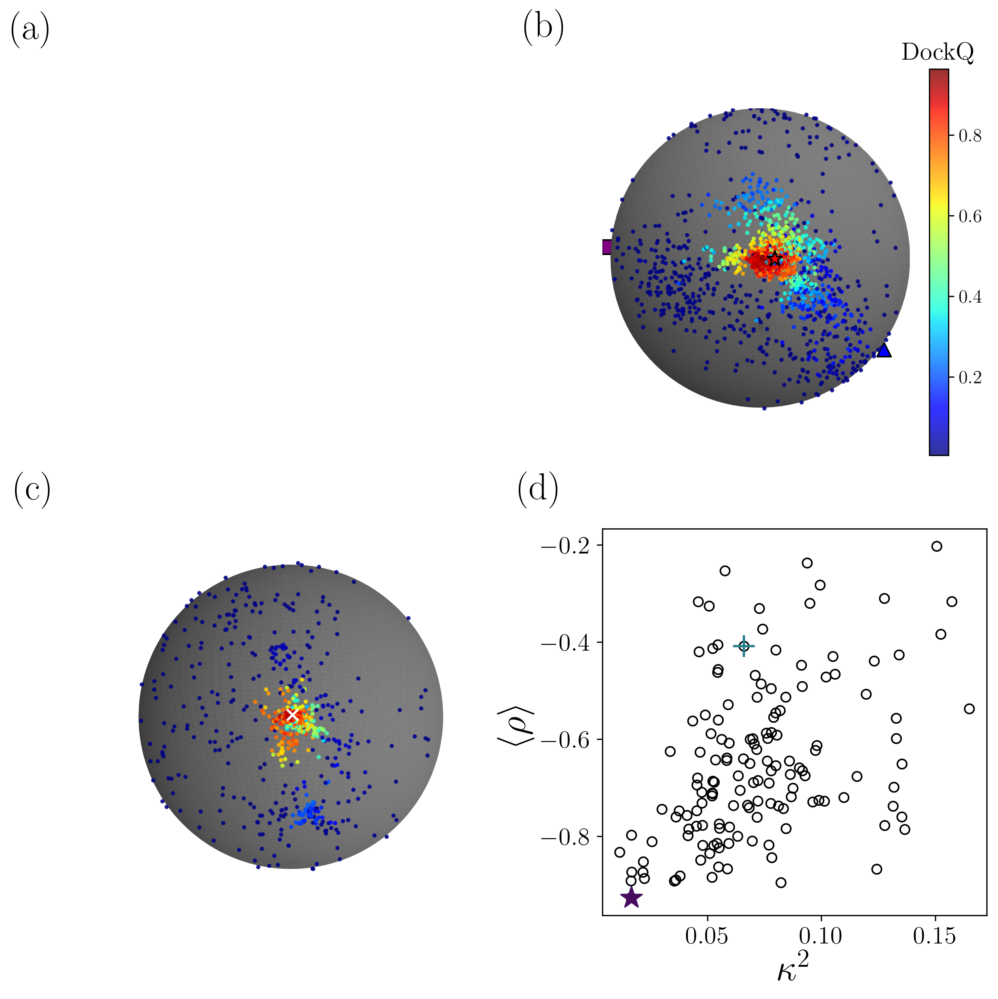

In [72]:
## Plotting everything together

fontsize = 16

%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable

# fig, ax = plt.subplots(2, 2, figsize = (8,8), dpi = 300)

fig = plt.figure(figsize = (9,9), dpi = 300)

num_samples = len(ss_corr_df)
colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

#### Panel A ####

## Fake panel that will be the placeholder for the diagram

ax = fig.add_subplot(2,2,1)

ax.axis("off")

ax.set_xticks([])
ax.set_yticks([])

ax.text(-0.1, 1.15, f"(a)", transform=ax.transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')


#### Panel B ####

ax = fig.add_subplot(2, 2, 2,projection='3d')

## Get the data

pdb_id = "2grn"
temp_pdb_df = complete_vector_dict[pdb_id]
target_pos = vector_dict[pdb_id]

## Normalize the sphere data

norm_sphere_df = normalize_point_distance(temp_pdb_df)
norm_target_pos = normalize_point_distance(target_pos)
target_row = norm_target_pos[norm_target_pos["Decoy"] == "target"]

# Create a sphere
r = np.mean(temp_pdb_df["sigma"])-0.25
pi = np.pi
cos = np.cos
sin = np.sin
phi, theta = np.mgrid[0.0:pi:100j, 0.0:2.0*pi:100j]
x = r*sin(phi)*cos(theta)
y = r*sin(phi)*sin(theta)
z = r*cos(phi)
## Plot the spherical surface
ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='gray', alpha=1, linewidth=0)

com_x = norm_sphere_df["com_x"]  
com_y = norm_sphere_df["com_y"]    
com_z = norm_sphere_df["com_z"]

tmp_scat = ax.scatter(com_x, com_y, com_z, marker = "o", facecolor = "None", c = temp_pdb_df["DockQ"], 
                      cmap = "jet", alpha = 0.8, s = 3)


## Add target X in there

scale_factor = 1.1
target_x = target_row["com_x"]* scale_factor
target_y = target_row["com_y"]* scale_factor
target_z = target_row["com_z"]* scale_factor
target_scat = ax.scatter(target_x, target_y, target_z, marker = "*", color = "black",facecolor = "red", s = 100)

## Add colorbar

b_cbar = fig.colorbar(tmp_scat)

b_cbar.ax.set_title("DockQ", fontsize = fontsize)

## Try to highlight some points

# decoy_name = "complex.0_19_3"

# tmp_df = norm_sphere_df[norm_sphere_df["Decoy"] == decoy_name]

# com_x = tmp_df["com_x"]  
# com_y = tmp_df["com_y"]    
# com_z = tmp_df["com_z"]

# scalar = 1.05

# potato = ax.scatter(com_x * scalar, com_y  * scalar, com_z  * scalar, 
#                     marker = "*",color = "black", alpha = 1, s = 100, facecolor = "red")


## Try to highlight some points

decoy_name = "complex.2_0_42"

tmp_df = norm_sphere_df[norm_sphere_df["Decoy"] == decoy_name]

com_x = tmp_df["com_x"]  
com_y = tmp_df["com_y"]    
com_z = tmp_df["com_z"]

scalar = 1.02

potato = ax.scatter(com_x * scalar, com_y  * scalar, com_z  * scalar, 
                    marker = "^",color = "black", alpha = 1, s = 80, facecolor = "blue")


## Try to highlight some points

decoy_name = "complex.4_0_47"

tmp_df = norm_sphere_df[norm_sphere_df["Decoy"] == decoy_name]

com_x = tmp_df["com_x"]  
com_y = tmp_df["com_y"]    
com_z = tmp_df["com_z"]

scalar = 1.06

potato = ax.scatter(com_x * scalar, com_y  * scalar, com_z  * scalar, 
                    marker = "s",color = "black", alpha = 1, s = 80, facecolor = "purple")


# fig.colorbar(tmp_scat)

ax.set_box_aspect([1,1,1])
ax.set_axis_off()

ax.tick_params(axis='both', which='major', labelsize=font_size)
ax.text(1400, 200, z = 2000, s = "(b)", transform=ax.transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')

## Set the initial view angle

x_view = -65
y_view = 15

ax.view_init(x_view, y_view,)

t_lim = 20
blims = -t_lim
tlims = t_lim
ax.axes.set_xlim3d(left=blims, right=tlims) 
ax.axes.set_ylim3d(bottom=blims, top=tlims) 
ax.axes.set_zlim3d(bottom=blims, top=tlims) 

#### Panel C ####

ax = fig.add_subplot(2, 2, 3,projection='3d')

## Get the data

pdb_id = "3whq"
temp_pdb_df = complete_vector_dict[pdb_id]
target_pos = vector_dict[pdb_id]

## Normalize the sphere data

norm_sphere_df = normalize_point_distance(temp_pdb_df)
norm_target_pos = normalize_point_distance(target_pos)
target_row = norm_target_pos[norm_target_pos["Decoy"] == "target"]

# Create a sphere
r = np.mean(temp_pdb_df["sigma"])-0.25
pi = np.pi
cos = np.cos
sin = np.sin
phi, theta = np.mgrid[0.0:pi:100j, 0.0:2.0*pi:100j]
x = r*sin(phi)*cos(theta)
y = r*sin(phi)*sin(theta)
z = r*cos(phi)
## Plot the spherical surface
ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='gray', alpha=1, linewidth=0)

com_x = norm_sphere_df["com_x"]  
com_y = norm_sphere_df["com_y"]    
com_z = norm_sphere_df["com_z"]

tmp_scat = ax.scatter(com_x, com_y, com_z, marker = "o", facecolor = "None", c = temp_pdb_df["DockQ"], 
                      cmap = "jet", alpha = 0.8, s = 3)

## Add target X in there

scale_factor = 1.1
target_x = target_row["com_x"]* scale_factor
target_y = target_row["com_y"]* scale_factor
target_z = target_row["com_z"]* scale_factor
target_scat = ax.scatter(target_x, target_y, target_z, marker = "x", color = "white", s = 50)

## Formatting

ax.set_box_aspect([1,1,1])
ax.set_axis_off()

ax.tick_params(axis='both', which='major', labelsize=font_size)
ax.text(0, -50, z = 640, s = "(c)", transform=ax.transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')

## Set the initial view angle

x_view = -20
y_view = 0

ax.view_init(x_view, y_view)


temp_lim = 16
blims = -temp_lim
tlims = temp_lim
ax.axes.set_xlim3d(left=blims, right=tlims) 
ax.axes.set_ylim3d(bottom=blims, top=tlims) 
ax.axes.set_zlim3d(bottom=blims, top=tlims) 

#### Panel D ####

ax = fig.add_subplot(2, 2, 4)

col_ob = ax.scatter(k2_data, rho_sphere_data_aligned, facecolor = "None", color = "black", marker = "o")


ax.set_xlabel(r"$\kappa^2$", fontsize = 24)
ax.set_ylabel(r"$\langle \rho \rangle$", fontsize = 24)

## Set the X ticks
ax.set_xticks([0,0.05, 0.10, 0.15])

pdb_list = list(ss_corr_df["pdb"])

ax.tick_params(axis='both', which='major', labelsize=font_size)
ax.text(-0.1, 1.15, f"(d)", transform=ax.transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')


## Highlighting the points on the plot

first_ind = pdb_list_k2.index("3whq")
second_ind = pdb_list_k2.index("2grn")

ax.scatter(k2_data[first_ind], rho_sphere_data_aligned[first_ind], marker = "*", s = 200, color = (0.277018, 0.050344, 0.375715, 1. ))
ax.scatter(k2_data[second_ind], rho_sphere_data_aligned[second_ind], marker = "+", s = 200, color = (0.151918, 0.500685, 0.557587, 1. ))


fig.tight_layout()
print("Spearman correlation for Panel D:", spearmanr(k2_data, rho_sphere_data_aligned)[0])
# plt.savefig(join(figure_save_dir, "bullseye_analysis.png"))

In [73]:
x = np.array(pdb_list_k2)
y = np.array(k2_data)
z = np.array(rho_sphere_data_aligned)

print(x[y > 0.15])
print(z[y > 0.15])

print("1ktz" in ss_pdb_list)

['1h1v' '1ktz' '1mbv' '3fpn']
[-0.31668773 -0.20284522 -0.38394261 -0.53740149]
False


## Figure 8 - SVR

In [133]:
svr_dir = '/Users/jakesumner/Desktop/PPI Project_2/svr_2_score_all_140_no_overlap'

os.chdir(svr_dir)

def read_in_svr_data(svr_dir, score_dict):
    '''
    Takes the svr_dir and turns all 
    the data for all 4 kernels into a 
    df for each PDB, similar to the score
    dict. It returns the pearson and spearman
    correlations for each PDB for each 
    kernel function
    '''
    
    ## Read in all files
    svr_files = sorted([f for f in listdir(svr_dir) if isfile(join(svr_dir, f)) and "results.txt" in f])
    
    ## Init dict
    cols_to_add = ["pdb", "svr_rbf_pearson", "svr_rbf_spearman", "svr_sigmoid_pearson", "svr_sigmoid_spearman",
                  "svr_linear_pearson", "svr_linear_spearman", "svr_poly_pearson", "svr_poly_spearman",]
    final_dict = {col : [] for col in cols_to_add}
    final_score_dict = {}
    
    ## Sort files appropriately so all are in same order
    gaussian_files = sorted([f for f in svr_files if "rbf" in f])
    linear_files = sorted([f for f in svr_files if "linear" in f])
    poly_files = sorted([f for f in svr_files if "poly" in f])
    sigmoid_files = sorted([f for f in svr_files if "sigmoid" in f])
    
    ## Get Gaussian Corrs
    for tempfile in gaussian_files:
        temp_data = {"decoy" : [], "pred_y" : []}
        
        ## Isolate and add PDB to dictionary (just this time)
        curr_pdb = tempfile.split("_")[3]
        final_dict["pdb"].append(curr_pdb)
        with open(tempfile, "r") as f:
            count = 0
            for line in f:
                if curr_pdb == "3u82":
                    if count not in [359, 903]:
                        line = line.split()
                        temp_decoy = line[0]
                        temp_score = float(line[1])
                        temp_data["decoy"].append(temp_decoy)
                        temp_data["pred_y"].append(temp_score)
                    count += 1
                else:
                    line = line.split()
                    temp_decoy = line[0]
                    temp_score = float(line[1])
                    temp_data["decoy"].append(temp_decoy)
                    temp_data["pred_y"].append(temp_score)
                    count += 1
                
        ## Add data to the final_score_dict (only gaussian because it is the best)
        final_score_dict[curr_pdb] = pd.DataFrame(temp_data)
        
        ## Calculate correlations
#         if curr_pdb == "3u82":
#             print(curr_pdb, len(score_dict[curr_pdb]["DockQ"]), len(temp_data["pred_y"]))
#             for i in range(len(temp_data["decoy"])):
#                 if temp_data["decoy"][i] != list(score_dict[curr_pdb]["Decoy"])[i]:
#                     print(i, temp_data["decoy"][i], list(score_dict[curr_pdb]["Decoy"])[i], temp_data["decoy"][i+1])
#                     break
#             for i in reversed(range(len(temp_data["decoy"]))):
#                 if temp_data["decoy"][i] != list(score_dict[curr_pdb]["Decoy"])[i]:
#                     print(i, temp_data["decoy"][i], list(score_dict[curr_pdb]["Decoy"])[i], temp_data["decoy"][i])
#                     break
#             continue
        temp_pearson = pearsonr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_rbf_pearson"].append(temp_pearson)
        
        temp_spearman = spearmanr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_rbf_spearman"].append(temp_spearman)
        
    ## Get sigmoid Corrs
    for tempfile in sigmoid_files:
        temp_data = {"decoy" : [], "pred_y" : []}
        curr_pdb = tempfile.split("_")[3]
        with open(tempfile, "r") as f:
            count = 0
            for line in f:
                if curr_pdb == "3u82":
                    if count not in [359, 903]:
                        line = line.split()
                        temp_decoy = line[0]
                        temp_score = float(line[1])
                        temp_data["decoy"].append(temp_decoy)
                        temp_data["pred_y"].append(temp_score)
                    count += 1
                else:
                    line = line.split()
                    temp_decoy = line[0]
                    temp_score = float(line[1])
                    temp_data["decoy"].append(temp_decoy)
                    temp_data["pred_y"].append(temp_score)
                    count += 1
                
        ## Calculate correlations
#         print(tempfile, curr_pdb, len(temp_data["pred_y"]), len(score_dict[curr_pdb]["DockQ"]))
        temp_pearson = pearsonr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_sigmoid_pearson"].append(temp_pearson)
        
        temp_spearman = spearmanr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_sigmoid_spearman"].append(temp_spearman)
        
    ## Get linear Corrs
    for tempfile in linear_files:
        temp_data = {"decoy" : [], "pred_y" : []}
        curr_pdb = tempfile.split("_")[3]
        with open(tempfile, "r") as f:
            count = 0
            for line in f:
                if curr_pdb == "3u82":
                    if count not in [359, 903]:
                        line = line.split()
                        temp_decoy = line[0]
                        temp_score = float(line[1])
                        temp_data["decoy"].append(temp_decoy)
                        temp_data["pred_y"].append(temp_score)
                    count += 1
                else:
                    line = line.split()
                    temp_decoy = line[0]
                    temp_score = float(line[1])
                    temp_data["decoy"].append(temp_decoy)
                    temp_data["pred_y"].append(temp_score)
                    count += 1
                
        ## Calculate correlations

        temp_pearson = pearsonr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_linear_pearson"].append(temp_pearson)
        
        temp_spearman = spearmanr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_linear_spearman"].append(temp_spearman)
        
    ## Get Poly Corrs
    for tempfile in poly_files:
        temp_data = {"decoy" : [], "pred_y" : []}
        curr_pdb = tempfile.split("_")[3]
        with open(tempfile, "r") as f:
            count = 0
            for line in f:
                if curr_pdb == "3u82":
                    if count not in [359, 903]:
                        line = line.split()
                        temp_decoy = line[0]
                        temp_score = float(line[1])
                        temp_data["decoy"].append(temp_decoy)
                        temp_data["pred_y"].append(temp_score)
                    count += 1
                else:
                    line = line.split()
                    temp_decoy = line[0]
                    temp_score = float(line[1])
                    temp_data["decoy"].append(temp_decoy)
                    temp_data["pred_y"].append(temp_score)
                    count += 1
                
        ## Calculate correlations

        temp_pearson = pearsonr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_poly_pearson"].append(temp_pearson)
        
        temp_spearman = spearmanr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_poly_spearman"].append(temp_spearman)
        
    return pd.DataFrame(final_dict), final_score_dict

def create_ROC_data_struc_dockq(score_df, col_name = "ZRank", dockq_cutoff = 0.23):
    '''
    Takes the score_df (DataFrame) and a given 'col_name' which corresponds to one of the columns 
    in the dataframe and some quality metric, which is what treats the data as a true positive. 
    True positives are labeled with a 1 and false positives are labeled with a 0.
    '''
    
    temp_scores = score_df[col_name]
    temp_dockq = score_df["DockQ"]
    
    ## Get the label array for the capri scores
    score_mask = np.zeros(temp_dockq.size)
    for i in range(len(score_mask)):
        if temp_dockq.iloc[i] >= dockq_cutoff:
            score_mask[i] = 1
    
    return score_mask, temp_scores

def get_indiv_ROC_curve(df_dict, col_name = "ZRank", dockq_cutoff = 0.23):
    '''
    Simply aggregates all the score and label data across all targets in a dataframe and 
    then turns them into ROC curve data
    '''
    temp_keys = list(df_dict.keys())
    agg_mask = []
    agg_scores = []
    all_roc_curves = []
    all_roc_aucs = []
    for key in temp_keys:
        temp_mask, temp_scores = create_ROC_data_struc_dockq(df_dict[key], col_name = col_name, dockq_cutoff = dockq_cutoff)
        all_roc_curves.append(metrics.roc_curve(temp_mask, -1*np.array(temp_scores), pos_label=1))
        all_roc_aucs.append(metrics.roc_auc_score(temp_mask, -1*np.array(temp_scores)))
    
    return all_roc_curves, all_roc_aucs, temp_keys
        

In [134]:
## Get the SVR data for just the 2 physical score SVR model

def handle_svr_data_2_score(svr_dir, score_dict):
    '''
    Creates the dataframe of the svr score correlations 
    for just the 2 score svr 
    '''

    os.chdir(svr_dir)

    svr_dict = {
        "pdb" : [],
        "svr_rbf_spearman" :[],
        "svr_rbf_pearson" : []
    }

    svr_score_dict = {}

    svr_score_files = glob("svr_loo_rbf*")

    for score_file in svr_score_files:

        pdb_name = score_file.split("_")[3]

        temp_svr_df = pd.read_csv(score_file)

        ## Rename column to "Decoy"

        temp_svr_df = temp_svr_df.rename(columns={"decoy" : "Decoy"})

        temp_score_df = score_dict[pdb_name]

        ## Merge the data into the score dataframe from before

        # temp_comb_df = temp_score_df.merge(temp_svr_df, on = "Decoy")

        temp_score_df["svr_score"] = temp_svr_df["svr_score"]

        ## Get the correlations between DockQ and the SVR score

        temp_spear = spearmanr(temp_score_df["DockQ"], temp_score_df["svr_score"])[0]
        temp_pears = pearsonr(temp_score_df["DockQ"], temp_score_df["svr_score"])[0]

        ## Add the data to the dictionary

        svr_dict["pdb"].append(pdb_name)
        svr_dict["svr_rbf_spearman"].append(temp_spear)
        svr_dict["svr_rbf_pearson"].append(temp_pears)

        ## Create the score dictionary

        svr_score_dict[pdb_name] = temp_svr_df

    return pd.DataFrame(svr_dict), svr_score_dict
        

In [135]:
merged_structure_dict = ss_score_dict | bm55_ss_dict

In [165]:
## Get the SVR correlation dictionary

svr_dir = '/Users/jakesumner/Desktop/PPI Project_2/3whq_4krd_supersampling/svr_2_score_all_140_no_overlap'


svr_overall_df, svr_score_dict = handle_svr_data_2_score(svr_dir, merged_structure_dict)

In [166]:
## Add the SVR score to the ss_score_dict

check_list = list(svr_score_dict.keys())

for pdb, temp_df in list(merged_structure_dict.items()):

    if pdb not in check_list:
        continue
        
    print(pdb)
    
    svr_row = list(svr_score_dict[pdb]["svr_score"])
    temp_df["SVR"] = svr_row
    merged_structure_dict[pdb] = temp_df



1acb
1ay7
1c3a
1euv
1f60
1ggp
1itb
1kfu
1mbv
1n1j
1qav
1r8o
1ry7
1spp
1tfo
1ugh
1ugq
1vet
1wmh
1wqj
1xg2
2bkr
2d5r
2dvw
2fhz
2g2u
2grn
2h7z
2hla
2hsm
2oul
2wmp
3dgp
3fpn
3gfk
3hw2
3k9p
3ona
3qc8
3qhy
3rcz
3sgb
3u82
3vz9
3wdg
3whq
3ygs
4bi8
4ct6
4dbg
4dhi
4g6t
4gi3
4h5s
4hwi
4je3
4k12
4qjf
4qlp
4u1c
4uzz
4yii
5by8
5dmb
5k7m
5maw
5mu7
5uq2
5zrz
6fud
6kp3
6wg4
6xod
6yxj
6zbk
7bxh
7joe
8enf
1atn
1avx
1bkd
1buh
1bvn
1cgi
1clv
1d6r
1dfj
1e96
1f34
1fc2
1fle
1fq1
1gla
1h1v
1he8
1ira
1j2j
1kac
1ktz
1kxp
1m10
1mah
1nw9
1oc0
1oph
1ppe
1r0r
1r8s
1t6b
1tmq
1udi
1us7
1y64
1z5y
1zhh
1zhi
1zli
2a5t
2a9k
2ayo
2b42
2btf
2c0l
2fju
2g77
2hle
2hrk
2nz8
2o3b
2o8v
2oob
2ot3
2oza
2sic
2sni
2uuy
2vdb
2z0e
3sgq
7cei


In [167]:
## temporarily remove the 3 problem PDBs from the dataset
temp_ss_score_dict = merged_structure_dict.copy()
del temp_ss_score_dict["2wmp"]
del temp_ss_score_dict["4je3"]
del temp_ss_score_dict["2bkr"]
del temp_ss_score_dict["1fc2"]
del temp_ss_score_dict["1us7"]
del temp_ss_score_dict["1y64"]

## Overlaps

del temp_ss_score_dict["1j7d"]
del temp_ss_score_dict["1pdk"]
del temp_ss_score_dict["1wrd"]
del temp_ss_score_dict["2hth"]
del temp_ss_score_dict["2pe6"]
del temp_ss_score_dict["7jxv"]

In [168]:
temp_ss_score_dict["1acb"].columns

Index(['Decoy', 'Model', 'Fnat', 'iRMSD', 'LRMSD', 'CAPRI', 'DockQ',
       'IS-Score', 'ZRank', 'HDOCK', 'Rosetta', 'PyDock', 'VoroMQA',
       'VoroMQA_js', 'Dove_5', 'Intertwined', 'Deeprank_gnn_esm', 'Contact_42',
       'Contact_43', 'Contact_44', 'Contact_45', 'Interface_rsa', 'itscorepp',
       'ZRank Z-score', 'HDOCK Z-score', 'Rosetta Z-score', 'PyDock Z-score',
       'VoroMQA Z-score', 'VoroMQA_js Z-score', 'Dove_5 Z-score',
       'Deeprank_gnn_esm Z-score', 'itscorepp Z-score', 'svr_score', 'SVR'],
      dtype='object')

In [169]:
for key in list(temp_ss_score_dict.keys()):

    try:
        print(key, len(temp_ss_score_dict[key]["svr_score"]))
    except:
        print(key, "MISSING NO")

1acb 1394
1ay7 1352
1c3a 1330
1euv 1392
1f60 1348
1ggp 1260
1itb 1214
1kfu 1214
1mbv 894
1n1j 1392
1qav 1390
1r8o 1336
1ry7 1332
1spp 1390
1tfo 1408
1ugh 1386
1ugq 1218
1vet 1438
1wmh 1420
1wqj 1414
1xg2 1222
2d5r 1188
2dvw 1418
2fhz 1400
2g2u 1316
2grn 1368
2h7z 1396
2hla 1370
2hsm 1420
2oul 1432
3dgp 1468
3fpn 1366
3gfk 1400
3hw2 1310
3k9p 1356
3ona 1344
3qc8 1350
3qhy 1290
3rcz 1392
3sgb 1334
3u82 1296
3vz9 1440
3wdg 1382
3whq 756
3ygs 698
4bi8 1312
4ct6 1314
4dbg 1378
4dhi 1386
4g6t 1306
4gi3 1412
4h5s 1384
4hwi 1444
4k12 1380
4qjf 1156
4qlp 1322
4u1c 1106
4uzz 1378
4yii 1378
5by8 1340
5dmb 1398
5k7m 1310
5maw 1384
5mu7 1232
5uq2 1292
5zrz 1368
6fud 1354
6kp3 1324
6wg4 1338
6xod 1414
6yxj 1362
6zbk 1408
7bxh 1260
7joe 1344
8enf 1262
1atn 1374
1avx 1296
1bkd 1272
1buh 1366
1bvn 1394
1cgi 1398
1clv 1402
1d6r 828
1dfj 1264
1e96 732
1f34 1296
1fle 1530
1fq1 1156
1gla 1206
1h1v 884
1he8 1208
1ira 1244
1j2j 1298
1kac 1500
1ktz 1252
1kxp 1272
1m10 1242
1mah 1516
1nw9 1400
1oc0 1328
1oph 1

In [170]:
## Generate all the data

# def get_sorted_rankings(aucs, pdb_list, rankings_df, rankings_col):
#     '''
#     Helper function to return the rankings according
#     to the AUCS entered so that the Kendall-Tau 
#     correlations can be properly calculated.
#     Outputs the kendall tau
#     '''
#     if len(aucs) != len(pdb_list):
#         print("AUC LENGTH AND PDB LIST LENGTH DO NOT MATCH")
#         return 1
    
#     ## Get rankings
#     rankings = np.array(range(1, len(pdb_list) + 1))
    
#     aucs = np.array(aucs)
#     pdb_list = np.array(pdb_list)
    
#     ## Get sort indices
#     sort_indices = np.argsort(aucs)
    
#     aucs = aucs[sort_indices]
#     pdb_list = pdb_list[sort_indices]
    
#     ## Make the DF
#     temp_df = pd.DataFrame({
#         "pdb" : pdb_list,
#         "temp_aucs" : aucs,
#         "temp_rankings" : rankings
#     })
    
#     ## Merge the two DFs so they are in the same order
#     merged_df = rankings_df.merge(temp_df, on = "pdb")
    
#     ## Get the kendall tau
#     kendall_tau = kendalltau(merged_df[rankings_col], merged_df["temp_rankings"])
    
#     return kendall_tau[0]

dockq_cutoffs = np.linspace(0.2, 0.8, 61)
scoring_functions = ["ZRank","itscorepp", "Rosetta", "PyDock", "VoroMQA","svr_score"]

dockq_sweep_data = []
dockq_kendall_tau_spearman = []
for score_fxn in scoring_functions:
    temp_dockq_data = []
    temp_kt_data = []
    for cutoff in dockq_cutoffs:
        temp_roc_curve, temp_roc_auc, test_keys = get_indiv_ROC_curve(temp_ss_score_dict, col_name = score_fxn, dockq_cutoff = cutoff)
        
        temp_dockq_data.append(np.mean(temp_roc_auc))
        
        ## Get the kendall_tau 
#         temp_kt = get_sorted_rankings(temp_roc_auc, test_keys, fixed_ranking_df, "spearman_rankings")
#         temp_kt_data.append(temp_kt)
    
    dockq_sweep_data.append(temp_dockq_data)
    dockq_kendall_tau_spearman.append(temp_kt_data)
    

In [171]:
## Checking stuff

ss_pdbs = list(ss_corr_df["pdb"])

subset_svr_data = svr_overall_df[svr_overall_df["pdb"].isin(ss_pdbs)]
new_svr_data = svr_overall_df[~svr_overall_df["pdb"].isin(ss_pdbs)]

In [172]:
print(np.mean(subset_svr_data["svr_rbf_spearman"]))
print(np.mean(svr_overall_df["svr_rbf_spearman"]))
print(np.mean(new_svr_data["svr_rbf_spearman"]))

0.6697500604778548
0.5255882527345827
0.34422339783175626


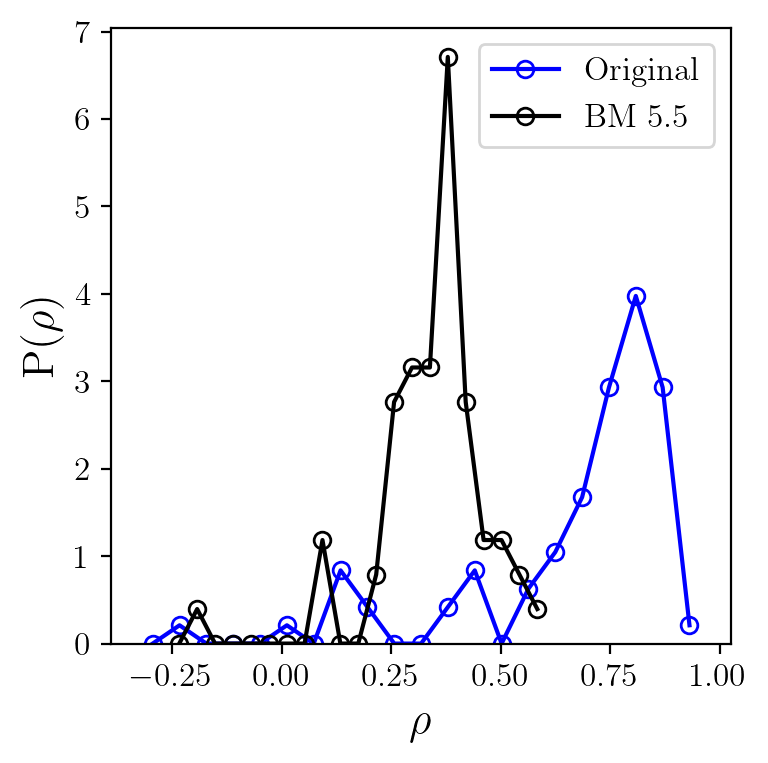

In [173]:
fig, ax = plt.subplots(figsize = (4,4), dpi = 200)

n_bins = 20
x = create_prob_dist_identical_bins(subset_svr_data["svr_rbf_spearman"], fig, ax, n_bins = n_bins, color = "blue", label = "Original")
x = create_prob_dist_identical_bins(new_svr_data["svr_rbf_spearman"], fig, ax, n_bins = n_bins, label = "BM 5.5")

ax.set_xlabel(r"$\rho$", fontsize = 16)
ax.set_ylabel(r"P($\rho$)", fontsize = 16)

ax.legend()

-0.7363733542187582 ZRank2
-0.7338946798137967 ITScorePP
-0.7223788977864368 $N_c$
-0.6610286952297088 PyDock
-0.6112308603249254 Rosetta
-0.5766304721937427 $S$
-0.5255882527345827 SVR
-0.521053725057393 VoroMQA


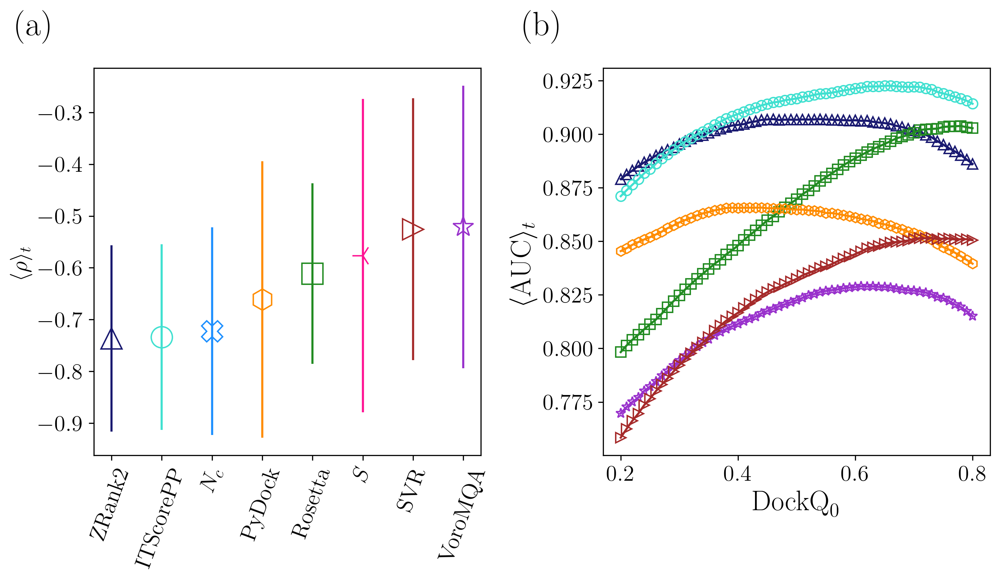

In [174]:
## Show a plot of the average spearman BUT NO DOVE

font_size = 16

%matplotlib inline

fig, ax = plt.subplots(1,2,figsize = (10,6), dpi = 300)
dockq_cutoffs = np.linspace(0.2, 0.8, 61)

#### Panel A ####

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid",
         "deeppink", "dodgerblue", "brown"]

markers = ["^", "o", "s", "h", "*","3", "X", ">"]

ss_plot_data = [np.mean(both_datasets_df["spearman_dockq_zrank"]), np.mean(both_datasets_df["spearman_dockq_itscorepp"]),
                    np.mean(both_datasets_df["spearman_dockq_rosetta"]), np.mean(both_datasets_df["spearman_dockq_pydock"]),
                    np.mean(both_datasets_df["spearman_dockq_voromqa"]*-1), np.mean(both_datasets_df["spearman_dockq_intertwined"]),
                    np.mean(both_datasets_df["spearman_dockq_contact_45"])*-1, np.mean(svr_overall_df["svr_rbf_spearman"]) *-1
               ]


ss_plot_std = [np.std(both_datasets_df["spearman_dockq_zrank"]), np.std(both_datasets_df["spearman_dockq_itscorepp"]),
                    np.std(both_datasets_df["spearman_dockq_rosetta"]), np.std(both_datasets_df["spearman_dockq_pydock"]),
                    np.std(both_datasets_df["spearman_dockq_voromqa"]), np.std(both_datasets_df["spearman_dockq_intertwined"]),
                    np.std(both_datasets_df["spearman_dockq_contact_45"]), np.std(svr_overall_df["svr_rbf_spearman"])
              ]

x_axis = range(len(ss_plot_data))


## Sort the data 
ss_plot_data = np.array(ss_plot_data)
ss_plot_std = np.array(ss_plot_std)
colors = np.array(colors)
markers = np.array(markers)

sort_inds = np.argsort(ss_plot_data)
ss_plot_data = ss_plot_data[sort_inds]
ss_plot_std = ss_plot_std[sort_inds]
colors = colors[sort_inds]
markers = markers[sort_inds]

deeprank_avg_score = np.mean(comb_score_list_84_ss[5])
deeprank_std_score = np.std(comb_score_list_84_ss[5])

score_list = ["ZRank2", "ITScorePP", "Rosetta",  "PyDock", "VoroMQA", 
             "$S$", "$N_c$", "SVR"]

score_list = np.array(score_list)
score_list = score_list[sort_inds]

for i in range(len(ss_plot_data)):
    print(ss_plot_data[i], score_list[i])
    if score_list[i] == "Deeprank-GNN":
        ax[0].errorbar(x_axis[i], deeprank_avg_score, yerr = deeprank_std_score, color = colors[i], marker = markers[i], 
                 label = score_list[i], markerfacecolor = "None", markersize = 15, alpha = 1)
    else:
        ax[0].errorbar(x_axis[i], ss_plot_data[i], yerr = ss_plot_std[i], color = colors[i], marker = markers[i], 
                     label = score_list[i], markerfacecolor = "None", markersize = 15, alpha = 1)

ax[0].set_xticks(x_axis, score_list, fontsize = 16, rotation = 70)

ax[0].set_ylabel(r"$\langle \rho \rangle_t$", fontsize = 16)


#### Panel B ####

## Plot the AUC as the DockQ Changes

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "brown"]

markers = ["^", "o", "s", "h", "*", '>']

labels = ["Zrank2", "ITScorePP", "Rosetta", "PyDock", "VoroMQA", "SVR"]

for i in range(len(labels)):
    if i < 4:
        ax[1].plot(dockq_cutoffs, dockq_sweep_data[i], marker = markers[i], color = colors[i], label = labels[i], markerfacecolor = "None", ms = 7)
    else:
        ax[1].plot(dockq_cutoffs, 1- np.array(dockq_sweep_data[i]), marker = markers[i], color = colors[i], label = labels[i], markerfacecolor = "None", ms = 7)

ax[1].set_xlabel(r"$\rm{DockQ}_{0}$", fontsize = 20) 
ax[1].set_ylabel(r"$\langle$AUC$\rangle_t$", fontsize = 20)

ax[1].tick_params(axis='both', which='major', labelsize=12)

## Formatting

ax[0].text(-0.1, 1.15, "(a)", transform=ax[0].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')
ax[1].text(-0.1, 1.15, "(b)", transform=ax[1].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')
ax[0].tick_params(axis='both', which='major', labelsize=font_size)
ax[1].tick_params(axis='both', which='major', labelsize=font_size)


fig.tight_layout()
plt.savefig(join(figure_save_dir, "combined_spearman_and_auc_cutoff.png"))

In [180]:
merged_structure_dict["1atn"][merged_structure_dict["1atn"]["DockQ"] > 0.9]

,Decoy,Model,Fnat,iRMSD,LRMSD,CAPRI,DockQ,IS-Score,ZRank,Rosetta,...,ZRank Z-score,Rosetta Z-score,PyDock Z-score,VoroMQA Z-score,Deeprank_gnn_esm Z-score,itscorepp Z-score,Intertwined Z-score,Contact_45 Z-score,svr_score,SVR
34,complex.0_17_0,0,0.882,0.592,1.599,High,0.905,0.8444,-115.6340,-1817.119,...,-0.898096,-0.610972,-1.028039,1.076113,0.907587,-1.313087,-0.024146,1.246784,1.302600,1.302600
38,complex.0_17_37,0,0.897,0.625,1.684,High,0.904,0.9027,-98.6955,-1835.816,...,-0.261444,-1.549048,-1.072240,1.063217,0.745683,-1.307495,0.143412,1.760107,1.435103,1.435103
39,complex.0_17_39,0,0.897,0.626,1.719,High,0.903,0.8654,-139.6730,-1821.531,...,-1.801629,-0.832333,-1.262618,1.055268,0.300447,-1.213303,0.059633,1.222340,1.284182,1.284182
225,complex.2_18_16,2,0.912,0.602,2.146,High,0.904,0.9109,-118.7040,-1833.768,...,-1.013486,-1.446295,-1.091168,1.255209,-0.104313,-1.353113,-1.218000,1.857883,1.442834,1.442834
380,complex.4_12_47,4,0.882,0.547,1.699,High,0.909,0.8555,-116.2710,-1836.449,...,-0.922039,-1.580807,-1.055392,1.070431,-0.023361,-1.383067,-1.176110,1.552334,1.429950,1.429950
501,complex.5_15_22,5,0.882,0.559,1.222,High,0.913,0.7945,-120.2010,-1820.942,...,-1.069752,-0.802781,-1.277286,1.260720,0.705207,-1.154144,-0.778159,1.051233,1.247476,1.247476
503,complex.5_15_7,5,0.868,0.562,1.178,High,0.909,0.8021,-121.6860,-1836.400,...,-1.125567,-1.578349,-0.979478,1.147939,0.826635,-1.038809,-0.840994,1.271228,1.357467,1.357467
504,complex.5_16_20,5,0.897,0.558,1.687,High,0.913,0.8200,-127.0390,-1830.682,...,-1.326766,-1.291462,-1.624348,1.043701,-0.104313,-1.510595,-0.987607,1.882327,1.445056,1.445056
507,complex.5_17_11,5,0.897,0.534,2.363,High,0.904,0.8665,-107.8730,-1841.724,...,-0.606390,-1.845468,-0.983839,1.388372,0.259971,-1.264437,-0.359263,1.637888,1.430263,1.430263
513,complex.5_18_27,5,0.912,0.548,1.410,High,0.922,0.8309,-111.2170,-1833.110,...,-0.732078,-1.413281,-1.175010,1.339367,-0.104313,-1.183311,-0.966662,1.491224,1.419477,1.419477


## Fixing the references: 

In [43]:
from __future__ import annotations

from pathlib import Path
import re

def _cap_after_colon(title: str) -> str:
    """
    Capitalize the first letter of every word after each ':' in a title.
    Tries to preserve LaTeX/braces by not lowercasing anything, only uppercasing
    the first alphabetic character of each word after ':'.
    """
    if not title or ":" not in title:
        return title

    parts = title.split(":")
    out = [parts[0]]  # keep everything before first colon as-is

    for tail in parts[1:]:
        # Keep the exact colon; process the tail
        # Preserve leading whitespace after ':' exactly
        m = re.match(r"^(\s*)(.*)$", tail, flags=re.DOTALL)
        lead_ws = m.group(1)
        rest = m.group(2)

        # Split into "words" but preserve whitespace between them
        tokens = re.split(r"(\s+)", rest)

        def cap_token(tok: str) -> str:
            # Only operate on non-whitespace tokens
            if not tok or tok.isspace():
                return tok

            # Find first alphabetic character not inside a leading brace sequence like "{\LaTeX}"
            # We'll capitalize the first [A-Za-z] we see, leaving everything else untouched.
            chars = list(tok)
            for i, ch in enumerate(chars):
                if ch.isalpha():
                    chars[i] = ch.upper()
                    break
            return "".join(chars)

        tokens = [cap_token(t) for t in tokens]
        out.append(lead_ws + "".join(tokens))

    return ":".join(out)


def clean_bib_file(bib_path: str | Path) -> Path:
    """
    Clean a BibTeX file for APS/PRE-style usage:
      - Keep only essential fields by entry type
      - Remove common Zotero/noise fields (eprint, abstract, keywords, file, etc.)
      - Remove 'publisher' for @article entries (often shows up as 'Nature', etc.)
      - If DOI exists, drop URL to reduce clutter (you can change this behavior)
      - Capitalize words after ':' in titles
      - Write <stem>_cleaned.bib next to the input file
    """
    bib_path = Path(bib_path).expanduser().resolve()
    if not bib_path.exists():
        raise FileNotFoundError(f"Not found: {bib_path}")

    try:
        import bibtexparser
        from bibtexparser.bparser import BibTexParser
        from bibtexparser.bwriter import BibTexWriter
    except ImportError as e:
        raise ImportError(
            "This function uses 'bibtexparser'. Install it in your notebook with:\n"
            "  !pip install bibtexparser\n"
        ) from e

    # Fields we generally want to keep for PRE manuscripts (tweak as you like)
    KEEP_BY_TYPE = {
        "article": {
            "author", "title", "journal", "year", "volume", "number", "issue",
            "pages", "month", "doi", "note"
        },
        "inproceedings": {
            "author", "title", "booktitle", "year", "pages", "doi",
            "organization", "publisher", "address", "month", "note"
        },
        "proceedings": {
            "editor", "title", "year", "publisher", "address", "month", "note"
        },
        "book": {
            "author", "editor", "title", "publisher", "year", "address",
            "edition", "volume", "series", "doi", "isbn", "note"
        },
        "inbook": {
            "author", "editor", "title", "chapter", "pages", "publisher",
            "year", "address", "edition", "volume", "series", "doi", "note"
        },
        "phdthesis": {
            "author", "title", "school", "year", "address", "month", "doi", "note"
        },
        "mastersthesis": {
            "author", "title", "school", "year", "address", "month", "doi", "note"
        },
        "techreport": {
            "author", "title", "institution", "year", "number", "address",
            "month", "doi", "note"
        },
        "misc": {
            "author", "title", "howpublished", "year", "month", "doi", "url", "note"
        },
        "unpublished": {
            "author", "title", "note", "year", "month"
        },
    }

    # Stuff almost always safe to remove from Zotero exports for APS BibTeX workflows
    DROP_ALWAYS = {
        "abstract", "keywords", "file", "attachment", "annote",
        "language", "rights", "copyright",
        "issn", "isbn-13", "isbn-10", "isbn",
        "pmid", "pmcid",
        "urldate", "date-added", "date-modified", "accessed",
        "editorial", "shorttitle", "short-title",
        "note",  # NOTE: we keep 'note' above; this is here only if you want to force-drop globally (disabled below)
    }
    # Don’t globally drop note; it can be useful. Remove it from DROP_ALWAYS:
    DROP_ALWAYS.discard("note")

    # arXiv/eprint style fields (you explicitly mentioned eprint)
    DROP_EPRINT = {
        "eprint", "eprinttype", "eprintclass",
        "archiveprefix", "primaryclass",
        "arxivid", "arxivId", "arxiv-id",
    }

    # If DOI exists, we often don’t need URL (APS styles usually render DOI cleanly)
    DROP_URL_IF_DOI = True

    parser = BibTexParser(common_strings=True)
    with bib_path.open("r", encoding="utf-8") as f:
        bib_db = bibtexparser.load(f, parser=parser)

    cleaned_entries = []
    for entry in bib_db.entries:
        etype = (entry.get("ENTRYTYPE") or "").lower().strip()
        keep = KEEP_BY_TYPE.get(etype, None)

        # Start from a copy
        e = dict(entry)

        # Normalize field keys to lowercase (bibtexparser usually does this, but just in case)
        normalized = {}
        for k, v in e.items():
            nk = k.lower()
            normalized[nk] = v
        e = normalized

        # Ensure required meta keys exist in expected casing for writer
        entrytype = e.get("entrytype", etype)
        entryid = e.get("id", entry.get("ID") or entry.get("id"))
        if not entryid:
            # bibtexparser typically uses 'ID' at parse-time; ensure we have something
            entryid = entry.get("ID") or entry.get("id") or "missing_id"

        # Fix title capitalization rule (only touches after ':')
        if "title" in e:
            e["title"] = _cap_after_colon(e["title"])

        # Drop eprint/arxiv & always-drop fields
        for k in list(e.keys()):
            if k in DROP_ALWAYS or k in DROP_EPRINT:
                e.pop(k, None)

        # Special rule: remove publisher for journal articles (common Zotero annoyance like "Nature")
        if entrytype == "article":
            e.pop("publisher", None)

        # If DOI exists, drop URL (optional)
        if DROP_URL_IF_DOI and ("doi" in e) and ("url" in e):
            e.pop("url", None)

        # If we have a whitelist for this type, enforce it (but always keep ENTRYTYPE/ID)
        if keep is not None:
            kept = {"entrytype": entrytype, "id": entryid}
            for k in keep:
                if k in e:
                    kept[k] = e[k]
            e = kept
        else:
            # Unknown type: keep ENTRYTYPE/ID + a conservative subset
            fallback_keep = {"author", "title", "year", "doi", "journal", "booktitle",
                             "publisher", "school", "institution", "howpublished", "url", "note"}
            kept = {"entrytype": entrytype, "id": entryid}
            for k in fallback_keep:
                if k in e:
                    kept[k] = e[k]
            e = kept

        # Writer expects 'ENTRYTYPE' and 'ID' keys with exact case
        # Convert back to that convention
        final = {"ENTRYTYPE": e.pop("entrytype"), "ID": e.pop("id")}
        final.update(e)

        cleaned_entries.append(final)

    # Write output
    out_path = bib_path.with_name(bib_path.stem + "_cleaned.bib")

    writer = BibTexWriter()
    writer.indent = "  "
    writer.order_entries_by = None  # preserve input order as much as possible

    bib_db.entries = cleaned_entries
    with out_path.open("w", encoding="utf-8") as f:
        f.write(writer.write(bib_db))

    return out_path





In [45]:
from __future__ import annotations
from pathlib import Path
import re


def _cap_after_colon(title: str) -> str:
    """
    Capitalize the first letter of every word after each ':' in a title.
    Does NOT lowercase anything; only uppercases the first alphabetic
    character of each word after ':'.
    """
    if not title or ":" not in title:
        return title

    parts = title.split(":")
    out = [parts[0]]

    for tail in parts[1:]:
        m = re.match(r"^(\s*)(.*)$", tail, flags=re.DOTALL)
        lead_ws, rest = m.groups()

        tokens = re.split(r"(\s+)", rest)

        def cap(tok):
            if tok.isspace():
                return tok
            chars = list(tok)
            for i, ch in enumerate(chars):
                if ch.isalpha():
                    chars[i] = ch.upper()
                    break
            return "".join(chars)

        out.append(lead_ws + "".join(cap(t) for t in tokens))

    return ":".join(out)


def clean_bib_file(bib_path: str | Path) -> Path:
    """
    Clean a BibTeX file for APS/PRE (REVTeX) usage.
    """
    bib_path = Path(bib_path).expanduser().resolve()
    if not bib_path.exists():
        raise FileNotFoundError(bib_path)

    try:
        import bibtexparser
        from bibtexparser.bparser import BibTexParser
        from bibtexparser.bwriter import BibTexWriter
    except ImportError:
        raise ImportError("Run: !pip install bibtexparser")

    # ---- Fields to KEEP by entry type ----
    KEEP_BY_TYPE = {
        "article": {
            "author", "title", "journal", "year",
            "volume", "number", "pages", "month", "doi"
        },
        "inproceedings": {
            "author", "title", "booktitle", "year",
            "pages", "doi", "organization"
        },
        "book": {
            "author", "editor", "title", "publisher",
            "year", "edition", "doi", "isbn"
        },
        "phdthesis": {
            "author", "title", "school", "year"
        },
        "mastersthesis": {
            "author", "title", "school", "year"
        },
        "techreport": {
            "author", "title", "institution", "year", "number"
        },
        "misc": {
            "author", "title", "howpublished", "year", "doi", "url"
        },
    }

    # ---- Fields to ALWAYS DROP ----
    DROP_ALWAYS = {
        "note",        # <-- THE IMPORTANT FIX
        "abstract", "keywords", "file", "attachment",
        "language", "rights",
        "issn", "isbn-10", "isbn-13",
        "pmid", "pmcid",
        "urldate", "accessed"
    }

    DROP_EPRINT = {
        "eprint", "eprinttype", "eprintclass",
        "archiveprefix", "primaryclass",
        "arxivid", "arxiv-id"
    }

    parser = BibTexParser(common_strings=True)
    with bib_path.open("r", encoding="utf-8") as f:
        bib_db = bibtexparser.load(f, parser=parser)

    cleaned = []
    for entry in bib_db.entries:
        etype = entry["ENTRYTYPE"].lower()
        eid = entry["ID"]

        e = {k.lower(): v for k, v in entry.items()}

        # ---- Fix title capitalization ----
        if "title" in e:
            e["title"] = _cap_after_colon(e["title"])

        # ---- Drop junk fields ----
        for k in list(e):
            if k in DROP_ALWAYS or k in DROP_EPRINT:
                e.pop(k, None)

        # ---- Article-specific cleanup ----
        if etype == "article":
            e.pop("publisher", None)

        # ---- Drop URL if DOI exists ----
        if "doi" in e and "url" in e:
            e.pop("url")

        # ---- Enforce whitelist ----
        keep = KEEP_BY_TYPE.get(etype)
        if keep:
            e = {k: v for k, v in e.items() if k in keep}

        # ---- Restore required BibTeX keys ----
        final = {"ENTRYTYPE": etype, "ID": eid}
        final.update(e)
        cleaned.append(final)

    # ---- Write output ----
    out_path = bib_path.with_name(bib_path.stem + "_cleaned.bib")
    writer = BibTexWriter()
    writer.indent = "  "
    writer.order_entries_by = None

    bib_db.entries = cleaned
    with out_path.open("w", encoding="utf-8") as f:
        f.write(writer.write(bib_db))

    return out_path


# Example:
# clean_bib_file("/path/to/references.bib")


In [47]:
from __future__ import annotations
from pathlib import Path
import re


def _cap_after_colon(title: str) -> str:
    """
    Capitalize the first letter of every word after each ':' in a title.
    Does NOT lowercase anything; only uppercases the first alphabetic
    character of each word after ':'.
    """
    if not title or ":" not in title:
        return title

    parts = title.split(":")
    out = [parts[0]]

    for tail in parts[1:]:
        m = re.match(r"^(\s*)(.*)$", tail, flags=re.DOTALL)
        lead_ws, rest = m.groups()

        tokens = re.split(r"(\s+)", rest)

        def cap(tok):
            if tok.isspace():
                return tok
            chars = list(tok)
            for i, ch in enumerate(chars):
                if ch.isalpha():
                    chars[i] = ch.upper()
                    break
            return "".join(chars)

        out.append(lead_ws + "".join(cap(t) for t in tokens))

    return ":".join(out)


def clean_bib_file(bib_path: str | Path) -> Path:
    """
    Clean a BibTeX file for APS/PRE (REVTeX) usage.
    """
    bib_path = Path(bib_path).expanduser().resolve()
    if not bib_path.exists():
        raise FileNotFoundError(bib_path)

    try:
        import bibtexparser
        from bibtexparser.bparser import BibTexParser
        from bibtexparser.bwriter import BibTexWriter
    except ImportError:
        raise ImportError("Run: !pip install bibtexparser")

    # ---- Fields to KEEP by entry type ----
    KEEP_BY_TYPE = {
        "article": {
            "author", "title", "journal", "year",
            "volume", "number", "pages", "month", "doi"
        },
        "inproceedings": {
            "author", "title", "booktitle", "year",
            "pages", "doi", "organization"
        },
        "book": {
            "author", "editor", "title", "publisher",
            "year", "edition", "doi", "isbn"
        },
        "phdthesis": {
            "author", "title", "school", "year"
        },
        "mastersthesis": {
            "author", "title", "school", "year"
        },
        "techreport": {
            "author", "title", "institution", "year", "number"
        },
        "misc": {
            "author", "title", "howpublished", "year", "doi", "url"
        },
    }

    # ---- Fields to ALWAYS DROP ----
    DROP_ALWAYS = {
        "note",
        "abstract", "keywords", "file", "attachment",
        "language", "rights",
        "issn", "isbn-10", "isbn-13",
        "pmid", "pmcid",
        "urldate", "accessed"
    }

    DROP_EPRINT = {
        "eprint", "eprinttype", "eprintclass",
        "archiveprefix", "primaryclass",
        "arxivid", "arxiv-id"
    }

    PROTEINS_FULL_NAME = "Proteins: Structure, Function, and Bioinformatics"

    parser = BibTexParser(common_strings=True)
    with bib_path.open("r", encoding="utf-8") as f:
        bib_db = bibtexparser.load(f, parser=parser)

    cleaned = []
    for entry in bib_db.entries:
        etype = entry["ENTRYTYPE"].lower()
        eid = entry["ID"]

        e = {k.lower(): v for k, v in entry.items()}

        # ---- Fix title capitalization ----
        if "title" in e:
            e["title"] = _cap_after_colon(e["title"])

        # ---- Normalize journal name for Proteins ----
        if "journal" in e:
            if re.search(r"\bproteins\b", e["journal"], flags=re.IGNORECASE):
                e["journal"] = PROTEINS_FULL_NAME

        # ---- Drop junk fields ----
        for k in list(e):
            if k in DROP_ALWAYS or k in DROP_EPRINT:
                e.pop(k, None)

        # ---- Article-specific cleanup ----
        if etype == "article":
            e.pop("publisher", None)

        # ---- Drop URL if DOI exists ----
        if "doi" in e and "url" in e:
            e.pop("url")

        # ---- Enforce whitelist ----
        keep = KEEP_BY_TYPE.get(etype)
        if keep:
            e = {k: v for k, v in e.items() if k in keep}

        # ---- Restore required BibTeX keys ----
        final = {"ENTRYTYPE": etype, "ID": eid}
        final.update(e)
        cleaned.append(final)

    # ---- Write output ----
    out_path = bib_path.with_name(bib_path.stem + "_cleaned.bib")
    writer = BibTexWriter()
    writer.indent = "  "
    writer.order_entries_by = None

    bib_db.entries = cleaned
    with out_path.open("w", encoding="utf-8") as f:
        f.write(writer.write(bib_db))

    return out_path


# Example usage:
# clean_bib_file("/path/to/references.bib")


In [48]:
# --- Example usage (run this) ---
clean_bib_file("/Users/jakesumner/Desktop/nsf_grant_2025/ppi_pre_references.bib")

PosixPath('/Users/jakesumner/Desktop/nsf_grant_2025/ppi_pre_references_cleaned.bib')